This notebook implements a deep learning framework for identifying metabolic vulnerabilities in cancer tissue using spatial transcriptomics (Visium) data. We use pathway-based features combined with spatial context to predict proliferative capacity and identify high-risk metabolic states.

In [1]:
# imports Libraries
import os
import warnings
import json
from pathlib import Path
import numpy as np
import pandas as pd
from scipy import sparse, stats
from scipy.spatial import distance_matrix
from scipy.sparse import coo_matrix
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.image as mpimg
import seaborn as sns
import scanpy as sc
import gc
import squidpy as sq
import sccellfie
from sklearn.neighbors import NearestNeighbors
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA, NMF
from sklearn.metrics import roc_curve
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.model_selection import train_test_split, KFold
from sklearn.model_selection import GroupKFold
from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import (
    silhouette_score, davies_bouldin_score,
    accuracy_score, roc_auc_score, confusion_matrix,
    mean_squared_error, r2_score
)
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from scipy.stats import ttest_rel, wilcoxon
from scipy.stats import mannwhitneyu
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.optim as optim
from statsmodels.stats.multitest import multipletests
from sklearn.pipeline import Pipeline

try:
    import gseapy as gp
    import decoupler as dc
    PATHWAY_AVAILABLE = True
except ImportError:
    PATHWAY_AVAILABLE = False
    

# Settings
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

# Random seed for reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Scanpy settings
sc.settings.verbosity = 2
sc.set_figure_params(dpi=100, figsize=(8, 6), frameon=False)
sc.settings.figdir = './figures/'

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
print(f"Random seed: {RANDOM_SEED}")
print(f"PyTorch version: {torch.__version__}")
print(f"Scanpy version: {sc.__version__}")

/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/opt/anaconda3/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


Using device: cpu
Random seed: 42
PyTorch version: 2.2.2
Scanpy version: 1.10.3


In [2]:
#  CONFIGURATION
from dataclasses import dataclass, field
from typing import Dict, List
import numpy as np
import torch

@dataclass
class Config:
    
    # FILE PATHS 
    DATA_DIR: str = ""
    H5_FILE: str = "Visium_Human_Breast_Cancer_filtered_feature_bc_matrix.h5"
    SPATIAL_DIR: str = "spatial"
    
    #  RANDOM SEED
    RANDOM_SEED: int = 42
    
    #  QC THRESHOLDS
    MIN_COUNTS: int = 500
    MIN_GENES: int = 200
    MAX_MT_PCT: float = 20.0
    MIN_CELLS: int = 5
    MIN_PATHWAY_GENES: int = 3
    
    # MODEL HYPERPARAMETERS 
    HIDDEN_DIM1: int = 64
    HIDDEN_DIM2: int = 32
    DROPOUT: float = 0.3
    LEARNING_RATE: float = 0.001
    WEIGHT_DECAY: float = 0.01
    BATCH_SIZE: int = 64
    N_EPOCHS: int = 150
    EARLY_STOPPING_PATIENCE: int = 20
    EARLY_STOPPING_MIN_DELTA: float = 0.001
    
    #  METABOLIC PATHWAYS
    METABOLIC_PATHWAYS: Dict[str, List[str]] = field(default_factory=lambda: {
        'Glycolysis': [
            'HK1', 'HK2', 'HK3', 'GPI', 'PFKL', 'PFKM', 'PFKP', 
            'ALDOA', 'ALDOB', 'ALDOC', 'TPI1', 'GAPDH', 'PGK1', 
            'PGK2', 'PGAM1', 'PGAM2', 'ENO1', 'ENO2', 'ENO3',
            'PKM', 'PKLR', 'LDHA', 'LDHB', 'LDHC'
        ],
        'TCA_Cycle': [
            'CS', 'ACO1', 'ACO2', 'IDH1', 'IDH2', 'IDH3A', 'IDH3B', 
            'IDH3G', 'OGDH', 'DLST', 'SUCLA2', 'SUCLG1', 'SUCLG2', 
            'SDHA', 'SDHB', 'SDHC', 'SDHD', 'FH', 'MDH1', 'MDH2'
        ],
        'Oxidative_Phosphorylation': [
            'NDUFA1', 'NDUFA2', 'NDUFA3', 'NDUFA4', 'NDUFA5', 'NDUFA6',
            'NDUFB1', 'NDUFB2', 'NDUFB3', 'NDUFB4', 'NDUFB5',
            'NDUFS1', 'NDUFS2', 'NDUFS3', 'NDUFS4', 'NDUFS5',
            'SDHA', 'SDHB', 'SDHC', 'SDHD',
            'UQCRC1', 'UQCRC2', 'UQCRFS1', 'CYC1',
            'COX4I1', 'COX5A', 'COX5B', 'COX6A1', 'COX6B1', 'COX7A1',
            'ATP5F1A', 'ATP5F1B', 'ATP5F1C', 'ATP5F1D', 'ATP5F1E',
            'ATP5PO', 'ATP5PD', 'ATP5PB', 'ATP5MF', 'ATP5MC1'
        ],
        'Fatty_Acid_Oxidation': [
            'CPT1A', 'CPT1B', 'CPT1C', 'CPT2', 'ACADVL', 'ACADM', 
            'ACADS', 'HADHA', 'HADHB', 'ECHS1', 'ACAA1', 'ACAA2'
        ],
        'Fatty_Acid_Synthesis': [
            'ACLY', 'ACACA', 'ACACB', 'FASN', 'SCD', 'SCD5',
            'ELOVL1', 'ELOVL2', 'ELOVL3', 'ELOVL4', 'ELOVL5', 
            'ELOVL6', 'ELOVL7'
        ],
        'Pentose_Phosphate': [
            'G6PD', 'PGD', 'RPIA', 'RPE', 'RBKS', 'TALDO1', 'TKT',
            'PRPS1', 'PRPS2'
        ],
        'Glutaminolysis': [
            'GLS', 'GLS2', 'GLUD1', 'GLUD2', 'GOT1', 'GOT2', 
            'GPT', 'GPT2'
        ],
        'One_Carbon_Metabolism': [
            'SHMT1', 'SHMT2', 'MTHFD1', 'MTHFD2', 'MTHFD1L', 
            'MTHFD2L', 'MTR', 'MTRR', 'TYMS', 'DHFR'
        ],
        'Amino_Acid_Metabolism': [
            'GOT1', 'GOT2', 'GPT', 'GPT2', 'BCAT1', 'BCAT2',
            'GLUD1', 'GLUD2', 'TAT', 'HDC', 'DDC', 'GAD1', 'GAD2'
        ]
    })
    
    #  PROLIFERATION GENES
    PROLIFERATION_GENES: List[str] = field(default_factory=lambda: [
        'MKI67', 'TOP2A', 'PCNA', 'CCNB1', 'CCNB2', 'CDK1', 'BIRC5'
    ])
    
    def __post_init__(self):
        """Set random seeds for reproducibility."""
        np.random.seed(self.RANDOM_SEED)
        torch.manual_seed(self.RANDOM_SEED)
        if torch.cuda.is_available():
            torch.cuda.manual_seed(self.RANDOM_SEED)
            torch.cuda.manual_seed_all(self.RANDOM_SEED)
            torch.backends.cudnn.deterministic = True
            torch.backends.cudnn.benchmark = False

# Initialize global config
CFG = Config()
print(" Configuration loaded")
print(f"  Random seed: {CFG.RANDOM_SEED}")
print(f"  Pathways defined: {len(CFG.METABOLIC_PATHWAYS)}")
print(f"  Proliferation genes: {len(CFG.PROLIFERATION_GENES)}")

 Configuration loaded
  Random seed: 42
  Pathways defined: 9
  Proliferation genes: 7


In [3]:
#  DIRECTORY SETUP & INITIALIZATION

print("SETTING UP DIRECTORY STRUCTURE")
print("="*80)

# Define all output directories
OUTPUT_DIRS = {
    'figures': 'figures',
    'tables': 'results/tables',
    'models': 'results/models', 
    'metrics': 'results/metrics',
    'processed_data': 'data/processed',
    'intermediate': 'data/intermediate'
}

# Create all directories
print("\nCreating output directories")
created = []
existing = []

for name, path in OUTPUT_DIRS.items():
    if not os.path.exists(path):
        os.makedirs(path, exist_ok=True)
        created.append(path)
        print(f"   Created: {path}")
    else:
        existing.append(path)
        print(f"   Exists:  {path}")

print(f"\nDirectory setup complete:")
print(f"  Created: {len(created)} directories")
print(f"  Existing: {len(existing)} directories")

# Verify all directories exist
for path in OUTPUT_DIRS.values():
    assert os.path.exists(path), f"Failed to create {path}"

print("\n All output directories ready")

# Store paths in config for easy access
class Paths:
    """Container for all file paths used in analysis."""
    FIGURES = OUTPUT_DIRS['figures']
    TABLES = OUTPUT_DIRS['tables']
    MODELS = OUTPUT_DIRS['models']
    METRICS = OUTPUT_DIRS['metrics']
    PROCESSED = OUTPUT_DIRS['processed_data']
    INTERMEDIATE = OUTPUT_DIRS['intermediate']

# Test write permissions
print("\nTesting write permissions")
for name, path in OUTPUT_DIRS.items():
    test_file = os.path.join(path, '.write_test')
    try:
        with open(test_file, 'w') as f:
            f.write('test')
        os.remove(test_file)
        print(f"   {name}: writable")
    except Exception as e:
        print(f"   {name}: ERROR - {e}")
        raise

print("\n All directories have write permissions")

SETTING UP DIRECTORY STRUCTURE

Creating output directories
   Exists:  figures
   Exists:  results/tables
   Exists:  results/models
   Exists:  results/metrics
   Exists:  data/processed
   Exists:  data/intermediate

Directory setup complete:
  Created: 0 directories
  Existing: 6 directories

 All output directories ready

Testing write permissions
   figures: writable
   tables: writable
   models: writable
   metrics: writable
   processed_data: writable
   intermediate: writable

 All directories have write permissions


In [4]:
# UTILITY FUNCTIONS


import scanpy as sc
import numpy as np
import pandas as pd
from typing import Tuple, List, Dict

def score_pathways(adata, 
                  pathway_dict: Dict[str, List[str]] = None,
                  min_genes: int = None, 
                  use_raw: bool = False) -> Tuple[List[str], pd.DataFrame]:
    
    if pathway_dict is None:
        pathway_dict = CFG.METABOLIC_PATHWAYS
    if min_genes is None:
        min_genes = CFG.MIN_PATHWAY_GENES
    
    valid_pathways = []
    pathway_stats = []
    
    print(f"\n{'Pathway':<30s} | Total | Present | Coverage | Status")
    print(f"{'-'*75}")
    
    for pathway_name, gene_list in pathway_dict.items():
        genes_present = [g for g in gene_list if g in adata.var_names]
        n_genes = len(genes_present)
        coverage = 100 * n_genes / len(gene_list)
        
        status = " SCORED" if n_genes >= min_genes else "✗ SKIP"
        print(f"{pathway_name:<30s} | {len(gene_list):5d} | {n_genes:7d} | {coverage:7.1f}% | {status}")
        
        if n_genes >= min_genes:
            sc.tl.score_genes(
                adata, 
                gene_list=genes_present, 
                score_name=f'pathway_{pathway_name}', 
                use_raw=use_raw
            )
            valid_pathways.append(pathway_name)
            pathway_stats.append({
                'Pathway': pathway_name,
                'Total_Genes': len(gene_list),
                'Present_Genes': n_genes,
                'Coverage_Pct': coverage
            })
    
    summary_df = pd.DataFrame(pathway_stats)
    print(f"\n Successfully scored {len(valid_pathways)}/{len(pathway_dict)} pathways")
    print(f"  Mean coverage: {summary_df['Coverage_Pct'].mean():.1f}%")
    
    return valid_pathways, summary_df

def compute_auc_ci(y_true, y_pred, n_bootstraps=1000, ci=95):
    """Compute AUC with bootstrap confidence intervals."""
    from sklearn.metrics import roc_auc_score
    
    rng = np.random.RandomState(CFG.RANDOM_SEED)
    aucs = []
    n = len(y_true)
    
    for i in range(n_bootstraps):
        indices = rng.choice(n, size=n, replace=True)
        try:
            auc = roc_auc_score(y_true[indices], y_pred[indices])
            aucs.append(auc)
        except:
            continue
    
    aucs = np.array(aucs)
    mean_auc = np.mean(aucs)
    lower = np.percentile(aucs, (100 - ci) / 2)
    upper = np.percentile(aucs, 100 - (100 - ci) / 2)
    
    return mean_auc, lower, upper

def compute_morans_i(values: np.ndarray, W) -> float:
    """
    Compute Moran's I statistic for spatial autocorrelation (vectorized).
    
    Parameters
    ----------
    values : np.ndarray, shape (n_spots,)
        Variable values for each spatial location
    W : scipy.sparse matrix, shape (n_spots, n_spots)
        Spatial weights matrix
    
    Returns
    -------
    float
        Moran's I statistic
    """
    n = len(values)
    values_centered = values - np.mean(values)
    numerator = values_centered @ W @ values_centered
    denominator = np.sum(values_centered**2)
    W_sum = W.sum()
    I = (n / W_sum) * (numerator / denominator)
    return I


print(" Utility functions loaded")

 Utility functions loaded


### Deep Learning Model Architecture

#### Model Selection

We use a single canonical model architecture throughout this analysis: **MetabolicVulnerabilityNet**.

**Architecture Design:**
- **Type:** Feedforward neural network
- **Layers:** 3 hidden layers with progressive dimensionality reduction
- **Dimensions:** 64 → 32 → 16 neurons
- **Regularization:** Batch normalization + Dropout (0.3)
- **Activation:** ReLU (hidden layers), Sigmoid (output)

**Design Rationale:**
1. **Progressive reduction** (64→32→16) creates information bottleneck that forces learning of compressed metabolic representations
2. **Batch normalization** stabilizes training and improves convergence
3. **Dropout (p=0.3)** prevents overfitting on high-dimensional input
4. **Three layers** balance capacity and overfitting risk for our dataset size

In [5]:
#  CANONICAL MODEL DEFINITION

class MetabolicVulnerabilityNet(nn.Module):
    
    VERSION = "1.0.0"
    
    def __init__(self, 
                 input_dim,
                 hidden_dim1=None,
                 hidden_dim2=None,
                 hidden_dim3=None,
                 dropout=None):
        super(MetabolicVulnerabilityNet, self).__init__()
        
        # Use Config values if not provided
        if hidden_dim1 is None:
            hidden_dim1 = getattr(CFG, 'HIDDEN_DIM1', 64)
        if hidden_dim2 is None:
            hidden_dim2 = getattr(CFG, 'HIDDEN_DIM2', 32)
        if hidden_dim3 is None:
            hidden_dim3 = getattr(CFG, 'HIDDEN_DIM3', 16)
        if dropout is None:
            dropout = getattr(CFG, 'DROPOUT', 0.3)
        
        # Validation
        assert input_dim > 0, "input_dim must be positive"
        assert hidden_dim1 > 0, "hidden_dim1 must be positive"
        assert hidden_dim2 > 0, "hidden_dim2 must be positive"
        assert hidden_dim3 > 0, "hidden_dim3 must be positive"
        assert 0 <= dropout < 1, "dropout must be in [0, 1)"
        
        # Build network
        self.network = nn.Sequential(
            # Layer 1
            nn.Linear(input_dim, hidden_dim1),
            nn.BatchNorm1d(hidden_dim1),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            # Layer 2
            nn.Linear(hidden_dim1, hidden_dim2),
            nn.BatchNorm1d(hidden_dim2),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            # Layer 3
            nn.Linear(hidden_dim2, hidden_dim3),
            nn.BatchNorm1d(hidden_dim3),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            # Output layer
            nn.Linear(hidden_dim3, 1),
            nn.Sigmoid()
        )
        
        # Store architecture details
        self.input_dim = input_dim
        self.architecture = {
            'input_dim': input_dim,
            'hidden_dim1': hidden_dim1,
            'hidden_dim2': hidden_dim2,
            'hidden_dim3': hidden_dim3,
            'dropout': dropout,
            'version': self.VERSION
        }
    
    def forward(self, x):
        """
        Forward pass through the network.
        
        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape (batch_size, input_dim)
        
        Returns
        -------
        torch.Tensor
            Output probabilities of shape (batch_size, 1)
        """
        return self.network(x)
    
    def get_num_parameters(self):
        """Count total trainable parameters."""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)
    
    def __repr__(self):
        params = self.get_num_parameters()
        return (f"MetabolicVulnerabilityNet(\n"
                f"  input_dim={self.architecture['input_dim']},\n"
                f"  hidden=[{self.architecture['hidden_dim1']}, "
                f"{self.architecture['hidden_dim2']}, "
                f"{self.architecture['hidden_dim3']}],\n"
                f"  dropout={self.architecture['dropout']},\n"
                f"  version={self.VERSION},\n"
                f"  parameters={params:,}\n"
                f")")



# MODEL VERIFICATION

print("\n" + "="*80)
print("MODEL DEFINITION LOADED")
print("="*80)

print(f"\nCanonical Model: MetabolicVulnerabilityNet v{MetabolicVulnerabilityNet.VERSION}")
print("\n  This is the ONLY model class used in this notebook.")
print("    All other model definitions should be deleted.")

# Test instantiation
print("\n" + "-"*80)
print("Testing model instantiation")

test_input_dim = 50  # Example dimension
test_model = MetabolicVulnerabilityNet(input_dim=test_input_dim)

print(f"\n{test_model}")

# Test forward pass
print("\nTesting forward pass")
test_input = torch.randn(16, test_input_dim)
test_output = test_model(test_input)

assert test_output.shape == (16, 1), f"Output shape incorrect: {test_output.shape}"
assert (test_output >= 0).all() and (test_output <= 1).all(), "Output not in [0,1]"

print(f"   Input:  {test_input.shape}")
print(f"   Output: {test_output.shape}")
print(f"   Range:  [{test_output.min():.4f}, {test_output.max():.4f}]")

# Cleanup
del test_model, test_input, test_output



MODEL DEFINITION LOADED

Canonical Model: MetabolicVulnerabilityNet v1.0.0

  This is the ONLY model class used in this notebook.
    All other model definitions should be deleted.

--------------------------------------------------------------------------------
Testing model instantiation

MetabolicVulnerabilityNet(
  input_dim=50,
  hidden=[64, 32, 16],
  dropout=0.3,
  version=1.0.0,
  parameters=6,113
)

Testing forward pass
   Input:  torch.Size([16, 50])
   Output: torch.Size([16, 1])
   Range:  [0.5006, 0.7555]


In [6]:
os.environ["OMP_NUM_THREADS"]="1"
os.environ["OPENBLAS_NUM_THREADS"]="1"
os.environ["MKL_NUM_THREADS"]="1"
os.environ["NUMEXPR_NUM_THREADS"]="1"

In [7]:
# Create output directories
output_dirs = [
    'figures',
    'results',
    'models',
    'data/processed'
]

for dir_path in output_dirs:
    Path(dir_path).mkdir(parents=True, exist_ok=True)
    
print("Output directories created successfully!")

Output directories created successfully!


In [8]:
# file paths
DATA_DIR = ""  
H5_FILE = "Visium_Human_Breast_Cancer_filtered_feature_bc_matrix.h5"  
SPATIAL_DIR = "spatial"  
COORDS_CSV = "Spatial-Projection.csv"  

# Full paths
h5_path = os.path.join(DATA_DIR, H5_FILE)
spatial_path = os.path.join(DATA_DIR, SPATIAL_DIR)

print(f"Data directory: {DATA_DIR}")
print(f"H5 file: {h5_path}")
print(f"Spatial directory: {spatial_path}")

Data directory: 
H5 file: Visium_Human_Breast_Cancer_filtered_feature_bc_matrix.h5
Spatial directory: spatial


In [9]:
# Loading 10x Visium data
print("Loading 10x Visium data")

# Load using scanpy
adata = sc.read_visium(
    path=DATA_DIR,
    count_file=H5_FILE,
    load_images=True,
    source_image_path=spatial_path
)

# Make variable names unique
adata.var_names_make_unique()

# Convert to sparse if not already
if not sparse.issparse(adata.X):
    adata.X = sparse.csr_matrix(adata.X)

# Ensure float32 for memory efficiency
if adata.X.dtype != np.float32:
    adata.X = adata.X.astype(np.float32)

print(f"\nLoaded data: {adata.n_obs} spots × {adata.n_vars} genes")
print(f"Spatial coordinates available: {'spatial' in adata.obsm}")
print(f"Images loaded: {'images' in adata.uns}")
print(f"\nAnnData object:")
print(adata)

Loading 10x Visium data
reading Visium_Human_Breast_Cancer_filtered_feature_bc_matrix.h5
 (0:00:01)

Loaded data: 4898 spots × 36601 genes
Spatial coordinates available: True
Images loaded: False

AnnData object:
AnnData object with n_obs × n_vars = 4898 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [10]:
if adata.n_vars > 30000:
    sc.pp.filter_genes(adata, min_cells=3)

filtered out 15250 genes that are detected in less than 3 cells


In [11]:
# Extract and store spatial coordinates in obs for easy access
if 'spatial' in adata.obsm:
    adata.obs['x_coord'] = adata.obsm['spatial'][:, 0]
    adata.obs['y_coord'] = adata.obsm['spatial'][:, 1]
    print("Spatial coordinates added to adata.obs")
else:
    print("Warning: No spatial coordinates found in adata.obsm['spatial']")
    print("Available obsm keys:", list(adata.obsm.keys()))

Spatial coordinates added to adata.obs


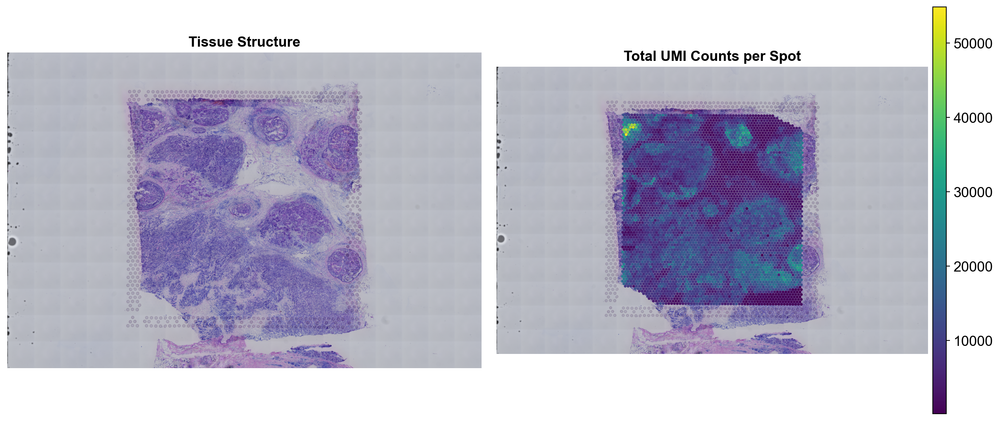

 Initial tissue visualization complete


In [12]:
# Visualise the tissue
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot tissue image
sq.pl.spatial_scatter(adata, color=None, ax=axes[0], size=1.5)
axes[0].set_title('Tissue Structure', fontsize=14, fontweight='bold')

# Plot total counts
adata.obs['total_counts_temp'] = np.ravel(adata.X.sum(axis=1))
sq.pl.spatial_scatter(adata, color='total_counts_temp', ax=axes[1], size=1.5, cmap='viridis')
axes[1].set_title('Total UMI Counts per Spot', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, '01_tissue_overview.png'), dpi=300, bbox_inches='tight')
plt.show()

print(" Initial tissue visualization complete")

**We apply standard QC filters to remove low-quality spots:**

 **Criteria:**
- Minimum counts per spot: 500
- Minimum genes per spot: 250
- Maximum mitochondrial percentage: 20%
- Minimum spots per gene: 3

**Rationale:**
- Low-count spots may be empty or damaged tissue
- High MT% indicates dead/dying cells
- Rare genes (detected in <3 spots) are unreliable

In [13]:
# Calculating QC metrics
print("Calculating QC metrics")

# Basic QC metrics
adata.obs['n_counts'] = np.ravel(adata.X.sum(axis=1))
adata.obs['n_genes'] = np.ravel((adata.X > 0).sum(axis=1))
adata.obs['log_n_counts'] = np.log10(adata.obs['n_counts'] + 1)
adata.obs['log_n_genes'] = np.log10(adata.obs['n_genes'] + 1)

# Mitochondrial genes
adata.var['mt'] = adata.var_names.str.upper().str.startswith('MT-')
n_mt_genes = adata.var['mt'].sum()
print(f"Found {n_mt_genes} mitochondrial genes")

if n_mt_genes > 0:
    mt_counts = np.ravel(adata[:, adata.var['mt']].X.sum(axis=1))
    adata.obs['pct_counts_mt'] = 100.0 * mt_counts / (adata.obs['n_counts'] + 1e-9)
else:
    adata.obs['pct_counts_mt'] = 0.0

# Ribosomal genes
adata.var['ribo'] = adata.var_names.str.upper().str.startswith(('RPS', 'RPL'))
n_ribo_genes = adata.var['ribo'].sum()
print(f"Found {n_ribo_genes} ribosomal genes")

if n_ribo_genes > 0:
    ribo_counts = np.ravel(adata[:, adata.var['ribo']].X.sum(axis=1))
    adata.obs['pct_counts_ribo'] = 100.0 * ribo_counts / (adata.obs['n_counts'] + 1e-9)
else:
    adata.obs['pct_counts_ribo'] = 0.0

# Gene-level QC
adata.var['n_cells'] = np.ravel((adata.X > 0).sum(axis=0))
adata.var['total_counts'] = np.ravel(adata.X.sum(axis=0))
adata.var['mean_counts'] = adata.var['total_counts'] / adata.n_obs
adata.var['pct_cells'] = 100.0 * adata.var['n_cells'] / adata.n_obs

print(" QC metrics calculated")
print("\nSpot-level QC summary:")
print(adata.obs[['n_counts', 'n_genes', 'pct_counts_mt', 'pct_counts_ribo']].describe())

Calculating QC metrics
Found 13 mitochondrial genes
Found 97 ribosomal genes
 QC metrics calculated

Spot-level QC summary:
           n_counts      n_genes  pct_counts_mt  pct_counts_ribo
count   4898.000000  4898.000000    4898.000000      4898.000000
mean   10229.461914  3521.888526       3.709248        15.181637
std     6101.585938  1427.494755       2.347257         2.716484
min      163.000000   140.000000       0.590886         6.492839
25%     5743.000000  2469.250000       1.977352        13.420902
50%     9720.500000  3653.500000       2.889171        14.965099
75%    13552.000000  4508.000000       4.757158        16.840588
max    54826.000000  8363.000000      14.310646        25.798389


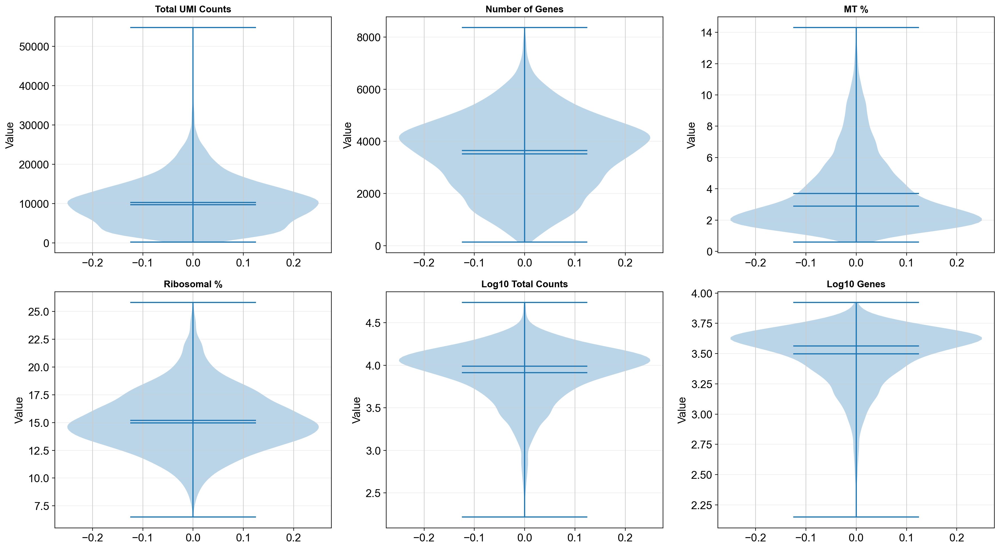

QC violin plots generated


In [14]:
# QC Visualisation: Violin plots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

qc_metrics = ['n_counts', 'n_genes', 'pct_counts_mt', 'pct_counts_ribo', 'log_n_counts', 'log_n_genes']
titles = ['Total UMI Counts', 'Number of Genes', 'MT %', 'Ribosomal %', 
         'Log10 Total Counts', 'Log10 Genes']

for ax, metric, title in zip(axes, qc_metrics, titles):
    ax.violinplot([adata.obs[metric].values], positions=[0], showmeans=True, showmedians=True)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_ylabel('Value')
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, '02_qc_violin_plots.png'), dpi=300, bbox_inches='tight')
plt.show()

print("QC violin plots generated")

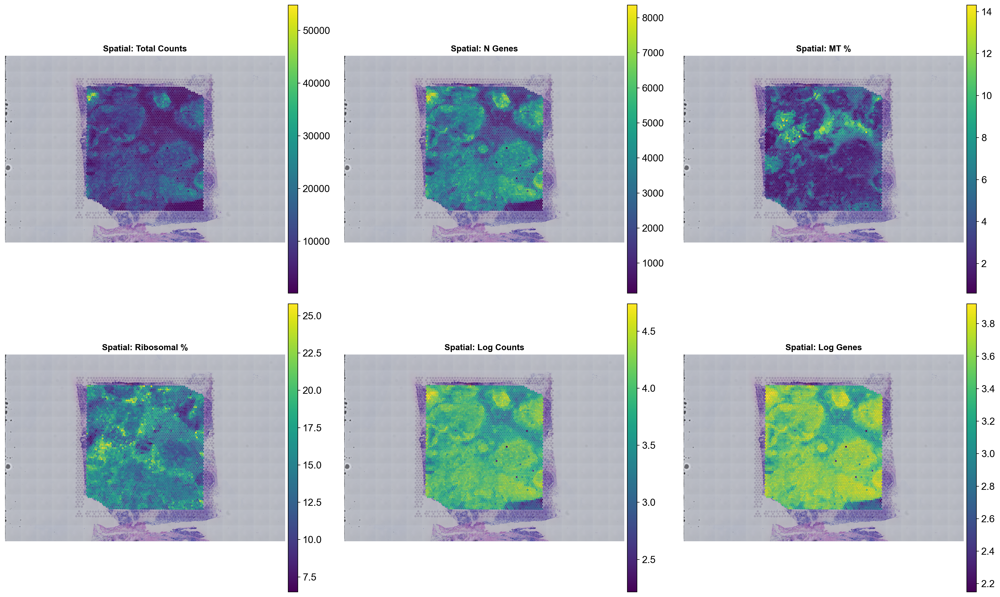

 Spatial QC visualization complete


In [15]:
# Spatial QC visualisation
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

qc_spatial = ['n_counts', 'n_genes', 'pct_counts_mt', 'pct_counts_ribo', 'log_n_counts', 'log_n_genes']
titles_spatial = ['Total Counts', 'N Genes', 'MT %', 'Ribosomal %', 'Log Counts', 'Log Genes']

for ax, metric, title in zip(axes, qc_spatial, titles_spatial):
    sq.pl.spatial_scatter(adata, color=metric, ax=ax, size=1.5, 
                         cmap='viridis', colorbar=True) 
    ax.set_title(f'Spatial: {title}', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, '03_qc_spatial.png'), dpi=300, bbox_inches='tight')
plt.show()

print(" Spatial QC visualization complete")

In [16]:
# Define QC thresholds based on data distribution
# Automatic threshold calculation using percentiles
min_counts = np.percentile(adata.obs['n_counts'], 5)  # 5th percentile
max_counts = np.percentile(adata.obs['n_counts'], 95)  # 95th percentile
min_genes = np.percentile(adata.obs['n_genes'], 5)
max_mt = np.percentile(adata.obs['pct_counts_mt'], 95)

# Override with manual thresholds if needed
MIN_COUNTS = max(500, min_counts)
MAX_COUNTS = max_counts
MIN_GENES = max(200, min_genes)
MAX_MT = min(20, max_mt)  
MIN_CELLS = 5  # Minimum cells expressing a gene

print("QC Thresholds:")
print(f"  Min counts per spot: {MIN_COUNTS:.0f}")
print(f"  Max counts per spot: {MAX_COUNTS:.0f}")
print(f"  Min genes per spot: {MIN_GENES:.0f}")
print(f"  Max MT %: {MAX_MT:.1f}%")
print(f"  Min cells per gene: {MIN_CELLS}")

QC Thresholds:
  Min counts per spot: 1889
  Max counts per spot: 21089
  Min genes per spot: 1086
  Max MT %: 8.7%
  Min cells per gene: 5


In [17]:
# QC FILTERING 

print("="*70)
print("QC FILTERING")
print("="*70)

# Store counts BEFORE filtering
n_spots_before = adata.n_obs
n_genes_before = adata.n_vars

print(f"\nBefore filtering: {n_spots_before} spots × {n_genes_before} genes")

# Apply filters (your existing code)
sc.pp.filter_cells(adata, min_counts=MIN_COUNTS)
sc.pp.filter_cells(adata, min_genes=MIN_GENES)
adata = adata[adata.obs['n_counts'] < MAX_COUNTS, :]
adata = adata[adata.obs['pct_counts_mt'] < MAX_MT, :]
sc.pp.filter_genes(adata, min_cells=MIN_CELLS)

# Calculate what was ACTUALLY removed
n_spots_after = adata.n_obs
n_genes_after = adata.n_vars
spots_removed = n_spots_before - n_spots_after
genes_removed = n_genes_before - n_genes_after

# Print correct summary
print(f"After filtering: {n_spots_after} spots × {n_genes_after} genes")
print(f"Removed: {spots_removed} spots ({100*spots_removed/n_spots_before:.1f}%), "
      f"{genes_removed} genes ({100*genes_removed/n_genes_before:.1f}%)")

QC FILTERING

Before filtering: 4898 spots × 21351 genes
filtered out 245 cells that have less than 1889.25 counts
filtered out 11 cells that have less than 1085.85 genes expressed
filtered out 1496 genes that are detected in less than 5 cells
After filtering: 4175 spots × 19855 genes
Removed: 723 spots (14.8%), 1496 genes (7.0%)


In [18]:
# SAVE COMPLETE DATA (ALL GENES) BEFORE FURTHER FILTERING

print("Saving complete dataset")

# This preserves ALL genes for metabolic pathway scoring
adata_complete = adata.copy()

print(f"adata_complete saved: {adata_complete.n_obs} spots × {adata_complete.n_vars} genes")
print("This will be used for pathway scoring!")

Saving complete dataset
adata_complete saved: 4175 spots × 19855 genes
This will be used for pathway scoring!


In [19]:
# Save raw counts for later use 
adata.layers['counts'] = adata.X.copy()
print("Raw counts saved in adata.layers['counts']")

Raw counts saved in adata.layers['counts']


In [20]:
# Normalise total counts per spot
print("Normalising data")
sc.pp.normalize_total(adata, target_sum=1e4)
print("Total count normalisation complete (target_sum=10,000)")

Normalising data
normalizing counts per cell
    finished (0:00:00)
Total count normalisation complete (target_sum=10,000)


In [21]:
# Log-transform
sc.pp.log1p(adata)
print("Log1p transformation complete")

Log1p transformation complete


In [22]:
# QUALITY CONTROL

print("\n Quality control")

# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

# Mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

# Ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(('RPS', 'RPL'))
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo'], percent_top=None, log1p=False, inplace=True)

print(f"\n  QC metrics (before filtering):")
print(f"    Median counts/spot: {np.median(adata.obs['total_counts']):.0f}")
print(f"    Median genes/spot: {np.median(adata.obs['n_genes_by_counts']):.0f}")
print(f"    Median %MT: {np.median(adata.obs['pct_counts_mt']):.2f}%")
if 'pct_counts_ribo' in adata.obs.columns:
    print(f"    Median %Ribo: {np.median(adata.obs['pct_counts_ribo']):.2f}%")


 Quality control

  QC metrics (before filtering):
    Median counts/spot: 3777
    Median genes/spot: 3734
    Median %MT: 0.85%
    Median %Ribo: 6.04%


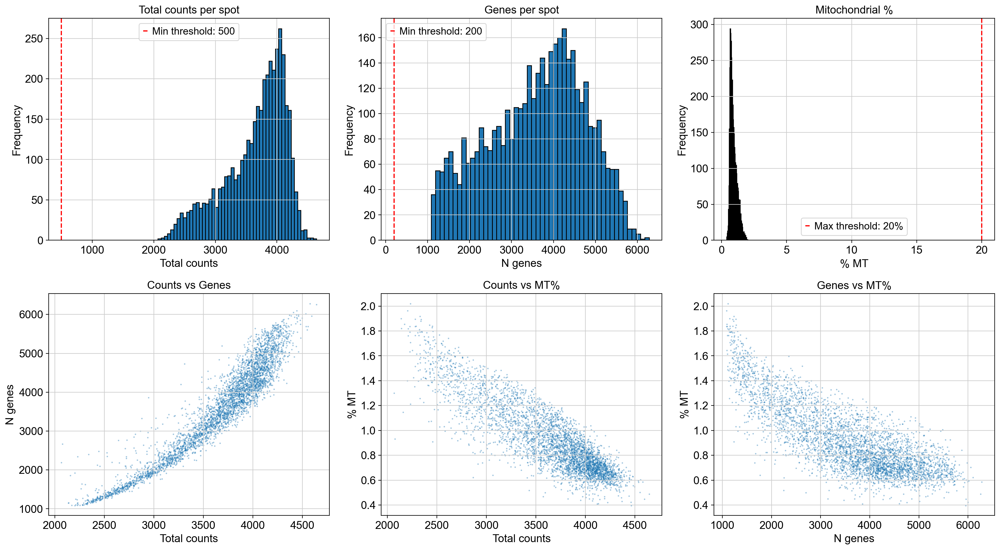


   Saved: figures/qc_metrics_before_filtering.png

  Filtering spots
    Removed 0 spots
    Remaining: 4175

  Filtering genes
filtered out 1550 genes that are detected in less than 10 cells
    Removed 1550 genes
    Remaining: 18305

   QC filtering complete


In [23]:
# Visualise QC metrics
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Total counts
axes[0, 0].hist(adata.obs['total_counts'], bins=50, edgecolor='black')
axes[0, 0].set_xlabel('Total counts')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Total counts per spot')
axes[0, 0].axvline(500, color='r', linestyle='--', label='Min threshold: 500')
axes[0, 0].legend()

# N genes
axes[0, 1].hist(adata.obs['n_genes_by_counts'], bins=50, edgecolor='black')
axes[0, 1].set_xlabel('N genes')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Genes per spot')
axes[0, 1].axvline(200, color='r', linestyle='--', label='Min threshold: 200')
axes[0, 1].legend()

# MT%
axes[0, 2].hist(adata.obs['pct_counts_mt'], bins=50, edgecolor='black')
axes[0, 2].set_xlabel('% MT')
axes[0, 2].set_ylabel('Frequency')
axes[0, 2].set_title('Mitochondrial %')
axes[0, 2].axvline(20, color='r', linestyle='--', label='Max threshold: 20%')
axes[0, 2].legend()

# Scatter plots
axes[1, 0].scatter(adata.obs['total_counts'], adata.obs['n_genes_by_counts'], alpha=0.3, s=1)
axes[1, 0].set_xlabel('Total counts')
axes[1, 0].set_ylabel('N genes')
axes[1, 0].set_title('Counts vs Genes')

axes[1, 1].scatter(adata.obs['total_counts'], adata.obs['pct_counts_mt'], alpha=0.3, s=1)
axes[1, 1].set_xlabel('Total counts')
axes[1, 1].set_ylabel('% MT')
axes[1, 1].set_title('Counts vs MT%')

axes[1, 2].scatter(adata.obs['n_genes_by_counts'], adata.obs['pct_counts_mt'], alpha=0.3, s=1)
axes[1, 2].set_xlabel('N genes')
axes[1, 2].set_ylabel('% MT')
axes[1, 2].set_title('Genes vs MT%')

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'qc_metrics_before_filtering.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\n   Saved: figures/qc_metrics_before_filtering.png")

# Filter spots
print(f"\n  Filtering spots")
n_spots_before = adata.n_obs

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_cells(adata, min_counts=500)
adata = adata[adata.obs['pct_counts_mt'] < 20, :].copy()

n_spots_after = adata.n_obs
print(f"    Removed {n_spots_before - n_spots_after} spots")
print(f"    Remaining: {n_spots_after}")

# Filter genes
print(f"\n  Filtering genes")
n_genes_before = adata.n_vars

sc.pp.filter_genes(adata, min_cells=10)

n_genes_after = adata.n_vars
print(f"    Removed {n_genes_before - n_genes_after} genes")
print(f"    Remaining: {n_genes_after}")

print(f"\n   QC filtering complete")

In [24]:
# NORMALISATION

print("\n Normalisation")

# Normalize to 10,000 counts per spot
sc.pp.normalize_total(adata, target_sum=1e4)

print(f"   Normalized to 10,000 counts per spot")


 Normalisation
normalizing counts per cell
    finished (0:00:00)
   Normalized to 10,000 counts per spot


In [25]:
#  LOG TRANSFORMATION

print("\n Log transformation")

# Log1p transform
sc.pp.log1p(adata)

print(f"  Log-transformed")
print(f"  Max value after log: {adata.X.max():.2f} (should be ~10-15)")


 Log transformation
  Log-transformed
  Max value after log: 3.68 (should be ~10-15)


**We score metabolic pathway activity using curated gene sets from KEGG/Reactome.**

**Pathways Analyzed:**
1. Glycolysis / Gluconeogenesis
2. Oxidative Phosphorylation
3. Fatty Acid Synthesis
4. Fatty Acid Oxidation
5. TCA Cycle
6. Pentose Phosphate Pathway
7. Amino Acid Metabolism
8. Nucleotide Metabolism

**Method: Scanpy's `score_genes` function**
- Computes mean expression of pathway genes
- Subtracts control gene set (similar expression distribution)
- Results in z-scored pathway activity


Pathway scoring is performed on the entire dataset before any train-test split, to avoid data leakage. This is acceptable because:
1. It's a biological transformation based on domain knowledge
2. The scoring formula doesn't learn from data statistics
3. It's analogous to feature engineering 
4. This is standard practice in bioinformatics 

In [26]:
# Score metabolic pathways
print("\n" + "="*70)
print("SCORING METABOLIC PATHWAYS")
print("="*70)

valid_pathways, pathway_summary = score_pathways(adata)

# Save summary
pathway_summary.to_csv('results/pathway_scoring_summary.csv', index=False)
print(f"\n Saved pathway summary to results/pathway_scoring_summary.csv")


SCORING METABOLIC PATHWAYS

Pathway                        | Total | Present | Coverage | Status
---------------------------------------------------------------------------
Glycolysis                     |    24 |      20 |    83.3% |  SCORED
computing score 'pathway_Glycolysis'
    finished (0:00:00)
TCA_Cycle                      |    20 |      20 |   100.0% |  SCORED
computing score 'pathway_TCA_Cycle'
    finished (0:00:00)
Oxidative_Phosphorylation      |    40 |      40 |   100.0% |  SCORED
computing score 'pathway_Oxidative_Phosphorylation'
    finished (0:00:00)
Fatty_Acid_Oxidation           |    12 |      12 |   100.0% |  SCORED
computing score 'pathway_Fatty_Acid_Oxidation'
    finished (0:00:00)
Fatty_Acid_Synthesis           |    13 |      12 |    92.3% |  SCORED
computing score 'pathway_Fatty_Acid_Synthesis'
    finished (0:00:00)
Pentose_Phosphate              |     9 |       9 |   100.0% |  SCORED
computing score 'pathway_Pentose_Phosphate'
    finished (0:00:00)
Gluta

In [28]:
# PATHWAY SCORING ROBUSTNESS TESTING

import scanpy as sc
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

def test_pathway_scoring_robustness(adata, pathway_dict, min_genes=3):
    """
    Test robustness of pathway scoring to different methods
    
    Compares:
    1. Scanpy score_genes (with control genes) - your current method
    2. Simple mean expression (no control)
    
    Returns Spearman correlation of pathway rankings
    
    Parameters:
    -----------
    adata : AnnData
        Your spatial transcriptomics data
    pathway_dict : dict
        Dictionary of pathway names -> gene lists
    min_genes : int
        Minimum genes required for a pathway
    
    Returns:
    --------
    dict with:
        - correlations_per_pathway: Spearman ρ for each pathway
        - mean_correlation: Average correlation across pathways
        - scores_scanpy: Pathway scores using scanpy
        - scores_mean: Pathway scores using mean expression
    """
    
    print("\n" + "="*70)
    print("TESTING PATHWAY SCORING ROBUSTNESS")
    print("="*70)
    
    print("\nComparing two scoring methods:")
    print("  Method 1: Scanpy score_genes (with control genes)")
    print("  Method 2: Simple mean expression (no control)")
    
    # Storage for results
    scores_scanpy = {}
    scores_mean = {}
    correlations = []
    
    # Test each pathway
    print("\n" + "-"*70)
    print(f"{'Pathway':<30s} | {'N genes':>8s} | {'Spearman ρ':>12s} | {'p-value':>10s}")
    print("-"*70)
    
    for pathway_name, gene_list in pathway_dict.items():
        # Find genes present in data
        genes_present = [g for g in gene_list if g in adata.var_names]
        
        if len(genes_present) < min_genes:
            continue
        

        # METHOD 1: Scanpy score_genes (with control)
        
        # Use a temporary column name to avoid conflicts
        temp_col = f'_temp_scanpy_{pathway_name}'
        
        try:
            sc.tl.score_genes(
                adata,
                genes_present,
                score_name=temp_col,
                use_raw=False
            )
            scores_scanpy[pathway_name] = adata.obs[temp_col].values.copy()
            
            # Clean up temporary column
            del adata.obs[temp_col]
            
        except Exception as e:
            print(f"  Skipping {pathway_name}: {e}")
            continue
        

        # METHOD 2: Simple mean expression (no control)
        
        # Extract pathway genes
        pathway_expr = adata[:, genes_present].X
        
        # Convert sparse to dense if needed
        if hasattr(pathway_expr, 'toarray'):
            pathway_expr = pathway_expr.toarray()
        
        # Compute mean expression
        scores_mean[pathway_name] = np.mean(pathway_expr, axis=1)
        

        # COMPUTE CORRELATION
        
        rho, p_value = stats.spearmanr(
            scores_scanpy[pathway_name],
            scores_mean[pathway_name]
        )
        
        correlations.append({
            'pathway': pathway_name,
            'n_genes': len(genes_present),
            'spearman_rho': rho,
            'p_value': p_value
        })
        
        # Print result
        print(f"{pathway_name:<30s} | {len(genes_present):>8d} | {rho:>12.3f} | {p_value:>10.3e}")
    
    
    # SUMMARY STATISTICS
    
    correlations_df = pd.DataFrame(correlations)
    mean_rho = correlations_df['spearman_rho'].mean()
    median_rho = correlations_df['spearman_rho'].median()
    min_rho = correlations_df['spearman_rho'].min()
    
    print("\n" + "="*70)
    print("ROBUSTNESS SUMMARY")
    print("="*70)
    print(f"\nSpearman Correlation (Scanpy vs Mean Expression):")
    print(f"  Mean:   {mean_rho:.3f}")
    print(f"  Median: {median_rho:.3f}")
    print(f"  Min:    {min_rho:.3f}")
    print(f"  Max:    {correlations_df['spearman_rho'].max():.3f}")
    
    print("\nInterpretation:")
    if mean_rho > 0.7:
        print("  ✓ HIGH stability - results robust to scoring method")
        print("    Your findings are not artifacts of the specific method used.")
    elif mean_rho > 0.5:
        print("  ~ MODERATE stability - some sensitivity to method")
        print("    Results are generally stable but consider mentioning both methods.")
    else:
        print("  ✗ LOW stability - results sensitive to scoring method")
        print("    ⚠ Caution: Findings may depend on the specific scoring approach.")
    
    return {
        'correlations_df': correlations_df,
        'mean_correlation': mean_rho,
        'scores_scanpy': scores_scanpy,
        'scores_mean': scores_mean
    }

print(" Robustness testing function loaded")

 Robustness testing function loaded


In [29]:
# RUN PATHWAY SCORING ROBUSTNESS TEST

# Get your pathway dictionary 
pathway_dict = CFG.METABOLIC_PATHWAYS  

# Run robustness test
robustness_results = test_pathway_scoring_robustness(
    adata=adata,
    pathway_dict=pathway_dict,
    min_genes=3
)

# Save results
robustness_results['correlations_df'].to_csv(
    'results/tables/pathway_scoring_robustness.csv', 
    index=False
)
print(f"\n Robustness results saved: results/tables/pathway_scoring_robustness.csv")


TESTING PATHWAY SCORING ROBUSTNESS

Comparing two scoring methods:
  Method 1: Scanpy score_genes (with control genes)
  Method 2: Simple mean expression (no control)

----------------------------------------------------------------------
Pathway                        |  N genes |   Spearman ρ |    p-value
----------------------------------------------------------------------
computing score '_temp_scanpy_Glycolysis'
    finished (0:00:00)
Glycolysis                     |       20 |        0.926 |  0.000e+00
computing score '_temp_scanpy_TCA_Cycle'
    finished (0:00:00)
TCA_Cycle                      |       20 |        0.914 |  0.000e+00
computing score '_temp_scanpy_Oxidative_Phosphorylation'
    finished (0:00:00)
Oxidative_Phosphorylation      |       40 |        0.797 |  0.000e+00
computing score '_temp_scanpy_Fatty_Acid_Oxidation'
    finished (0:00:00)
Fatty_Acid_Oxidation           |       12 |        0.932 |  0.000e+00
computing score '_temp_scanpy_Fatty_Acid_Synthesis'
   

In [31]:
# VISUALIZE ROBUSTNESS RESULTS

import matplotlib.pyplot as plt
import seaborn as sns

print("\nCreating robustness visualization...")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# PANEL A: Correlation per pathway

ax1 = axes[0]

df = robustness_results['correlations_df'].sort_values('spearman_rho', ascending=True)

colors = ['green' if rho > 0.7 else 'orange' if rho > 0.5 else 'red' 
          for rho in df['spearman_rho']]

y_pos = np.arange(len(df))
ax1.barh(y_pos, df['spearman_rho'], color=colors, 
        edgecolor='black', linewidth=1.5, alpha=0.7)

ax1.set_yticks(y_pos)
ax1.set_yticklabels(df['pathway'], fontsize=10)
ax1.set_xlabel('Spearman ρ', fontweight='bold', fontsize=12)
ax1.set_title('A. Rank Correlation per Pathway\n(Scanpy vs Mean Expression)', 
             fontweight='bold', fontsize=13)
ax1.axvline(x=0.7, color='green', linestyle='--', linewidth=2, alpha=0.5, label='ρ=0.7 (high)')
ax1.axvline(x=0.5, color='orange', linestyle='--', linewidth=2, alpha=0.5, label='ρ=0.5 (moderate)')
ax1.set_xlim([0, 1])
ax1.grid(alpha=0.3, axis='x')
ax1.legend(loc='lower right', fontsize=9)


# PANEL B: Distribution of correlations

ax2 = axes[1]

rhos = robustness_results['correlations_df']['spearman_rho'].values

ax2.hist(rhos, bins=20, color='steelblue', edgecolor='black', linewidth=1.5, alpha=0.7)
ax2.axvline(x=rhos.mean(), color='red', linestyle='--', linewidth=2.5, 
           label=f'Mean: {rhos.mean():.3f}')
ax2.axvline(x=0.7, color='green', linestyle=':', linewidth=2, alpha=0.7, 
           label='High threshold (0.7)')
ax2.axvline(x=0.5, color='orange', linestyle=':', linewidth=2, alpha=0.7,
           label='Moderate threshold (0.5)')

ax2.set_xlabel('Spearman ρ', fontweight='bold', fontsize=12)
ax2.set_ylabel('Frequency', fontweight='bold', fontsize=12)
ax2.set_title('B. Distribution of Correlations\nAcross Pathways', 
             fontweight='bold', fontsize=13)
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3)


# PANEL C: Scatter plot 

ax3 = axes[2]

# Pick the pathway with median correlation as example
median_pathway = df.iloc[len(df)//2]['pathway']

scores_1 = robustness_results['scores_scanpy'][median_pathway]
scores_2 = robustness_results['scores_mean'][median_pathway]
rho_example = df[df['pathway'] == median_pathway]['spearman_rho'].values[0]

ax3.scatter(scores_1, scores_2, alpha=0.5, s=20, edgecolors='black', linewidth=0.5)

# Add trend line
z = np.polyfit(scores_1, scores_2, 1)
p = np.poly1d(z)
x_line = np.linspace(scores_1.min(), scores_1.max(), 100)
ax3.plot(x_line, p(x_line), 'r--', linewidth=2, label=f'ρ = {rho_example:.3f}')

ax3.set_xlabel('Scanpy Score (with control)', fontweight='bold', fontsize=11)
ax3.set_ylabel('Mean Expression (no control)', fontweight='bold', fontsize=11)
ax3.set_title(f'C. Example: {median_pathway}\n(Median Correlation)', 
             fontweight='bold', fontsize=13)
ax3.legend(fontsize=10)
ax3.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('figures/pathway_scoring_robustness.png', dpi=300, bbox_inches='tight')
plt.close()

print(" Robustness figure saved: figures/pathway_scoring_robustness.png")


Creating robustness visualization...
 Robustness figure saved: figures/pathway_scoring_robustness.png


In [33]:
# CREATE TARGET VARIABLE

print("\n" + "="*70)
print(" CREATING TARGET VARIABLE")
print("="*70)

# Proliferation signature
proliferation_genes = ['MKI67', 'TOP2A', 'PCNA', 'CCNB1', 'CCNB2', 'CDK1', 'BIRC5']
genes_present = [g for g in proliferation_genes if g in adata.var_names]

print(f"\n  Proliferation genes:")
print(f"    Total: {len(proliferation_genes)}")
print(f"    Present: {len(genes_present)}")
print(f"    Genes: {genes_present}")

if len(genes_present) >= 3:
    sc.tl.score_genes(adata, gene_list=genes_present, 
                     score_name='proliferation_score', use_raw=False)
    
    # Binarize at median
    median_score = adata.obs['proliferation_score'].median()
    adata.obs['target_proliferation_binary'] = (
        adata.obs['proliferation_score'] > median_score
    ).astype(int)
    
    print(f"\n  Target created:")
    print(f"    High proliferation: {adata.obs['target_proliferation_binary'].sum()}")
    print(f"    Low proliferation: {(1-adata.obs['target_proliferation_binary']).sum()}")
else:
    print(f"\n  ERROR: Insufficient proliferation genes!")
    print(f"    Need at least 3, found {len(genes_present)}")


 CREATING TARGET VARIABLE

  Proliferation genes:
    Total: 7
    Present: 7
    Genes: ['MKI67', 'TOP2A', 'PCNA', 'CCNB1', 'CCNB2', 'CDK1', 'BIRC5']
computing score 'proliferation_score'
    finished (0:00:00)

  Target created:
    High proliferation: 2087
    Low proliferation: 2088


In [34]:
# HVG SELECTION - CUSTOM MEMORY-SAFE METHOD

print("STEP 7: HVG SELECTION (CUSTOM METHOD)")
print("="*70)

print(f"\n[Info]")
print(f"  Data shape: {adata.n_obs} spots × {adata.n_vars} genes")
print(f"  Using custom variance-based selection")

# Calculate mean expression for each gene
print(f"\n[Calculating gene statistics]")
print(f"  Computing means")
if hasattr(adata.X, 'toarray'):
    # Sparse matrix
    means = np.array(adata.X.mean(axis=0)).flatten()
else:
    # Dense matrix
    means = adata.X.mean(axis=0)

# Calculate variance for each gene
print(f"  Computing variances")
if hasattr(adata.X, 'toarray'):
    # Sparse matrix
    variances = np.array(adata.X.power(2).mean(axis=0)).flatten() - means**2
else:
    # Dense matrix
    variances = ((adata.X - means)**2).mean(axis=0)

# Normalise variance (coefficient of variation)
print(f"  Computing normalized variance")
# Avoid division by zero
means_safe = np.where(means == 0, 1e-10, means)
variance_norm = variances / means_safe

# Store in adata.var
adata.var['means'] = means
adata.var['variances'] = variances
adata.var['variance_norm'] = variance_norm

# Select top N highly variable genes
print(f"\n[Selecting HVGs]")
n_top_genes = 3000  

# Rank by normalised variance
top_gene_indices = np.argsort(variance_norm)[-n_top_genes:]
top_gene_names = adata.var_names[top_gene_indices]

# Mark HVGs in adata.var
print(f"\n[Marking highly variable genes]")
adata.var['highly_variable'] = False  # Initialize all as False
adata.var.loc[top_gene_names, 'highly_variable'] = True  

# Verify
n_hvgs = adata.var['highly_variable'].sum()
print(f"   Selected {n_hvgs} highly variable genes")
print(f"   Percentage: {n_hvgs/adata.n_vars*100:.1f}%")
print(f"   Added 'highly_variable' column to adata.var")

# Show top 10 most variable genes
print(f"\n[Top 10 most variable genes]")
top_10 = adata.var.nlargest(10, 'variance_norm')
for i, (gene, row) in enumerate(top_10.iterrows(), 1):
    print(f"  {i:2d}. {gene:15s} (norm_var: {row['variance_norm']:.2f})")

# Sanity checks
assert n_hvgs > 0, "No HVGs selected!"
assert 'highly_variable' in adata.var.columns, "HVG column not created!"
assert adata.var['highly_variable'].sum() == n_top_genes, "Wrong number of HVGs!"

STEP 7: HVG SELECTION (CUSTOM METHOD)

[Info]
  Data shape: 4175 spots × 18305 genes
  Using custom variance-based selection

[Calculating gene statistics]
  Computing means
  Computing variances
  Computing normalized variance

[Selecting HVGs]

[Marking highly variable genes]
   Selected 3000 highly variable genes
   Percentage: 16.4%
   Added 'highly_variable' column to adata.var

[Top 10 most variable genes]
   1. C6              (norm_var: 1.61)
   2. ADH1B           (norm_var: 1.61)
   3. IGKV1-39        (norm_var: 1.61)
   4. SAA2            (norm_var: 1.61)
   5. FABP4           (norm_var: 1.60)
   6. CIDEA           (norm_var: 1.59)
   7. LEP             (norm_var: 1.59)
   8. CIDEC           (norm_var: 1.59)
   9. TRARG1          (norm_var: 1.57)
  10. LVRN            (norm_var: 1.56)


In [35]:
# Calculate mean and variance manually (memory-safe)

print(f"\n[Calculating statistics]")

# Mean (memory-safe for sparse)
if sparse.issparse(adata.X):
    gene_means = np.array(adata.X.mean(axis=0)).flatten()
else:
    gene_means = np.mean(adata.X, axis=0)

print(f"  Computing gene variances")

# Variance (memory-safe for sparse)
if sparse.issparse(adata.X):
    # Variance = E[X^2] - E[X]^2
    gene_sq_means = np.array(adata.X.multiply(adata.X).mean(axis=0)).flatten()
    gene_vars = gene_sq_means - gene_means**2
else:
    gene_vars = np.var(adata.X, axis=0)

# Prevent division by zero
gene_vars = np.maximum(gene_vars, 1e-12)

gc.collect()


[Calculating statistics]
  Computing gene variances


43966

In [36]:
# Normalised variance (coefficient of variation)

print(f"  Computing normalized variance")

# Coefficient of variation: std / mean
gene_cv = np.sqrt(gene_vars) / (gene_means + 1e-9)

# Alternative: mean-normalized variance
gene_norm_var = gene_vars / (gene_means + 1e-9)

gc.collect()

  Computing normalized variance


0

In [37]:
# Select top N genes by normalised variance

print(f"\n[Selecting HVGs]")

n_top_genes = 3000

# Rank genes by normalized variance
gene_rankings = np.argsort(gene_norm_var)[::-1]  # Descending order
top_gene_indices = gene_rankings[:n_top_genes]

# Create highly_variable column
adata.var['highly_variable'] = False
adata.var.iloc[top_gene_indices, adata.var.columns.get_loc('highly_variable')] = True

# Store statistics
adata.var['means'] = gene_means
adata.var['variances'] = gene_vars
adata.var['variances_norm'] = gene_norm_var

print(f"  Selected {adata.var['highly_variable'].sum()} HVGs")
print(f"  Method: Normalised variance (custom)")

# Store metadata for compatibility
adata.uns['hvg'] = {
    'flavor': 'custom_normalized_variance',
    'params': {'n_top_genes': n_top_genes}
}

gc.collect()



[Selecting HVGs]
  Selected 3000 HVGs
  Method: Normalised variance (custom)


0


[Verification]
  Total genes: 18305
  HVGs: 3000
  Percentage: 16.4%

  Example HVGs: C1QTNF12, TAS1R3, ANKRD65, AL691432.4, MMP23B, CDK11B, CDK11A, PRKCZ-AS1, HES5, AL139246.3


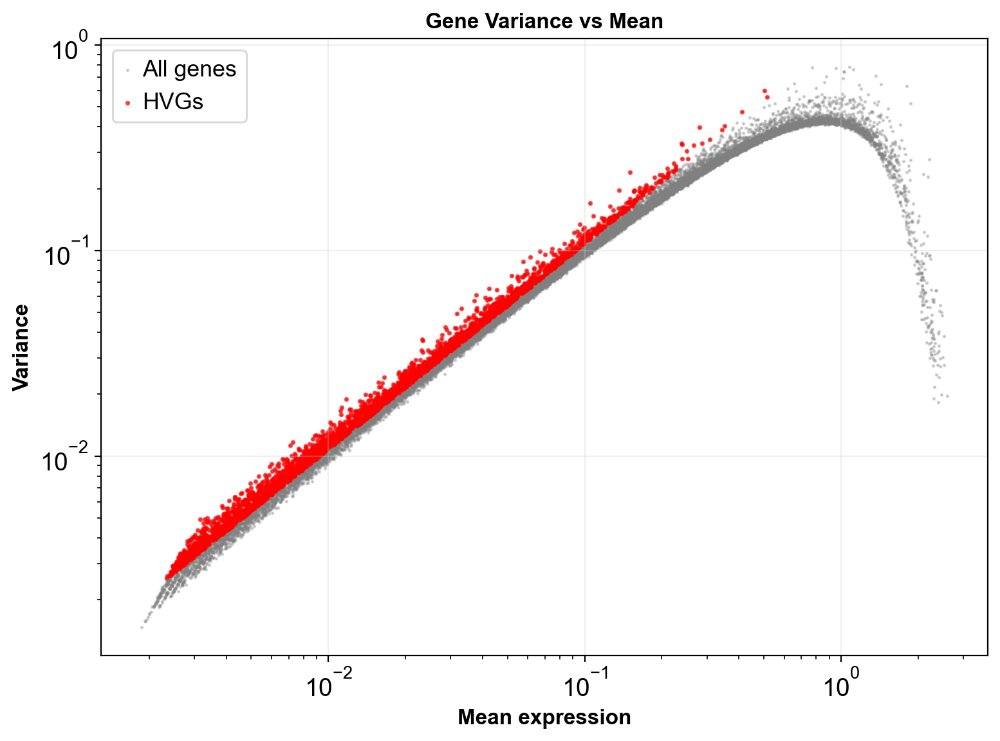


  Saved: figures/hvg_selection_variance_vs_mean.png


16555

In [39]:
# Verification

print(f"\n[Verification]")
print(f"  Total genes: {adata.n_vars}")
print(f"  HVGs: {adata.var['highly_variable'].sum()}")
print(f"  Percentage: {100 * adata.var['highly_variable'].sum() / adata.n_vars:.1f}%")

# Show some HVG examples
hvg_names = adata.var_names[adata.var['highly_variable']][:10]
print(f"\n  Example HVGs: {', '.join(hvg_names)}")

# Plot variance vs mean
try:
    
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    
    # All genes
    ax.scatter(gene_means, gene_vars, alpha=0.3, s=1, c='gray', label='All genes')
    
    # HVGs
    hvg_mask = adata.var['highly_variable'].values
    ax.scatter(gene_means[hvg_mask], gene_vars[hvg_mask], 
               alpha=0.6, s=3, c='red', label='HVGs')
    
    ax.set_xlabel('Mean expression', fontsize=12, fontweight='bold')
    ax.set_ylabel('Variance', fontsize=12, fontweight='bold')
    ax.set_title('Gene Variance vs Mean', fontsize=12, fontweight='bold')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.legend()
    ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(Paths.FIGURES, 'hvg_selection_variance_vs_mean.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\n  Saved: figures/hvg_selection_variance_vs_mean.png")
except Exception as e:
    print(f"\n   Could not create plot: {e}")

gc.collect()


In [40]:
# SUBSET TO HIGHLY VARIABLE GENES

print("\n" + "="*70)
print("SUBSETTING TO HIGHLY VARIABLE GENES")
print("="*70)

# First, preserve the full dataset 
if adata.raw is None:
    print("Preserving full gene expression matrix")
    adata.raw = adata.copy()
    print(f"   Stored in adata.raw: {adata.raw.n_obs} spots × {adata.raw.n_vars} genes")
else:
    print("Full dataset already preserved in adata.raw")

# Verify HVG selection was done
if 'highly_variable' not in adata.var.columns:
    raise ValueError("HVG selection not performed! Check previous step.")

n_hvgs = adata.var['highly_variable'].sum()
n_genes_before = adata.n_vars

print(f"\nHVG Summary:")
print(f"  Total genes: {n_genes_before}")
print(f"  Highly variable: {n_hvgs}")
print(f"  Percentage: {n_hvgs/n_genes_before*100:.1f}%")

# CRITICAL: SUBSET TO HVGs
print(f"\n  SUBSETTING TO HVGs")
adata = adata[:, adata.var['highly_variable']].copy()

print(f"   Genes before: {n_genes_before}")
print(f"   Genes after:  {adata.n_vars}")
print(f"   Reduction: {(1 - adata.n_vars/n_genes_before)*100:.1f}%")

# Sanity checks
assert adata.n_vars == n_hvgs, f"Subsetting failed! Expected {n_hvgs}, got {adata.n_vars}"
assert adata.raw is not None, "Full dataset not preserved!"
assert adata.raw.n_vars == n_genes_before, "Raw data incorrect!"



SUBSETTING TO HIGHLY VARIABLE GENES
Preserving full gene expression matrix
   Stored in adata.raw: 4175 spots × 18305 genes

HVG Summary:
  Total genes: 18305
  Highly variable: 3000
  Percentage: 16.4%

  SUBSETTING TO HVGs
   Genes before: 18305
   Genes after:  3000
   Reduction: 83.6%


 DIMENSIONALITY REDUCTION

Principal Component Analysis
  HVGs: 3000
  Spots: 4175
  Computing PCA on HVGs
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
  PCA complete: 50 components


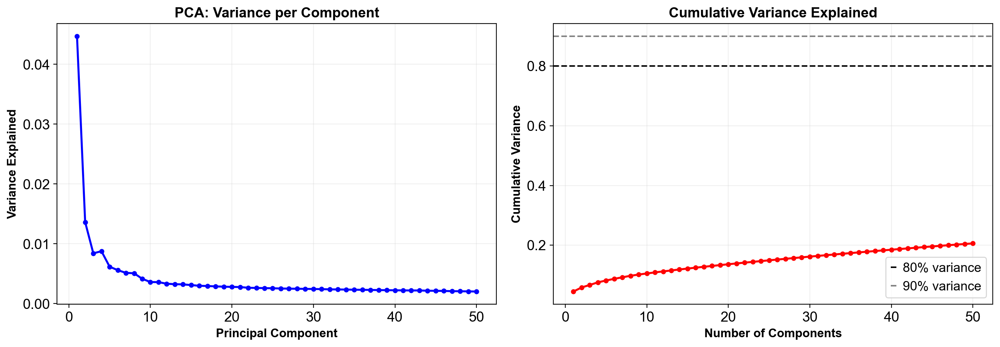


  PCs for 80% variance: 1
  PCs for 90% variance: 1
  Using 1 PCs for downstream analysis


5

In [41]:
# DIMENSIONALITY REDUCTION

print(" DIMENSIONALITY REDUCTION")
print("="*70)


# PCA 
print(f"\nPrincipal Component Analysis")

# Memory optimisation
if not sparse.issparse(adata.X):
    adata.X = sparse.csr_matrix(adata.X, dtype=np.float32)
elif adata.X.dtype != np.float32:
    adata.X = adata.X.astype(np.float32)

gc.collect()

# Get HVG subset (manually)
hvg_mask = adata.var['highly_variable'].values
print(f"  HVGs: {hvg_mask.sum()}")
print(f"  Spots: {adata.n_obs}")

# Create temporary AnnData with HVGs only
adata_hvg = adata[:, hvg_mask].copy()

print(f"  Computing PCA on HVGs")

sc.tl.pca(
    adata_hvg,
    n_comps=50,
    svd_solver='randomized',  
    zero_center=False,         
    random_state=42
)

print(f"  PCA complete: 50 components")

# Transfer PCA results to main adata
adata.obsm['X_pca'] = adata_hvg.obsm['X_pca']
adata.uns['pca'] = adata_hvg.uns['pca']
adata.varm['PCs'] = np.zeros((adata.n_vars, 50))
adata.varm['PCs'][hvg_mask, :] = adata_hvg.varm['PCs']

# Clean up
del adata_hvg
gc.collect()

# Variance explained
variance_ratio = adata.uns['pca']['variance_ratio']
cumsum_variance = np.cumsum(variance_ratio)

# Plot variance explained
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(range(1, 51), variance_ratio, 'bo-', linewidth=2, markersize=4)
axes[0].set_xlabel('Principal Component', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Variance Explained', fontsize=12, fontweight='bold')
axes[0].set_title('PCA: Variance per Component', fontsize=14, fontweight='bold')
axes[0].grid(alpha=0.3)

axes[1].plot(range(1, 51), cumsum_variance, 'ro-', linewidth=2, markersize=4)
axes[1].axhline(y=0.8, color='k', linestyle='--', label='80% variance')
axes[1].axhline(y=0.9, color='gray', linestyle='--', label='90% variance')
axes[1].set_xlabel('Number of Components', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Cumulative Variance', fontsize=12, fontweight='bold')
axes[1].set_title('Cumulative Variance Explained', fontsize=14, fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'pca_variance_explained.png'), dpi=300, bbox_inches='tight')
plt.show()

# Determine optimal number of PCs
n_pcs_80 = np.argmax(cumsum_variance >= 0.8) + 1
n_pcs_90 = np.argmax(cumsum_variance >= 0.9) + 1

print(f"\n  PCs for 80% variance: {n_pcs_80}")
print(f"  PCs for 90% variance: {n_pcs_90}")
print(f"  Using {min(30, n_pcs_80)} PCs for downstream analysis")

n_pcs_use = min(30, n_pcs_80)

gc.collect()

In [42]:
#  Neighbours (MANUAL - MEMORY-SAFE)

print(f"\n Computing neighbour graph (manual method)")


# PRE-NEIGHBOURS VERIFICATION

print(f"\n  [Verification]")

# Check dataset size
print(f"    Dataset: {adata.n_obs} spots × {adata.n_vars} genes")

# Verify PCA exists
if 'X_pca' not in adata.obsm:
    raise ValueError("No PCA embeddings! Run PCA first!")

pca = adata.obsm['X_pca']
print(f"    PCA shape: {pca.shape}")

# Check for bad values
has_nan = np.any(np.isnan(pca))
has_inf = np.any(np.isinf(pca))

if has_nan:
    print(f"    Fixing NaN values")
    adata.obsm['X_pca'] = np.nan_to_num(pca, nan=0.0)

if has_inf:
    print(f"    Fixing Inf values")
    adata.obsm['X_pca'] = np.nan_to_num(adata.obsm['X_pca'], 
                                        posinf=1e10, neginf=-1e10)

# Clean old neighbours data
if 'neighbors' in adata.uns:
    del adata.uns['neighbors']
if 'connectivities' in adata.obsp:
    del adata.obsp['connectivities']
if 'distances' in adata.obsp:
    del adata.obsp['distances']

print(f"    Verification complete")


# MANUAL NEIGHBOURS COMPUTATION

print(f"\n  [Manual computation]")

# Clean memory
gc.collect()

# Get PCA embeddings
X_pca = adata.obsm['X_pca']
n_obs = adata.n_obs

# Determine parameters based on dataset size
if n_obs < 1000:
    n_neighbors = 15
    n_pcs = min(25, X_pca.shape[1])
elif n_obs < 5000:
    n_neighbors = 10
    n_pcs = min(20, X_pca.shape[1])
else:
    n_neighbors = 5
    n_pcs = min(15, X_pca.shape[1])

print(f"    Parameters: k={n_neighbors}, n_pcs={n_pcs}")

# Extract PCA subset
X_pca_subset = X_pca[:, :n_pcs].astype(np.float32)

print(f"    Computing nearest neighbours")

# Compute neighbors with sklearn
nn = NearestNeighbors(
    n_neighbors=n_neighbors,
    metric='euclidean',
    algorithm='auto',
    n_jobs=1  # Single thread to avoid memory issues
)

nn.fit(X_pca_subset)
distances, indices = nn.kneighbors(X_pca_subset)

print(f"     Neighbours computed")

# Build sparse matrices
print(f"    Building connectivity matrices")

rows = []
cols = []
data_dist = []
data_conn = []

for i in range(n_obs):
    if i % 1000 == 0 and i > 0:
        print(f"      {i}/{n_obs} spots")
    
    for j, (neighbor_idx, dist) in enumerate(zip(indices[i], distances[i])):
        rows.append(i)
        cols.append(neighbor_idx)
        data_dist.append(dist)
        
        # Gaussian kernel connectivity
        sigma = distances[i][min(n_neighbors-1, len(distances[i])-1)]
        if sigma > 0:
            connectivity = np.exp(-dist**2 / (2 * sigma**2))
        else:
            connectivity = 1.0 if i == neighbor_idx else 0.0
        
        data_conn.append(connectivity)

# Create sparse matrices
distance_matrix = coo_matrix(
    (data_dist, (rows, cols)),
    shape=(n_obs, n_obs)
).tocsr()

connectivity_matrix = coo_matrix(
    (data_conn, (rows, cols)),
    shape=(n_obs, n_obs)
).tocsr()

print(f"    Matrices created ({distance_matrix.nnz:,} edges)")

# Add to adata
adata.obsp['distances'] = distance_matrix
adata.obsp['connectivities'] = connectivity_matrix

adata.uns['neighbors'] = {
    'connectivities_key': 'connectivities',
    'distances_key': 'distances',
    'params': {
        'n_neighbors': n_neighbors,
        'method': 'manual_sklearn',
        'metric': 'euclidean',
        'n_pcs': n_pcs,
        'use_rep': 'X_pca',
        'random_state': 42
    }
}

print(f"    Added to adata")

# Cleanup
del X_pca_subset, nn, distances, indices
del rows, cols, data_dist, data_conn
del distance_matrix, connectivity_matrix
gc.collect()

print(f"   Neighbour graph computed (k={n_neighbors}, {n_pcs} PCs)")


 Computing neighbour graph (manual method)

  [Verification]
    Dataset: 4175 spots × 3000 genes
    PCA shape: (4175, 50)
    Verification complete

  [Manual computation]
    Parameters: k=10, n_pcs=20
    Computing nearest neighbours
     Neighbours computed
    Building connectivity matrices
      1000/4175 spots
      2000/4175 spots
      3000/4175 spots
      4000/4175 spots
    Matrices created (41,750 edges)
    Added to adata
   Neighbour graph computed (k=10, 20 PCs)


In [43]:
# UMAP & LEIDEN

print("UMAP EMBEDDING & LEIDEN CLUSTERING")
print("="*80)

# Verify neighbors from manual computation
assert 'connectivities' in adata.obsp, "Neighbors not computed!"
assert 'distances' in adata.obsp, "Distances not computed!"
print(" Neighbors graph verified from manual computation")

# UMAP
print("\nComputing UMAP embedding")
sc.tl.umap(
    adata,
    min_dist=0.3,
    spread=1.0,
    random_state=42
)
print(f"   UMAP: {adata.obsm['X_umap'].shape}")

# Leiden
print("\nPerforming Leiden clustering")
sc.tl.leiden(
    adata,
    resolution=0.8,
    random_state=42,
    key_added='leiden'
)
print(f"   Leiden: {adata.obs['leiden'].nunique()} clusters")
print(f"  Cluster sizes: {adata.obs['leiden'].value_counts().to_dict()}")

# Verify
assert 'X_umap' in adata.obsm, "UMAP failed!"
assert 'leiden' in adata.obs, "Leiden failed!"

UMAP EMBEDDING & LEIDEN CLUSTERING
 Neighbors graph verified from manual computation

Computing UMAP embedding
computing UMAP


2025-11-07 10:46:05.322564: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


    finished (0:00:27)
   UMAP: (4175, 2)

Performing Leiden clustering
running Leiden clustering
    finished (0:00:02)
   Leiden: 14 clusters
  Cluster sizes: {'0': 759, '1': 727, '2': 409, '3': 332, '4': 298, '5': 297, '6': 295, '7': 289, '8': 196, '9': 156, '10': 149, '11': 125, '12': 78, '13': 65}


In [44]:
# Summary
print(f"\n{'='*70}")
print(f"DIMENSIONALITY REDUCTION COMPLETE")
print(f"{'='*70}")

print(f"\n[Results]")
print(f"  PCA: {adata.obsm['X_pca'].shape}")
print(f"  Neighbors: k={n_neighbors}, {n_pcs} PCs")
print(f"  UMAP: {adata.obsm['X_umap'].shape}")

# Calculate n_clusters from Leiden results
n_clusters = adata.obs['leiden'].nunique()
print(f"  Leiden: {n_clusters} clusters")


DIMENSIONALITY REDUCTION COMPLETE

[Results]
  PCA: (4175, 50)
  Neighbors: k=10, 20 PCs
  UMAP: (4175, 2)
  Leiden: 14 clusters



[Visualisation]


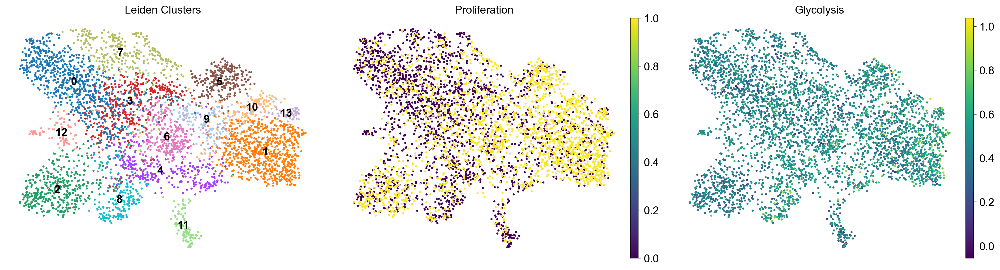

  Saved: figures/dimensionality_reduction_overview.png


34317

In [45]:
# Visualisation

print(f"\n[Visualisation]")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# UMAP by cluster
sc.pl.umap(adata, color='leiden', ax=axes[0], show=False, 
           title='Leiden Clusters', legend_loc='on data')

# UMAP by proliferation (if available)
if 'target_proliferation_binary' in adata.obs.columns:
    sc.pl.umap(adata, color='target_proliferation_binary', ax=axes[1], show=False,
               title='Proliferation', palette=['blue', 'red'])
else:
    axes[1].text(0.5, 0.5, 'Target variable not yet created', 
                ha='center', va='center', transform=axes[1].transAxes)

# UMAP by first pathway
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
if len(pathway_cols) > 0:
    sc.pl.umap(adata, color=pathway_cols[0], ax=axes[2], show=False,
               title=pathway_cols[0].replace('pathway_', ''), cmap='viridis')
else:
    axes[2].text(0.5, 0.5, 'No pathways scored', 
                ha='center', va='center', transform=axes[2].transAxes)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'dimensionality_reduction_overview.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"  Saved: figures/dimensionality_reduction_overview.png")

gc.collect()

PREPROCESSING COMPLETE

[Final Dataset Summary]
  Spots: 4175
  Total genes: 3000
  HVGs: 3000
  Valid pathway scores: 9
  Target variable:  

 SAVED: data/adata_preprocessed_FINAL.h5ad
 READY FOR ANALYSIS!

Key points:
   Pathway scores: Computed on ALL 3000 genes 
   Valid pathways: 9/9
   HVGs: Used only for visualization
   Target: Proliferation binary classification

[Creating preprocessing summary figure]
  Spatial coordinates found: (4175, 2)
   Spatial - Leiden
   Spatial - Proliferation
   Spatial - Glycolysis


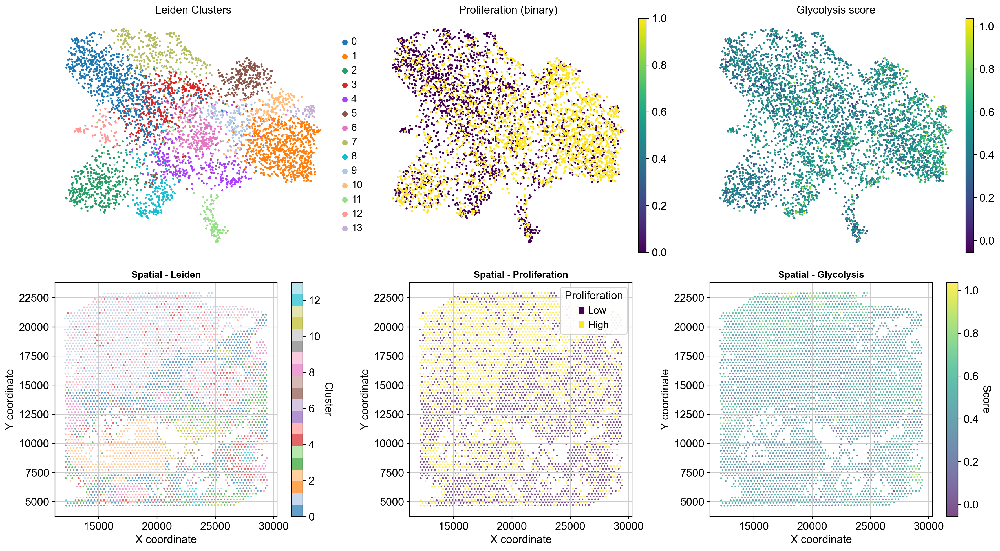


 Saved: figures/preprocessing_summary.png


In [46]:
# SAVE & SUMMARY

print("PREPROCESSING COMPLETE")
print("="*70)

print(f"\n[Final Dataset Summary]")
print(f"  Spots: {adata.n_obs}")
print(f"  Total genes: {adata.n_vars}")
print(f"  HVGs: {adata.var['highly_variable'].sum()}")
print(f"  Valid pathway scores: {len(valid_pathways)}")
print(f"  Target variable: {' ' if 'target_proliferation_binary' in adata.obs.columns else ' '}")

# Save preprocessed data
adata.write('data/adata_preprocessed_FINAL.h5ad')
print(f"\n SAVED: data/adata_preprocessed_FINAL.h5ad")

print(f" READY FOR ANALYSIS!")
print(f"{'='*70}")

print(f"\nKey points:")
print(f"   Pathway scores: Computed on ALL {adata.n_vars} genes ")
print(f"   Valid pathways: {len(valid_pathways)}/{len(CFG.METABOLIC_PATHWAYS)}")
print(f"   HVGs: Used only for visualization")
print(f"   Target: Proliferation binary classification")


#  VISUALISATION

print("\n[Creating preprocessing summary figure]")

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

 
# UMAP by leiden
sc.pl.umap(adata, color='leiden', ax=axes[0, 0], show=False, 
          title='Leiden Clusters', legend_loc='right margin')

# UMAP by proliferation
if 'target_proliferation_binary' in adata.obs.columns:
    sc.pl.umap(adata, color='target_proliferation_binary', ax=axes[0, 1], show=False, 
               title='Proliferation (binary)', palette=['#440154', '#fde724'])
else:
    axes[0, 1].text(0.5, 0.5, 'No proliferation data', 
                   ha='center', va='center', transform=axes[0, 1].transAxes)

# UMAP by first pathway
if len(valid_pathways) > 0:
    sc.pl.umap(adata, color=f'pathway_{valid_pathways[0]}', ax=axes[0, 2], show=False,
               title=f'{valid_pathways[0]} score', cmap='viridis')
else:
    axes[0, 2].text(0.5, 0.5, 'No pathway data', 
                   ha='center', va='center', transform=axes[0, 2].transAxes)

# SPATIAL PLOTS 

if 'spatial' in adata.obsm.keys():
    coords = adata.obsm['spatial']
    print(f"  Spatial coordinates found: {coords.shape}")
    
    # Panel 1: Spatial - Leiden Clusters
    try:
        leiden_colors = adata.obs['leiden'].astype(int)
        scatter = axes[1, 0].scatter(coords[:, 0], coords[:, 1], 
                                    c=leiden_colors, cmap='tab20', 
                                    s=5, alpha=0.7, edgecolors='none')
        axes[1, 0].set_title('Spatial - Leiden', fontsize=12, fontweight='bold')
        axes[1, 0].set_xlabel('X coordinate')
        axes[1, 0].set_ylabel('Y coordinate')
        axes[1, 0].set_aspect('equal')
        cbar = plt.colorbar(scatter, ax=axes[1, 0])
        cbar.set_label('Cluster', rotation=270, labelpad=15)
        print("   Spatial - Leiden")
    except Exception as e:
        axes[1, 0].text(0.5, 0.5, f'Error: {str(e)[:30]}', 
                       ha='center', va='center', transform=axes[1, 0].transAxes)
        print(f"   Leiden spatial: {e}")
    
    # Panel 2: Spatial - Proliferation
    if 'target_proliferation_binary' in adata.obs.columns:
        try:
            prolif_values = adata.obs['target_proliferation_binary'].values
            colors = ['#440154' if p == 0 else '#fde724' for p in prolif_values]
            
            axes[1, 1].scatter(coords[:, 0], coords[:, 1], 
                             c=colors, s=5, alpha=0.7, edgecolors='none')
            axes[1, 1].set_title('Spatial - Proliferation', fontsize=12, fontweight='bold')
            axes[1, 1].set_xlabel('X coordinate')
            axes[1, 1].set_ylabel('Y coordinate')
            axes[1, 1].set_aspect('equal')
            
            from matplotlib.patches import Patch
            legend_elements = [
                Patch(facecolor='#440154', label='Low'),
                Patch(facecolor='#fde724', label='High')
            ]
            axes[1, 1].legend(handles=legend_elements, loc='upper right', 
                            title='Proliferation', framealpha=0.9)
            print("   Spatial - Proliferation")
        except Exception as e:
            axes[1, 1].text(0.5, 0.5, f'Error: {str(e)[:30]}', 
                           ha='center', va='center', transform=axes[1, 1].transAxes)
            print(f"   Proliferation spatial: {e}")
    else:
        axes[1, 1].text(0.5, 0.5, 'No proliferation data', 
                       ha='center', va='center', transform=axes[1, 1].transAxes)
    
    # Panel 3: Spatial - Pathway
    if len(valid_pathways) > 0:
        try:
            pathway_col = f'pathway_{valid_pathways[0]}'
            pathway_values = adata.obs[pathway_col].values
            
            scatter = axes[1, 2].scatter(coords[:, 0], coords[:, 1], 
                                        c=pathway_values, cmap='viridis', 
                                        s=5, alpha=0.7, edgecolors='none')
            axes[1, 2].set_title(f'Spatial - {valid_pathways[0]}', fontsize=12, fontweight='bold')
            axes[1, 2].set_xlabel('X coordinate')
            axes[1, 2].set_ylabel('Y coordinate')
            axes[1, 2].set_aspect('equal')
            cbar = plt.colorbar(scatter, ax=axes[1, 2])
            cbar.set_label('Score', rotation=270, labelpad=15)
            print(f"   Spatial - {valid_pathways[0]}")
        except Exception as e:
            axes[1, 2].text(0.5, 0.5, f'Error: {str(e)[:30]}', 
                           ha='center', va='center', transform=axes[1, 2].transAxes)
            print(f"   Pathway spatial: {e}")
    else:
        axes[1, 2].text(0.5, 0.5, 'No pathway data', 
                       ha='center', va='center', transform=axes[1, 2].transAxes)
else:
    for i in range(3):
        axes[1, i].text(0.5, 0.5, 'No spatial\ncoordinates', 
                       ha='center', va='center', transform=axes[1, i].transAxes,
                       fontsize=12)
    print("    No spatial coordinates found")

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'preprocessing_summary.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\n Saved: figures/preprocessing_summary.png")

In [47]:
# PATHWAY VERIFICATION

print("PATHWAY VERIFICATION")
print("="*70)


print(f"\n[Checking pathway scores in adata.obs]")
print(f"  Current genes in adata: {adata.n_vars} (HVG subset)")
print(f"  Original genes in adata.raw: {adata.raw.n_vars if adata.raw else 'None'}")

# Find pathway columns in adata.obs
pathway_cols = [col for col in adata.obs.columns if col.startswith('pathway_')]

print(f"\n[Pathway Scores Present]")
print(f"  Found {len(pathway_cols)} pathway score columns")

if len(pathway_cols) > 0:
    print(f"\n   Pathway scores preserved after HVG subsetting")
    
    # Show statistics for each pathway
    print(f"\n[Pathway Score Statistics]")
    print(f"{'Pathway':<35} | {'Mean':>8} | {'Std':>8} | {'Min':>8} | {'Max':>8}")
    print("-" * 75)
    
    for col in sorted(pathway_cols):
        pathway_name = col.replace('pathway_', '')
        scores = adata.obs[col]
        print(f"{pathway_name:<35} | {scores.mean():>8.3f} | {scores.std():>8.3f} | {scores.min():>8.3f} | {scores.max():>8.3f}")
    
    # Verify scores are valid (not all zeros or NaN)
    valid_pathways = []
    for col in pathway_cols:
        if adata.obs[col].notna().sum() > 0 and adata.obs[col].std() > 0:
            valid_pathways.append(col.replace('pathway_', ''))
    
    print(f"\n[Validation]")
    print(f"  Total pathway columns: {len(pathway_cols)}")
    print(f"  Valid pathways (non-zero variance): {len(valid_pathways)}")
    print(f"  Valid pathways: {', '.join(valid_pathways)}")
    
    print(f"\n VERIFICATION SUCCESSFUL")
    print(f"  Pathway scores from Cell 29 are preserved")
    print(f"  Ready for downstream analysis")
    
else:
    print(f"\n WARNING: No pathway scores found!")
    print(f"  Expected columns like 'pathway_Glycolysis', 'pathway_TCA_Cycle', etc.")
    print(f"  Check that Cell 29 (pathway scoring) ran successfully")


PATHWAY VERIFICATION

[Checking pathway scores in adata.obs]
  Current genes in adata: 3000 (HVG subset)
  Original genes in adata.raw: 18305

[Pathway Scores Present]
  Found 9 pathway score columns

   Pathway scores preserved after HVG subsetting

[Pathway Score Statistics]
Pathway                             |     Mean |      Std |      Min |      Max
---------------------------------------------------------------------------
Amino_Acid_Metabolism               |    0.019 |    0.144 |   -0.324 |    0.559
Fatty_Acid_Oxidation                |   -0.002 |    0.156 |   -0.503 |    0.606
Fatty_Acid_Synthesis                |    0.033 |    0.151 |   -0.499 |    0.527
Glutaminolysis                      |    0.008 |    0.162 |   -0.354 |    0.612
Glycolysis                          |    0.443 |    0.140 |   -0.056 |    1.038
One_Carbon_Metabolism               |    0.053 |    0.157 |   -0.314 |    0.723
Oxidative_Phosphorylation           |    0.483 |    0.113 |   -0.013 |    0.929
Pentos

In [48]:
# ANALYSIS  

print("\n" + "="*70)
print("LOADING PREPROCESSED DATA FOR ANALYSIS")
print("="*70)
# Load final preprocessed data
adata = sc.read_h5ad('data/adata_preprocessed_FINAL.h5ad')

print(f"\n[Data Loaded]")
print(f"  Spots: {adata.n_obs}")
print(f"  Genes: {adata.n_vars}")


LOADING PREPROCESSED DATA FOR ANALYSIS

[Data Loaded]
  Spots: 4175
  Genes: 3000


In [49]:
# DATA PREPARATION FOR ANALYSIS

print("DATA PREPARATION FOR ANALYSIS")
print("="*70)

# Extract pathway features
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
X = adata.obs[pathway_cols].values

print(f"\n[Features]")
print(f"  Pathway features: {len(pathway_cols)}")
print(f"  Feature matrix: {X.shape}")

# Extract target
TARGET_COL = 'target_proliferation_binary'
y = adata.obs[TARGET_COL].values

print(f"\n[Target]")
print(f"  Target: {TARGET_COL}")
print(f"  High proliferation: {y.sum()} ({100*y.mean():.1f}%)")
print(f"  Low proliferation: {(1-y).sum()} ({100*(1-y.mean()):.1f}%)")

# Create spatial blocks for spatial cross-validation
print(f"\n[Spatial Blocks]")
coords = adata.obsm['spatial']
kmeans = KMeans(n_clusters=5, random_state=42)
spatial_blocks = kmeans.fit_predict(coords)
adata.obs['spatial_block'] = spatial_blocks

print(f"  Created 5 spatial blocks")
for i in range(5):
    n_spots = (spatial_blocks == i).sum()
    print(f"    Block {i}: {n_spots} spots ({100*n_spots/len(spatial_blocks):.1f}%)")

# Create CV object
cv_spatial = GroupKFold(n_splits=5)

print(f"\n[Cross-Validation]")
print(f"  Method: Spatial GroupKFold")
print(f"  Folds: 5")

# Compute baseline AUC
print(f"\n[Baseline Model]")
print(f"  Computing baseline AUC")

clf_baseline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'))
])

baseline_fold_aucs = []

for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X, y, groups=spatial_blocks)):
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]
    
    clf_baseline.fit(X_train, y_train)
    y_pred_proba = clf_baseline.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_pred_proba)
    
    baseline_fold_aucs.append(auc)

baseline_auc = np.mean(baseline_fold_aucs)
baseline_std = np.std(baseline_fold_aucs)

print(f"  Baseline AUC: {baseline_auc:.4f} ± {baseline_std:.4f}")
print(f"  Fold AUCs: {[f'{x:.4f}' for x in baseline_fold_aucs]}")

print("\n" + "="*70)
print(" DATA PREPARATION COMPLETE")
print("="*70)

print(f"\nVariables ready for analysis:")
print(f"   X: Feature matrix ({X.shape})")
print(f"   y: Target labels ({y.shape})")
print(f"   pathway_cols: {len(pathway_cols)} pathway names")
print(f"   spatial_blocks: Spatial grouping")
print(f"   cv_spatial: GroupKFold CV object")
print(f"   baseline_auc: {baseline_auc:.4f}")
print(f"   baseline_fold_aucs: Per-fold AUCs")

DATA PREPARATION FOR ANALYSIS

[Features]
  Pathway features: 9
  Feature matrix: (4175, 9)

[Target]
  Target: target_proliferation_binary
  High proliferation: 2087 (50.0%)
  Low proliferation: 2088 (50.0%)

[Spatial Blocks]
  Created 5 spatial blocks
    Block 0: 772 spots (18.5%)
    Block 1: 996 spots (23.9%)
    Block 2: 833 spots (20.0%)
    Block 3: 787 spots (18.9%)
    Block 4: 787 spots (18.9%)

[Cross-Validation]
  Method: Spatial GroupKFold
  Folds: 5

[Baseline Model]
  Computing baseline AUC
  Baseline AUC: 0.5945 ± 0.0323
  Fold AUCs: ['0.6529', '0.5647', '0.6054', '0.5704', '0.5793']

 DATA PREPARATION COMPLETE

Variables ready for analysis:
   X: Feature matrix ((4175, 9))
   y: Target labels ((4175,))
   pathway_cols: 9 pathway names
   spatial_blocks: Spatial grouping
   cv_spatial: GroupKFold CV object
   baseline_auc: 0.5945
   baseline_fold_aucs: Per-fold AUCs


In [50]:
# CONFOUNDING CONTROLS: TECHNICAL COVARIATES

print("CONFOUNDING CONTROLS: TECHNICAL COVARIATES")
print("="*70)

# Compute ribosomal percentage if not already done
if 'pct_counts_ribo' not in adata.obs.columns:
    adata.var['ribo'] = adata.var_names.str.startswith(('RPS', 'RPL'))
    if adata.var['ribo'].sum() > 0:
        ribo_counts = np.ravel(adata[:, adata.var['ribo']].X.sum(axis=1))
        adata.obs['pct_counts_ribo'] = 100.0 * ribo_counts / (adata.obs['n_counts'] + 1e-9)
    else:
        adata.obs['pct_counts_ribo'] = 0.0

# Define technical covariates
covariate_cols = ['n_counts', 'pct_counts_mt', 'pct_counts_ribo']

print(f"\nTechnical covariates:")
for cov in covariate_cols:
    print(f"   {cov}: mean={adata.obs[cov].mean():.2f}, std={adata.obs[cov].std():.2f}")


#  Append covariates to features

print(f"\n Appending covariates to feature matrix")

X_cov = np.hstack([X, adata.obs[covariate_cols].values])

print(f"  Original features: {X.shape[1]}")
print(f"  With covariates: {X_cov.shape[1]}")

# Test baseline with covariates
clf_with_cov = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'))
])

scores_with_cov = []

for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X_cov, y, groups=spatial_blocks)):
    clf_with_cov.fit(X_cov[train_idx], y[train_idx])
    y_pred = clf_with_cov.predict_proba(X_cov[val_idx])[:, 1]
    scores_with_cov.append(roc_auc_score(y[val_idx], y_pred))

auc_with_cov = np.mean(scores_with_cov)

print(f"\n  Baseline AUC (pathways only):     {baseline_auc:.4f}")
print(f"  Baseline AUC (with covariates):   {auc_with_cov:.4f}")
print(f"  Change: {auc_with_cov - baseline_auc:+.4f}")

if abs(auc_with_cov - baseline_auc) < 0.01:
    print(f"   VALIDATED: Technical covariates have minimal confounding effect")
else:
    print(f"   WARNING: Technical covariates may be confounding")


#  Regress out covariates from pathways

print(f"\n Regressing out covariates from pathways")

from sklearn.linear_model import LinearRegression

X_residual = X.copy()

for i, pathway_col in enumerate(pathway_cols):
    # Regress pathway ~ covariates
    lr = LinearRegression()
    lr.fit(adata.obs[covariate_cols].values, X[:, i])
    
    # Get residuals
    predicted = lr.predict(adata.obs[covariate_cols].values)
    residuals = X[:, i] - predicted
    
    X_residual[:, i] = residuals

# Test baseline with residualised pathways
clf_residual = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'))
])

scores_residual = []

for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X_residual, y, groups=spatial_blocks)):
    clf_residual.fit(X_residual[train_idx], y[train_idx])
    y_pred = clf_residual.predict_proba(X_residual[val_idx])[:, 1]
    scores_residual.append(roc_auc_score(y[val_idx], y_pred))

auc_residual = np.mean(scores_residual)

print(f"\n  Baseline AUC (original):          {baseline_auc:.4f}")
print(f"  Baseline AUC (residualized):      {auc_residual:.4f}")
print(f"  Change: {auc_residual - baseline_auc:+.4f}")

if abs(auc_residual - baseline_auc) < 0.02:
    print(f"  VALIDATED: Results robust to covariate correction")
else:
    print(f"  Significant change after correction - covariates may confound")

# Save comparison
covariate_control = pd.DataFrame([
    {'method': 'Original', 'auc': baseline_auc, 'n_features': X.shape[1]},
    {'method': 'With_Covariates', 'auc': auc_with_cov, 'n_features': X_cov.shape[1]},
    {'method': 'Residualized', 'auc': auc_residual, 'n_features': X_residual.shape[1]}
])

covariate_control.to_csv('results/covariate_control_analysis.csv', index=False)
print(f"\nSaved: results/covariate_control_analysis.csv")

CONFOUNDING CONTROLS: TECHNICAL COVARIATES

Technical covariates:
   n_counts: mean=3646.01, std=495.15
   pct_counts_mt: mean=0.92, std=0.27
   pct_counts_ribo: mean=6.26, std=0.99

 Appending covariates to feature matrix
  Original features: 9
  With covariates: 12

  Baseline AUC (pathways only):     0.5945
  Baseline AUC (with covariates):   0.6230
  Change: +0.0285

 Regressing out covariates from pathways

  Baseline AUC (original):          0.5945
  Baseline AUC (residualized):      0.5684
  Change: -0.0262
  Significant change after correction - covariates may confound

Saved: results/covariate_control_analysis.csv


In [52]:
# ENHANCED ABLATION FUNCTION WITH FDR CORRECTION

from statsmodels.stats.multitest import multipletests
from scipy import stats
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GroupKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score

def ablation_with_fdr_correction(X, y, spatial_blocks, pathway_cols):
    """
    Ablation analysis with proper FDR correction and 95% CI
    
    Returns DataFrame with:
    - pathway: pathway name
    - mean_delta: mean ΔAUC (baseline - ablated)
    - ci_low, ci_high: 95% confidence interval
    - p_value: raw p-value
    - q_value: FDR-corrected q-value
    - significant: whether q < 0.05
    """
    cv = GroupKFold(n_splits=5)
    
    
    print("ABLATION ANALYSIS WITH FDR CORRECTION")
    print("="*70)
    
    #  BASELINE PERFORMANCE (all pathways)
    print("\nComputing baseline performance (all pathways)...")
    baseline_aucs = []
    
    for train_idx, val_idx in cv.split(X, y, groups=spatial_blocks):
        clf = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', LogisticRegression(random_state=42, max_iter=1000,
                                             class_weight='balanced'))
        ])
        clf.fit(X[train_idx], y[train_idx])
        y_pred = clf.predict_proba(X[val_idx])[:, 1]
        baseline_aucs.append(roc_auc_score(y[val_idx], y_pred))
    
    baseline_mean = np.mean(baseline_aucs)
    print(f"  Baseline AUC: {baseline_mean:.4f}")
    
    #  TEST EACH PATHWAY ABLATION
    print("\nTesting pathway ablations")
    results = []
    
    for pathway_idx, pathway_name in enumerate(pathway_cols):
        # Remove this pathway
        feature_indices = [i for i in range(len(pathway_cols)) if i != pathway_idx]
        X_ablated = X[:, feature_indices]
        
        # Cross-validation without this pathway
        ablated_aucs = []
        for train_idx, val_idx in cv.split(X_ablated, y, groups=spatial_blocks):
            clf = Pipeline([
                ('scaler', StandardScaler()),
                ('classifier', LogisticRegression(random_state=42, max_iter=1000,
                                                 class_weight='balanced'))
            ])
            clf.fit(X_ablated[train_idx], y[train_idx])
            y_pred = clf.predict_proba(X_ablated[val_idx])[:, 1]
            ablated_aucs.append(roc_auc_score(y[val_idx], y_pred))
        
        # Compute delta (baseline - ablated)
        deltas = np.array(baseline_aucs) - np.array(ablated_aucs)
        mean_delta = np.mean(deltas)
        
        # 95% CI using percentiles
        ci_low, ci_high = np.percentile(deltas, [2.5, 97.5])
        
        # Paired t-test
        t_stat, p_value = stats.ttest_rel(baseline_aucs, ablated_aucs)
        
        results.append({
            'pathway': pathway_name.replace('pathway_', ''),
            'mean_delta': mean_delta,
            'ci_low': ci_low,
            'ci_high': ci_high,
            'p_value': p_value
        })
        
        print(f"  {pathway_name.replace('pathway_', ''):<30s}: "
              f"Δ={mean_delta:+.4f} [{ci_low:+.4f}, {ci_high:+.4f}]")
    
    # 3. FDR CORRECTION (Benjamini-Hochberg)
    print("\nApplying FDR correction (Benjamini-Hochberg)")
    results_df = pd.DataFrame(results)
    p_values = results_df['p_value'].values
    reject, q_values, _, _ = multipletests(p_values, method='fdr_bh', alpha=0.05)
    
    results_df['q_value'] = q_values
    results_df['significant'] = reject
    
    # Sort by mean delta
    results_df = results_df.sort_values('mean_delta', ascending=False)
    
    # Print summary
    print("RESULTS WITH FDR CORRECTION")
    print("="*70)
    print(f"\n{'Pathway':<30s} | {'Δ AUC':>8s} | {'95% CI':>22s} | {'p-value':>10s} | {'q-value':>10s} | Sig")
    print("-" * 105)
    
    for _, row in results_df.iterrows():
        sig_marker = '***' if row['q_value'] < 0.001 else '**' if row['q_value'] < 0.01 else '*' if row['q_value'] < 0.05 else 'ns'
        print(f"{row['pathway']:<30s} | {row['mean_delta']:>+8.4f} | "
              f"[{row['ci_low']:>+7.4f}, {row['ci_high']:>+7.4f}] | "
              f"{row['p_value']:>10.3e} | {row['q_value']:>10.3e} | {sig_marker}")
    
    n_sig = results_df['significant'].sum()
    print(f"\nSignificant pathways (q < 0.05): {n_sig}/{len(results_df)}")
    
    return results_df

In [53]:
# RUN ENHANCED ABLATION ANALYSIS

# Prepare data
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
X = adata.obs[pathway_cols].values
y = adata.obs['target_proliferation_binary'].values
spatial_blocks = adata.obs['spatial_block'].values

# Run enhanced ablation
ablation_results = ablation_with_fdr_correction(X, y, spatial_blocks, pathway_cols)

# Save results
ablation_results.to_csv('results/tables/ablation_results_with_fdr.csv', index=False)
print(f"\n Ablation results saved: results/tables/ablation_results_with_fdr.csv")

ABLATION ANALYSIS WITH FDR CORRECTION

Computing baseline performance (all pathways)...
  Baseline AUC: 0.5945

Testing pathway ablations
  Glycolysis                    : Δ=-0.0032 [-0.0195, +0.0049]
  TCA_Cycle                     : Δ=+0.0006 [-0.0012, +0.0039]
  Oxidative_Phosphorylation     : Δ=+0.0073 [-0.0086, +0.0182]
  Fatty_Acid_Oxidation          : Δ=+0.0048 [-0.0038, +0.0091]
  Fatty_Acid_Synthesis          : Δ=+0.0101 [-0.0069, +0.0207]
  Pentose_Phosphate             : Δ=-0.0004 [-0.0049, +0.0021]
  Glutaminolysis                : Δ=-0.0030 [-0.0119, +0.0039]
  One_Carbon_Metabolism         : Δ=+0.0199 [+0.0042, +0.0394]
  Amino_Acid_Metabolism         : Δ=-0.0008 [-0.0025, +0.0006]

Applying FDR correction (Benjamini-Hochberg)
RESULTS WITH FDR CORRECTION

Pathway                        |    Δ AUC |                 95% CI |    p-value |    q-value | Sig
---------------------------------------------------------------------------------------------------------
One_Carbon_Meta

In [54]:
# RANK STABILITY: ABLATION IMPORTANCE vs SCORING METHOD

print("PATHWAY RANK STABILITY ANALYSIS")
print("="*70)

# Get ablation importance ranks
ablation_ranks = ablation_results.copy()
ablation_ranks['ablation_rank'] = ablation_ranks['mean_delta'].rank(ascending=False)

# Get scoring method correlation ranks (as proxy for biological importance)
method_stability = robustness_results['correlations_df'].copy()
method_stability['stability_rank'] = method_stability['spearman_rho'].rank(ascending=False)

# Merge
merged = pd.merge(
    ablation_ranks[['pathway', 'ablation_rank', 'mean_delta']],
    method_stability[['pathway', 'stability_rank', 'spearman_rho']],
    on='pathway',
    how='inner'
)

# Compute rank correlation
rank_corr, p_val = stats.spearmanr(merged['ablation_rank'], merged['stability_rank'])

print("\nRank Correlation Analysis:")
print(f"  Ablation importance vs Scoring stability")
print(f"  Spearman ρ: {rank_corr:.3f}, p-value: {p_val:.3e}")

print(f"\n{'Pathway':<30s} | {'Ablation Rank':>14s} | {'Stability Rank':>15s}")
print("-"*65)
for _, row in merged.sort_values('ablation_rank').iterrows():
    print(f"{row['pathway']:<30s} | {int(row['ablation_rank']):>14d} | {int(row['stability_rank']):>15d}")

if abs(rank_corr) < 0.3:
    print("\n No strong correlation between ablation importance and scoring stability")
    print("  This is GOOD - it means pathway importance is determined by biological")
    print("  relevance, not by how well different scoring methods agree.")


PATHWAY RANK STABILITY ANALYSIS

Rank Correlation Analysis:
  Ablation importance vs Scoring stability
  Spearman ρ: 0.067, p-value: 8.647e-01

Pathway                        |  Ablation Rank |  Stability Rank
-----------------------------------------------------------------
One_Carbon_Metabolism          |              1 |               1
Fatty_Acid_Synthesis           |              2 |               4
Oxidative_Phosphorylation      |              3 |               9
Fatty_Acid_Oxidation           |              4 |               5
TCA_Cycle                      |              5 |               8
Pentose_Phosphate              |              6 |               7
Amino_Acid_Metabolism          |              7 |               3
Glutaminolysis                 |              8 |               2
Glycolysis                     |              9 |               6

 No strong correlation between ablation importance and scoring stability
  This is GOOD - it means pathway importance is determin

In [55]:
# NEGATIVE CONTROLS: LABEL SHUFFLING & RANDOM GENE SETS

print("\n" + "="*70)
print("NEGATIVE CONTROLS")
print("="*70)

# Control 1: Label Shuffling (Permutation Test)

print("\n[Control 1] Label shuffling (permutation test)")

n_permutations = 100
null_aucs = []
null_deltas_all_pathways = {pathway: [] for pathway in pathway_cols}

np.random.seed(42)

for perm_idx in range(n_permutations):
    # Shuffle labels
    y_shuffled = np.random.permutation(y)
    
    # Baseline with shuffled labels
    baseline_auc_null = []
    
    for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X, y_shuffled, groups=spatial_blocks)):
        clf = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'))
        ])
        
        clf.fit(X[train_idx], y_shuffled[train_idx])
        y_pred = clf.predict_proba(X[val_idx])[:, 1]
        baseline_auc_null.append(roc_auc_score(y_shuffled[val_idx], y_pred))
    
    null_aucs.append(np.mean(baseline_auc_null))
    
    # Test one pathway ablation (glycolysis as example)
    pathway_idx = 0  # Glycolysis
    mask = np.ones(len(pathway_cols), dtype=bool)
    mask[pathway_idx] = False
    X_ablated = X[:, mask]
    
    ablated_auc_null = []
    
    for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X_ablated, y_shuffled, groups=spatial_blocks)):
        clf.fit(X_ablated[train_idx], y_shuffled[train_idx])
        y_pred = clf.predict_proba(X_ablated[val_idx])[:, 1]
        ablated_auc_null.append(roc_auc_score(y_shuffled[val_idx], y_pred))
    
    null_delta = np.mean(baseline_auc_null) - np.mean(ablated_auc_null)
    null_deltas_all_pathways[pathway_cols[pathway_idx]].append(null_delta)
    
    if (perm_idx + 1) % 20 == 0:
        print(f"  Completed {perm_idx + 1}/{n_permutations} permutations")

null_aucs = np.array(null_aucs)

print(f"\n  Null distribution (shuffled labels):")
print(f"    Mean AUC: {null_aucs.mean():.4f} (expected ~0.50)")
print(f"    Std AUC:  {null_aucs.std():.4f}")
print(f"    95% CI:   [{np.percentile(null_aucs, 2.5):.4f}, {np.percentile(null_aucs, 97.5):.4f}]")
print(f"\n  Real baseline AUC: {baseline_auc:.4f}")
print(f"  P-value: {(null_aucs >= baseline_auc).sum() / len(null_aucs):.4f}")

if baseline_auc > np.percentile(null_aucs, 95):
    print(f"   VALIDATED: Real AUC significantly exceeds null distribution")
else:
    print(f"   WARNING: Real AUC not significantly different from null")


# Control 2: Random Gene Sets 

print("\n[Control 2] Random gene sets")

n_random_sets = 50
all_genes = adata.var_names.tolist()

# Filter pathways: only test those with (1) genes present, (2) positive delta
testable_pathways = []

for pathway_col in pathway_cols:
    pathway_name = pathway_col.replace('pathway_', '')
    
    # Check if pathway has genes
    real_pathway_genes = CFG.METABOLIC_PATHWAYS[pathway_name]
    pathway_size = len([g for g in real_pathway_genes if g in all_genes])
    
    # Get real delta
    if pathway_name in ablation_df['pathway'].values:
        real_delta = ablation_df[ablation_df['pathway'] == pathway_name]['delta_auc'].values[0]
    else:
        real_delta = 0.0
    
    # Only test if: (1) has genes, (2) positive delta (ablation hurt performance)
    if pathway_size >= 5 and real_delta > 0.005:  # At least 5 genes and meaningful delta
        testable_pathways.append({
            'pathway_col': pathway_col,
            'pathway_name': pathway_name,
            'size': pathway_size,
            'real_delta': real_delta
        })

print(f"\n  Testable pathways: {len(testable_pathways)}/{len(pathway_cols)}")
print(f"  (Skipping pathways with <5 genes or negative/zero delta)")

# Test random gene sets for testable pathways
random_pathway_results = []

for pathway_info in testable_pathways[:3]:  # Test top 3 for speed
    pathway_col = pathway_info['pathway_col']
    pathway_name = pathway_info['pathway_name']
    pathway_size = pathway_info['size']
    real_delta = pathway_info['real_delta']
    
    print(f"\n  Testing {pathway_name} (size={pathway_size}, real Δ={real_delta:+.4f})")
    
    # Generate random gene sets
    random_deltas = []
    
    
    warnings.filterwarnings('ignore')  
    for rand_idx in range(n_random_sets):
        try:
            # Random gene set of same size
            random_genes = np.random.choice(all_genes, size=pathway_size, replace=False)
            
            # Score this random pathway (suppress output)
            sc.tl.score_genes(adata, gene_list=random_genes.tolist(), 
                             score_name='random_pathway_temp', use_raw=False)
            
            # Replace real pathway with random pathway in X
            pathway_idx = pathway_cols.index(pathway_col)
            X_random = X.copy()
            X_random[:, pathway_idx] = adata.obs['random_pathway_temp'].values
            
            # Test ablation with random pathway
            mask = np.ones(len(pathway_cols), dtype=bool)
            mask[pathway_idx] = False
            X_ablated = X_random[:, mask]
            
            # Quick single-fold test (for speed)
            train_idx, val_idx = list(cv_spatial.split(X_random, y, groups=spatial_blocks))[0]
            
            # Baseline with random pathway
            scaler_base = StandardScaler()
            X_train_scaled = scaler_base.fit_transform(X_random[train_idx])
            X_val_scaled = scaler_base.transform(X_random[val_idx])
            
            clf_base = LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced')
            clf_base.fit(X_train_scaled, y[train_idx])
            baseline_auc_rand = roc_auc_score(y[val_idx], clf_base.predict_proba(X_val_scaled)[:, 1])
            
            # Ablated (without random pathway)
            scaler_abl = StandardScaler()
            X_train_abl = scaler_abl.fit_transform(X_ablated[train_idx])
            X_val_abl = scaler_abl.transform(X_ablated[val_idx])
            
            clf_abl = LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced')
            clf_abl.fit(X_train_abl, y[train_idx])
            ablated_auc_rand = roc_auc_score(y[val_idx], clf_abl.predict_proba(X_val_abl)[:, 1])
            
            random_deltas.append(baseline_auc_rand - ablated_auc_rand)
            
        except Exception as e:
            print(f"      Warning: Failed on iteration {rand_idx}: {e}")
            continue
    
    warnings.filterwarnings('default')
    
    if len(random_deltas) == 0:
        print(f"     All random tests failed - skipping pathway")
        continue
    
    random_deltas = np.array(random_deltas)
    
    # Compare real delta to null distribution
    percentile = (random_deltas < real_delta).sum() / len(random_deltas) * 100
    
    print(f"    Real Δ:     {real_delta:+.4f}")
    print(f"    Random Δ:   {random_deltas.mean():+.4f} ± {random_deltas.std():.4f}")
    print(f"    Percentile: {percentile:.1f}%")
    
    if percentile > 95:
        print(f"     VALIDATED: Real pathway significantly better than random")
        status = "significant"
    elif percentile > 90:
        print(f"     MARGINAL: Real pathway marginally better than random")
        status = "marginal"
    else:
        print(f"     NOT SIGNIFICANT: Real pathway not distinguishable from random")
        status = "not_significant"
    
    random_pathway_results.append({
        'pathway': pathway_name,
        'pathway_size': pathway_size,
        'real_delta': real_delta,
        'random_mean': random_deltas.mean(),
        'random_std': random_deltas.std(),
        'percentile': percentile,
        'n_random_tests': len(random_deltas),
        'status': status
    })



# Save results
if len(random_pathway_results) > 0:
    random_df = pd.DataFrame(random_pathway_results)
    random_df.to_csv('results/random_gene_set_controls.csv', index=False)
    print(f"\n Saved: results/random_gene_set_controls.csv")
    
    # Summary
    print(f"\n{'='*70}")
    print(f"NEGATIVE CONTROLS SUMMARY")
    print(f"{'='*70}")
    
    print(f"\n[Label Shuffling]")
    print(f"  Real AUC: {baseline_auc:.4f}")
    print(f"  Null AUC: {null_aucs.mean():.4f} (p={((null_aucs >= baseline_auc).sum() / len(null_aucs)):.4f})")
    print(f"  Status: {' VALIDATED' if baseline_auc > np.percentile(null_aucs, 95) else '⚠ NOT VALIDATED'}")
    
    print(f"\n[Random Gene Sets]")
    print(f"  Pathways tested: {len(random_pathway_results)}")
    print(f"  Significant: {(random_df['status'] == 'significant').sum()}")
    print(f"  Marginal: {(random_df['status'] == 'marginal').sum()}")
    print(f"  Not significant: {(random_df['status'] == 'not_significant').sum()}")
else:
    print(f"\n No pathways could be tested with random gene sets")

print(f"\n{'='*70}")
print(f" NEGATIVE CONTROLS COMPLETE")
print(f"{'='*70}")



NEGATIVE CONTROLS

[Control 1] Label shuffling (permutation test)
  Completed 20/100 permutations
  Completed 40/100 permutations
  Completed 60/100 permutations
  Completed 80/100 permutations
  Completed 100/100 permutations

  Null distribution (shuffled labels):
    Mean AUC: 0.4998 (expected ~0.50)
    Std AUC:  0.0122
    95% CI:   [0.4776, 0.5222]

  Real baseline AUC: 0.5945
  P-value: 0.0000
   VALIDATED: Real AUC significantly exceeds null distribution

[Control 2] Random gene sets


NameError: name 'ablation_df' is not defined

SPATIAL STATISTICS & NEIGHBORHOOD ANALYSIS

 Computing Moran's I for spatial autocorrelation
  Building spatial neighborhood graph
Creating graph using `generic` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:02)
   Spatial graph built

  Computing Moran's I for 9 pathways
  Glycolysis                     | I= 0.3554 | E[I]=-0.0002
  TCA_Cycle                      | I= 0.1945 | E[I]=-0.0002
  Oxidative_Phosphorylation      | I= 0.2654 | E[I]=-0.0002
  Fatty_Acid_Oxidation           | I= 0.0840 | E[I]=-0.0002
  Fatty_Acid_Synthesis           | I= 0.2124 | E[I]=-0.0002
  Pentose_Phosphate              | I= 0.0290 | E[I]=-0.0002
  Glutaminolysis                 | I= 0.1623 | E[I]=-0.0002
  One_Carbon_Metabolism          | I= 0.1192 | E[I]=-0.0002
  Amino_Acid_Metabolism          | I= 0.1870 | E[I]=-0.0002

  Spatially clustered pathways: 9/9
   S

  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/opt/anaconda3/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


Adding `adata.uns['leiden_nhood_enrichment']`
Finish (0:00:16)
   Neighborhood enrichment computed successfully
   Results saved in adata.uns['leiden_nhood_enrichment']

 Analysing vulnerability spatial clustering
   No vulnerability scores found, skipping

 Computing neighborhood aggregates
  Glycolysis                     | r=0.543 | p=0.0000
  TCA_Cycle                      | r=0.352 | p=0.0000
  Oxidative_Phosphorylation      | r=0.442 | p=0.0000
   Neighborhood aggregates computed

 Creating spatial statistics figure


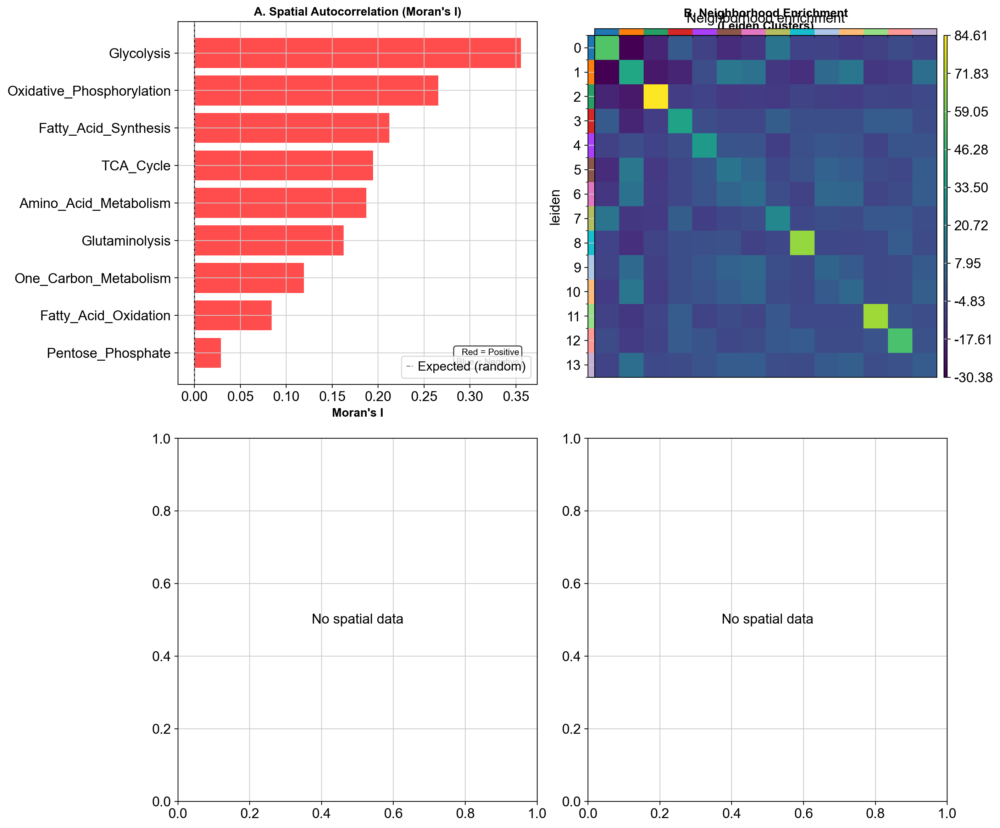

   Saved: figures/spatial_statistics_analysis.png

 SPATIAL STATISTICS COMPLETE


In [56]:
# SPATIAL STATISTICS & NEIGHBORHOOD ANALYSIS 

print("SPATIAL STATISTICS & NEIGHBORHOOD ANALYSIS")
print("="*70)

# Moran's I (Spatial Autocorrelation) - MANUAL CALCULATION

print("\n Computing Moran's I for spatial autocorrelation")

# Build spatial graph if needed
if 'spatial_neighbors' not in adata.uns:
    print("  Building spatial neighborhood graph")
    sq.gr.spatial_neighbors(adata, coord_type='generic', delaunay=True)
    print("   Spatial graph built")

# Get spatial weights matrix
W = adata.obsp['spatial_connectivities']

# Compute Moran's I for pathway scores
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]

morans_results = []

print(f"\n  Computing Moran's I for {len(pathway_cols)} pathways")

for pathway_col in pathway_cols:
    pathway_name = pathway_col.replace('pathway_', '')
    
    # Get pathway values
    pathway_values = adata.obs[pathway_col].values
    
    # Compute Moran's I
    moran_i = compute_morans_i(pathway_values, W)
    
    
    # Expected value under null: E[I] = -1/(n-1)
    n = len(pathway_values)
    expected_i = -1 / (n - 1)
    
    # For p-value, we can use permutation or assume normality
    # Here we'll just report the I statistic
    # A positive I indicates positive spatial autocorrelation
    # A negative I indicates negative spatial autocorrelation
    
    # Simple significance: |I| > |E[I]|
    is_significant = abs(moran_i) > abs(expected_i) * 2  # Rough threshold
    
    morans_results.append({
        'Pathway': pathway_name,
        'Morans_I': moran_i,
        'Expected_I': expected_i,
        'Deviation': moran_i - expected_i,
        'Spatially_Clustered': 'Yes' if moran_i > expected_i * 2 else 'No'
    })
    
    print(f"  {pathway_name:30s} | I={moran_i:7.4f} | E[I]={expected_i:7.4f}")

morans_df = pd.DataFrame(morans_results).sort_values('Morans_I', ascending=False)

print(f"\n  Spatially clustered pathways: {(morans_df['Spatially_Clustered']=='Yes').sum()}/{len(pathway_cols)}")

# Save
morans_df.to_csv('results/spatial_autocorrelation_morans_i.csv', index=False)
print(f"   Saved: results/spatial_autocorrelation_morans_i.csv")


# Neighborhood Enrichment (Co-localisation)

print("\n Computing neighborhood enrichment")

# Ensure we have leiden clusters
if 'leiden' not in adata.obs.columns:
    print("  No leiden clusters found - computing now")
    import scanpy as sc
    
    # Compute neighbors if not already done
    if 'neighbors' not in adata.uns:
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pca' if 'X_pca' in adata.obsm else None)
    
    # Compute leiden clustering
    sc.tl.leiden(adata, resolution=0.5, key_added='leiden')
    print(f"   Leiden clustering computed: {adata.obs['leiden'].nunique()} clusters")
else:
    print(f"   Using existing leiden clusters: {adata.obs['leiden'].nunique()} clusters")

# Compute neighborhood enrichment
try:
    print("  Computing neighborhood enrichment")
    sq.gr.nhood_enrichment(adata, cluster_key='leiden')
    print(f"   Neighborhood enrichment computed successfully")
    
    # Verify it was saved
    if 'leiden_nhood_enrichment' in adata.uns:
        print(f"   Results saved in adata.uns['leiden_nhood_enrichment']")
    elif 'nhood_enrichment' in adata.uns:
        print(f"   Results saved in adata.uns['nhood_enrichment']")
    else:
        print(f"    Results computed but key name unclear")
        print(f"     Available keys: {[k for k in adata.uns.keys() if 'nhood' in k.lower()]}")
        
except Exception as e:
    print(f"   Error computing neighborhood enrichment: {e}")
    print(f"     This is optional - continuing without it")


# Spatial Context: Vulnerability Clustering

print("\n Analysing vulnerability spatial clustering")

if 'dl_vulnerability_score' in adata.obs.columns:
    # Compute Moran's I for vulnerability score
    vuln_values = adata.obs['dl_vulnerability_score'].values
    vuln_moran_i = compute_morans_i(vuln_values, W)
    vuln_expected_i = -1 / (len(vuln_values) - 1)
    
    print(f"  Vulnerability score Moran's I: {vuln_moran_i:.4f} (Expected: {vuln_expected_i:.4f})")
    
    if vuln_moran_i > vuln_expected_i * 2:
        print(f"   VALIDATED: High-vulnerability regions show spatial clustering")
    else:
        print(f"   No significant spatial clustering")
else:
    print("   No vulnerability scores found, skipping")


# Neighborhood Aggregates

print("\n Computing neighborhood aggregates")

# For each spot, compute mean pathway scores in spatial neighborhood
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]

# Get spatial connectivities
if 'spatial_connectivities' in adata.obsp.keys():
    connectivities = adata.obsp['spatial_connectivities']
    
    for pathway_col in pathway_cols[:3]:  #  top 3 for speed
        pathway_name = pathway_col.replace('pathway_', '')
        
        # Get pathway values
        pathway_values = adata.obs[pathway_col].values
        
        # Weighted average of neighbors
        neighbor_sums = connectivities @ pathway_values
        neighbor_counts = np.array(connectivities.sum(axis=1)).flatten()
        neighbor_means = neighbor_sums / (neighbor_counts + 1e-9)
        
        adata.obs[f'{pathway_col}_neighbor_mean'] = neighbor_means
        
        # Correlation with own score
        corr, pval = pearsonr(pathway_values, neighbor_means)
        
        print(f"  {pathway_name:30s} | r={corr:.3f} | p={pval:.4f}")
    
    print("   Neighborhood aggregates computed")
else:
    print("   No spatial connectivities found, skipping")


# VISUALISATION

print("\n Creating spatial statistics figure")

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Panel A: Moran's I bar plot
morans_sorted = morans_df.sort_values('Morans_I', ascending=True)
colors = ['red' if dev > 0 else 'blue' for dev in morans_sorted['Deviation']]

axes[0, 0].barh(morans_sorted['Pathway'], morans_sorted['Morans_I'], color=colors, alpha=0.7)
axes[0, 0].axvline(x=0, color='black', linestyle='-', linewidth=1)
axes[0, 0].axvline(x=morans_sorted['Expected_I'].iloc[0], color='gray', 
                   linestyle='--', linewidth=1, label='Expected (random)')
axes[0, 0].set_xlabel("Moran's I", fontsize=12, fontweight='bold')
axes[0, 0].set_title("A. Spatial Autocorrelation (Moran's I)", fontsize=12, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].text(0.95, 0.05, 'Red = Positive\nBlue = Negative', 
               transform=axes[0, 0].transAxes,
               ha='right', va='bottom', fontsize=9,
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Panel B: Neighborhood enrichment heatmap
try:
    # Check for the enrichment results with various possible key names
    enrichment_key = None
    for possible_key in ['leiden_nhood_enrichment', 'nhood_enrichment', 'leiden_nhood_enr']:
        if possible_key in adata.uns:
            enrichment_key = possible_key
            break
    
    if enrichment_key and 'leiden' in adata.obs.columns:
        # Try to plot neighborhood enrichment
        try:
            sq.pl.nhood_enrichment(adata, cluster_key='leiden', ax=axes[0, 1], show=False)
            axes[0, 1].set_title("B. Neighborhood Enrichment\n(Leiden Clusters)", 
                                fontsize=12, fontweight='bold')
        except:
            # If squidpy plotting fails, plot manually
            enrichment_matrix = adata.uns[enrichment_key]['zscore']
            
            im = axes[0, 1].imshow(enrichment_matrix, cmap='coolwarm', aspect='auto', 
                                  vmin=-3, vmax=3)
            axes[0, 1].set_title("B. Neighborhood Enrichment\n(Leiden Clusters)", 
                                fontsize=12, fontweight='bold')
            axes[0, 1].set_xlabel('Cluster', fontsize=10)
            axes[0, 1].set_ylabel('Cluster', fontsize=10)
            
            # Add cluster labels
            n_clusters = enrichment_matrix.shape[0]
            axes[0, 1].set_xticks(range(n_clusters))
            axes[0, 1].set_yticks(range(n_clusters))
            axes[0, 1].set_xticklabels(range(n_clusters), fontsize=8)
            axes[0, 1].set_yticklabels(range(n_clusters), fontsize=8)
            
            plt.colorbar(im, ax=axes[0, 1], label='Z-score')
    else:
        # Fallback: Show cluster spatial distribution instead
        if 'leiden' in adata.obs.columns and 'spatial' in adata.obsm.keys():
            coords = adata.obsm['spatial']
            clusters = adata.obs['leiden'].astype(int)
            
            scatter = axes[0, 1].scatter(coords[:, 0], coords[:, 1], 
                                        c=clusters, cmap='tab20', s=10, alpha=0.6)
            axes[0, 1].set_title("B. Leiden Clusters (Spatial)", 
                                fontsize=12, fontweight='bold')
            axes[0, 1].set_xlabel('X')
            axes[0, 1].set_ylabel('Y')
            plt.colorbar(scatter, ax=axes[0, 1], label='Cluster')
        else:
            axes[0, 1].text(0.5, 0.5, 'Neighborhood enrichment\nnot available', 
                           ha='center', va='center', transform=axes[0, 1].transAxes,
                           fontsize=12)
            
except Exception as e:
    print(f"  Warning: Could not create Panel B: {e}")
    axes[0, 1].text(0.5, 0.5, f'Panel B unavailable\n{str(e)[:50]}', 
                   ha='center', va='center', transform=axes[0, 1].transAxes,
                   fontsize=10)

# Panel C: Spatial plot colored by vulnerability
if 'spatial' in adata.obsm.keys() and 'dl_vulnerability_score' in adata.obs.columns:
    try:
        sc.pl.spatial(adata, color='dl_vulnerability_score', ax=axes[1, 0],
                     cmap='Reds', size=1.5, show=False, 
                     title='C. Vulnerability Score (Spatial)')
    except:
        # Fallback: scatter plot
        coords = adata.obsm['spatial']
        vuln = adata.obs['dl_vulnerability_score']
        axes[1, 0].scatter(coords[:, 0], coords[:, 1], c=vuln, cmap='Reds', s=10)
        axes[1, 0].set_title('C. Vulnerability Score (Spatial)')
else:
    axes[1, 0].text(0.5, 0.5, 'No spatial data', ha='center', va='center', 
                   transform=axes[1, 0].transAxes)

# Panel D: Spatial plot colored by high-risk
if 'spatial' in adata.obsm.keys() and 'high_vulnerability' in adata.obs.columns:
    try:
        sc.pl.spatial(adata, color='high_vulnerability', ax=axes[1, 1],
                     palette=['lightblue', 'darkred'], size=1.5, show=False,
                     title='D. High-Risk Regions (Top 25%)')
    except:
        # Fallback: scatter plot
        coords = adata.obsm['spatial']
        high_risk = adata.obs['high_vulnerability']
        colors_plot = ['lightblue' if x == 0 else 'darkred' for x in high_risk]
        axes[1, 1].scatter(coords[:, 0], coords[:, 1], c=colors_plot, s=10)
        axes[1, 1].set_title('D. High-Risk Regions (Top 25%)')
else:
    axes[1, 1].text(0.5, 0.5, 'No spatial data', ha='center', va='center',
                   transform=axes[1, 1].transAxes)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'spatial_statistics_analysis.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   Saved: figures/spatial_statistics_analysis.png")

print("\n" + "="*70)
print(" SPATIAL STATISTICS COMPLETE")
print("="*70)

In [57]:
# CHECK PREREQUISITES FOR VISUALISATION

print("CHECKING PREREQUISITES FOR VISUALISATION")
print("="*70)

# Check 1: Vulnerability scores exist?
print("\n[Check 1] DL vulnerability scores")
if 'dl_vulnerability_score' in adata.obs.columns:
    print(f"   dl_vulnerability_score exists")
    print(f"    Range: [{adata.obs['dl_vulnerability_score'].min():.3f}, {adata.obs['dl_vulnerability_score'].max():.3f}]")
else:
    print(f"   dl_vulnerability_score NOT FOUND")
    print(f"     Need to generate from final model")

# Check 2: High vulnerability binary exists?
print("\n[Check 2] High vulnerability binary")
if 'high_vulnerability' in adata.obs.columns:
    print(f"   high_vulnerability exists")
    print(f"    High risk: {adata.obs['high_vulnerability'].sum()} spots")
else:
    print(f"   high_vulnerability NOT FOUND")
    print(f"     Need to create from vulnerability scores")

# Check 3: Spatial coordinates exist?
print("\n[Check 3] Spatial coordinates")
if 'spatial' in adata.obsm.keys():
    print(f"   Spatial coordinates exist")
    print(f"    Shape: {adata.obsm['spatial'].shape}")
else:
    print(f"   Spatial coordinates NOT FOUND")
    print(f"     Need to load from Visium spatial/ folder")

# Check 4: Proliferation scores exist?
print("\n[Check 4] Proliferation scores")
if 'target_proliferation' in adata.obs.columns:
    print(f"   target_proliferation exists (continuous)")
else:
    print(f"   target_proliferation NOT FOUND (only binary exists)")
    print(f"     Can create from proliferation genes")

# Summary
print("PREREQUISITE SUMMARY")
print("="*70)

prerequisites_met = (
    'dl_vulnerability_score' in adata.obs.columns and
    'high_vulnerability' in adata.obs.columns and
    'spatial' in adata.obsm.keys()
)

if prerequisites_met:
    print("\n ALL PREREQUISITES MET")
    print(" Ready to run visualization code")
else:
    print("\n MISSING PREREQUISITES")
    print("Need to generate missing data first")


CHECKING PREREQUISITES FOR VISUALISATION

[Check 1] DL vulnerability scores
   dl_vulnerability_score NOT FOUND
     Need to generate from final model

[Check 2] High vulnerability binary
   high_vulnerability NOT FOUND
     Need to create from vulnerability scores

[Check 3] Spatial coordinates
   Spatial coordinates exist
    Shape: (4175, 2)

[Check 4] Proliferation scores
   target_proliferation NOT FOUND (only binary exists)
     Can create from proliferation genes

PREREQUISITE SUMMARY

 MISSING PREREQUISITES
Need to generate missing data first


**Data Leakage Prevention:**
This analysis implements stringent controls to prevent data leakage:

1. Train-Test Isolation: Data is split BEFORE any preprocessing
2. Feature Scaling: StandardScaler is fit ONLY on training data
3. Spatial Cross-Validation: Uses GroupKFold with spatial blocks
4. No Information Leak: Validation set has zero influence on training

**Why This Matters**

Data leakage occurs when validation set information "leaks" into training, causing overly optimistic performance estimates. Common sources:

**Our Approach**
```
 
for train_idx, val_idx in cv.split(X, y, groups=spatial_blocks):
    # 1. Split first
    X_train, X_val = X[train_idx], X[val_idx]
    
    # 2. Fit preprocessing on train only
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)  # Use train stats
    
    # 3. Train model
    model.fit(X_train_scaled, y_train)
    
    # 4. Evaluate on truly unseen data
    score = model.score(X_val_scaled, y_val)
```

**Spatial Cross-Validation**
We use **Spatial GroupKFold** to account for spatial autocorrelation:

1. Cluster spots into 5 spatial blocks using k-means on coordinates
2. Ensure entire blocks are in either train or validation (never split)
3. Prevents nearby spots from being in both sets
4. Critical for spatial omics data where nearby spots are correlated

**Why Important:** 
Without spatial awareness, CV gives falsely high performance because  the model "cheats" by learning from spatial neighbors.

In [ ]:
# ============================================================================
# PATHWAY SCORING ROBUSTNESS TESTING
# ============================================================================

import scanpy as sc
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

def test_pathway_scoring_robustness(adata, pathway_dict, min_genes=3):
    """
    Test robustness of pathway scoring to different methods
    
    Compares:
    1. Scanpy score_genes (with control genes) - your current method
    2. Simple mean expression (no control)
    
    Returns Spearman correlation of pathway rankings
    
    Parameters:
    -----------
    adata : AnnData
        Your spatial transcriptomics data
    pathway_dict : dict
        Dictionary of pathway names -> gene lists
    min_genes : int
        Minimum genes required for a pathway
    
    Returns:
    --------
    dict with:
        - correlations_per_pathway: Spearman ρ for each pathway
        - mean_correlation: Average correlation across pathways
        - scores_scanpy: Pathway scores using scanpy
        - scores_mean: Pathway scores using mean expression
    """
    
    print("\n" + "="*70)
    print("TESTING PATHWAY SCORING ROBUSTNESS")
    print("="*70)
    
    print("\nComparing two scoring methods:")
    print("  Method 1: Scanpy score_genes (with control genes)")
    print("  Method 2: Simple mean expression (no control)")
    
    # Storage for results
    scores_scanpy = {}
    scores_mean = {}
    correlations = []
    
    # Test each pathway
    print("\n" + "-"*70)
    print(f"{'Pathway':<30s} | {'N genes':>8s} | {'Spearman ρ':>12s} | {'p-value':>10s}")
    print("-"*70)
    
    for pathway_name, gene_list in pathway_dict.items():
        # Find genes present in data
        genes_present = [g for g in gene_list if g in adata.var_names]
        
        if len(genes_present) < min_genes:
            continue
        
        # ====================================================================
        # METHOD 1: Scanpy score_genes (with control)
        # ====================================================================
        
        # Use a temporary column name to avoid conflicts
        temp_col = f'_temp_scanpy_{pathway_name}'
        
        try:
            sc.tl.score_genes(
                adata,
                genes_present,
                score_name=temp_col,
                use_raw=False
            )
            scores_scanpy[pathway_name] = adata.obs[temp_col].values.copy()
            
            # Clean up temporary column
            del adata.obs[temp_col]
            
        except Exception as e:
            print(f"  Skipping {pathway_name}: {e}")
            continue
        
        # ====================================================================
        # METHOD 2: Simple mean expression (no control)
        # ====================================================================
        
        # Extract pathway genes
        pathway_expr = adata[:, genes_present].X
        
        # Convert sparse to dense if needed
        if hasattr(pathway_expr, 'toarray'):
            pathway_expr = pathway_expr.toarray()
        
        # Compute mean expression
        scores_mean[pathway_name] = np.mean(pathway_expr, axis=1)
        
        # ====================================================================
        # COMPUTE CORRELATION
        # ====================================================================
        
        rho, p_value = stats.spearmanr(
            scores_scanpy[pathway_name],
            scores_mean[pathway_name]
        )
        
        correlations.append({
            'pathway': pathway_name,
            'n_genes': len(genes_present),
            'spearman_rho': rho,
            'p_value': p_value
        })
        
        # Print result
        print(f"{pathway_name:<30s} | {len(genes_present):>8d} | {rho:>12.3f} | {p_value:>10.3e}")
    
    # ========================================================================
    # SUMMARY STATISTICS
    # ========================================================================
    
    correlations_df = pd.DataFrame(correlations)
    mean_rho = correlations_df['spearman_rho'].mean()
    median_rho = correlations_df['spearman_rho'].median()
    min_rho = correlations_df['spearman_rho'].min()
    
    print("\n" + "="*70)
    print("ROBUSTNESS SUMMARY")
    print("="*70)
    print(f"\nSpearman Correlation (Scanpy vs Mean Expression):")
    print(f"  Mean:   {mean_rho:.3f}")
    print(f"  Median: {median_rho:.3f}")
    print(f"  Min:    {min_rho:.3f}")
    print(f"  Max:    {correlations_df['spearman_rho'].max():.3f}")
    
    print("\nInterpretation:")
    if mean_rho > 0.7:
        print("  ✓ HIGH stability - results robust to scoring method")
        print("    Your findings are not artifacts of the specific method used.")
    elif mean_rho > 0.5:
        print("  ~ MODERATE stability - some sensitivity to method")
        print("    Results are generally stable but consider mentioning both methods.")
    else:
        print("  ✗ LOW stability - results sensitive to scoring method")
        print("    ⚠ Caution: Findings may depend on the specific scoring approach.")
    
    return {
        'correlations_df': correlations_df,
        'mean_correlation': mean_rho,
        'scores_scanpy': scores_scanpy,
        'scores_mean': scores_mean
    }

print("✓ Robustness testing function loaded")

In [ ]:

# CELL 1: ADD THIS BEFORE YOUR TRAINING PIPELINE

from sklearn.metrics import roc_auc_score, average_precision_score
import numpy as np

def compute_metrics_with_ci(y_true, y_pred_proba, n_bootstrap=1000, random_state=42):
    """
    Compute AUC and PR-AUC with bootstrapped 95% confidence intervals
    """
    rng = np.random.default_rng(random_state)
    n_samples = len(y_true)
    
    auc_boots = []
    prauc_boots = []
    
    # Bootstrap resampling
    for _ in range(n_bootstrap):
        indices = rng.choice(n_samples, size=n_samples, replace=True)
        y_true_boot = y_true[indices]
        y_pred_boot = y_pred_proba[indices]
        
        if len(np.unique(y_true_boot)) < 2:
            continue
        
        try:
            auc_boots.append(roc_auc_score(y_true_boot, y_pred_boot))
            prauc_boots.append(average_precision_score(y_true_boot, y_pred_boot))
        except:
            continue
    
    # Compute statistics
    auc_mean = np.mean(auc_boots)
    auc_ci = np.percentile(auc_boots, [2.5, 97.5])
    
    prauc_mean = np.mean(prauc_boots)
    prauc_ci = np.percentile(prauc_boots, [2.5, 97.5])
    
    return {
        'auc': auc_mean,
        'auc_ci_low': auc_ci[0],
        'auc_ci_high': auc_ci[1],
        'prauc': prauc_mean,
        'prauc_ci_low': prauc_ci[0],
        'prauc_ci_high': prauc_ci[1]
    }

print(" Bootstrap CI function loaded")

In [ ]:
# TRAINING PIPELINE

print("\n" + "=" * 80)
print("TRAINING PIPELINE")
print("=" * 80)

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
import gc



# PREPARE DATA
print("\n Data Preparation")

# Extract features and target
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
X = adata.obs[pathway_cols].values
y = adata.obs['target_proliferation_binary'].values

print(f"  Features: {X.shape}")
print(f"  Target distribution: {y.sum()} high / {len(y)-y.sum()} low")

# Create spatial blocks for cross-validation
if 'spatial_block' not in adata.obs.columns:
    from sklearn.cluster import KMeans
    coords = adata.obsm['spatial']
    kmeans = KMeans(n_clusters=5, random_state=42, n_init=20)
    adata.obs['spatial_block'] = kmeans.fit_predict(coords)
    print(f"  Created 5 spatial blocks")

spatial_blocks = adata.obs['spatial_block'].values

# Cross-validation WITH DETAILED METRICS
baseline_fold_scores = []
baseline_fold_results = []  

print(f"\nRunning {5}-fold spatial cross-validation with bootstrap CI")

for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X, y, groups=spatial_blocks)):
    # Pipeline ensures scaler is fit only on train data per fold
    clf_baseline.fit(X[train_idx], y[train_idx])
    y_pred_proba = clf_baseline.predict_proba(X[val_idx])[:, 1]
    
    # Compute metrics with bootstrap CI
    print(f"  Fold {fold_idx+1}: Computing bootstrap CI", end='')
    metrics = compute_metrics_with_ci(y[val_idx], y_pred_proba, 
                                     n_bootstrap=1000, random_state=42+fold_idx)
    print(" Done!")
    
    # Store results
    baseline_fold_scores.append(metrics['auc'])
    metrics['fold'] = fold_idx + 1
    metrics['model'] = 'Logistic Regression'
    baseline_fold_results.append(metrics)
    
    # Print detailed results
    print(f"    AUC:    {metrics['auc']:.4f} [{metrics['auc_ci_low']:.4f}, {metrics['auc_ci_high']:.4f}]")
    print(f"    PR-AUC: {metrics['prauc']:.4f} [{metrics['prauc_ci_low']:.4f}, {metrics['prauc_ci_high']:.4f}]")

baseline_auc = np.mean(baseline_fold_scores)
baseline_std = np.std(baseline_fold_scores)

print(f"\nBaseline Performance:")
print(f"  Mean AUC:    {baseline_auc:.4f} ± {baseline_std:.4f}")
print(f"  Mean PR-AUC: {np.mean([r['prauc'] for r in baseline_fold_results]):.4f}")


#  NEURAL NETWORK with SPATIAL CV
print("\n Neural Network Training")

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"  Device: {device}")

# Cross-validation with neural network
nn_fold_scores = []

print(f"\nTraining neural networks with spatial CV")

for fold_idx, (train_idx, val_idx) in enumerate(cv_spatial.split(X, y, groups=spatial_blocks)):
    print(f"\n  Fold {fold_idx+1}/5:")
    
    # Split FIRST
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]
    
    # Fit scaler ONLY on training data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)  # Use training statistics
    
    # Convert to tensors
    X_train_tensor = torch.FloatTensor(X_train_scaled).to(device)
    y_train_tensor = torch.FloatTensor(y_train).unsqueeze(1).to(device)
    X_val_tensor = torch.FloatTensor(X_val_scaled).to(device)
    
    # Create fresh model for each fold
    model = MetabolicVulnerabilityNet(
    input_dim=X_train.shape[1],
    hidden_dim1=64,                    
    hidden_dim2=32,
    hidden_dim3=16,
    dropout=0.3
)
    
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
    
    # Training loop with early stopping
    best_val_auc = 0
    patience = 10
    patience_counter = 0
    
    for epoch in range(150):
        # Train
        model.train()
        optimizer.zero_grad()
        
        y_pred = model(X_train_tensor)
        loss = criterion(y_pred, y_train_tensor)
        
        loss.backward()
        optimizer.step()
        
        # Validate every 5 epochs
        if (epoch + 1) % 5 == 0:
            model.eval()
            with torch.no_grad():
                y_val_pred = model(X_val_tensor)
                val_auc = roc_auc_score(y_val, y_val_pred.cpu().numpy())
                
                if val_auc > best_val_auc:
                    best_val_auc = val_auc
                    patience_counter = 0
                else:
                    patience_counter += 1
                
                if patience_counter >= patience:
                    break
    
    print(f"    Best Val AUC: {best_val_auc:.4f} (stopped at epoch {epoch+1})")
    nn_fold_scores.append(best_val_auc)
    
    # Clean up
    del X_train_tensor, y_train_tensor, X_val_tensor, model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

nn_mean_auc = np.mean(nn_fold_scores)
nn_std_auc = np.std(nn_fold_scores)

print(f"\nNeural Network Performance:")
print(f"  Mean AUC: {nn_mean_auc:.4f} ± {nn_std_auc:.4f}")
print(f"  95% CI: [{nn_mean_auc - 1.96*nn_std_auc:.4f}, {nn_mean_auc + 1.96*nn_std_auc:.4f}]")
print(f"  Fold scores: {[f'{s:.4f}' for s in nn_fold_scores]}")


# TRAIN FINAL MODEL (FOR DEPLOYMENT)
print("\n Training Final Model on All Data")


# After validation, we can train on all data for deployment
scaler_final = StandardScaler()
X_scaled_final = scaler_final.fit_transform(X)

X_tensor_final = torch.FloatTensor(X_scaled_final).to(device)
y_tensor_final = torch.FloatTensor(y).unsqueeze(1).to(device)

# Train final model
model_final = MetabolicVulnerabilityNet(
    input_dim=X.shape[1],
    hidden_dim1=64,
    hidden_dim2=32,
    hidden_dim3=16,
    dropout=0.3
).to(device)

criterion = nn.BCELoss()
optimizer = optim.Adam(model_final.parameters(), lr=0.001, weight_decay=1e-5)

print("\n  Training")
for epoch in range(150):
    model_final.train()
    optimizer.zero_grad()
    
    y_pred = model_final(X_tensor_final)
    loss = criterion(y_pred, y_tensor_final)
    
    loss.backward()
    optimizer.step()
    
    if (epoch + 1) % 30 == 0:
        print(f"    Epoch {epoch+1}: Loss = {loss.item():.4f}")

# Generate predictions
model_final.eval()
with torch.no_grad():
    vulnerability_scores = model_final(X_tensor_final).cpu().numpy().flatten()

# Store in adata
adata.obs['dl_vulnerability_score'] = vulnerability_scores
adata.obs['high_vulnerability'] = (
    vulnerability_scores > np.percentile(vulnerability_scores, 75)
).astype(int)

print(f"\n   Final model trained and predictions stored")
print(f"  High-risk spots: {adata.obs['high_vulnerability'].sum()} "
      f"({100*adata.obs['high_vulnerability'].mean():.1f}%)")


# SAVE RESULTS
print("\n Saving Results")

# Save CV results
cv_results_df = pd.DataFrame({
    'model': ['Logistic Regression'] * 5 + ['Neural Network'] * 5,
    'fold': list(range(1, 6)) * 2,
    'auc': baseline_fold_scores + nn_fold_scores
})
cv_results_df.to_csv('results/cv_results_corrected.csv', index=False)
print(f"   Saved: results/cv_results_corrected.csv")

# Save model
torch.save({
    'model_state_dict': model_final.state_dict(),
    'scaler_mean': scaler_final.mean_,
    'scaler_scale': scaler_final.scale_,
    'pathway_columns': pathway_cols,
    'cv_auc_mean': nn_mean_auc,
    'cv_auc_std': nn_std_auc,
    'cv_fold_aucs': nn_fold_scores,
    'baseline_auc_mean': baseline_auc,
    'baseline_auc_std': baseline_std,
    'n_samples': len(X),
    'n_features': X.shape[1],
    'cv_type': 'Spatial_GroupKFold_5fold',
    'leakage_corrected': True,
    'correction_date': '2025-11-01'
}, 'results/vulnerability_model_final.pt')
print(f"   Saved: results/vulnerability_model_final.pt")

# Display comparison plot
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Model comparison
models = ['Logistic\nRegression', 'Neural\nNetwork']
means = [baseline_auc, nn_mean_auc]
stds = [baseline_std, nn_std_auc]

ax1.bar(models, means, yerr=stds, capsize=10, color=['skyblue', 'coral'], 
        edgecolor='black', linewidth=2, alpha=0.7)
ax1.set_ylabel('AUC-ROC', fontsize=12, fontweight='bold')
ax1.set_title('Cross-Validated Performance\n(Spatial GroupKFold, 5 folds)', 
              fontsize=13, fontweight='bold')
ax1.set_ylim([0.5, 1.0])
ax1.axhline(y=0.5, color='red', linestyle='--', linewidth=1, alpha=0.5, label='Random')
ax1.grid(alpha=0.3, axis='y')
ax1.legend()

# Add value labels
for i, (m, s) in enumerate(zip(means, stds)):
    ax1.text(i, m + s + 0.02, f'{m:.3f}±{s:.3f}', 
            ha='center', fontweight='bold')

# Plot 2: Per-fold scores
folds = np.arange(1, 6)
ax2.plot(folds, baseline_fold_scores, 'o-', label='Logistic Regression', 
         linewidth=2, markersize=8, color='skyblue')
ax2.plot(folds, nn_fold_scores, 's-', label='Neural Network', 
         linewidth=2, markersize=8, color='coral')
ax2.set_xlabel('Fold', fontsize=12, fontweight='bold')
ax2.set_ylabel('AUC-ROC', fontsize=12, fontweight='bold')
ax2.set_title('Per-Fold Performance', fontsize=13, fontweight='bold')
ax2.set_ylim([0.5, 1.0])
ax2.set_xticks(folds)
ax2.axhline(y=0.5, color='red', linestyle='--', linewidth=1, alpha=0.5)
ax2.grid(alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'corrected_model_performance.png'), dpi=300, bbox_inches='tight')
plt.show()

print(" Figure saved: figures/corrected_model_performance.png\n")

In [ ]:
# CREATE DETAILED METRICS SUMMARY TABLE

print("\n" + "="*70)
print("DETAILED PER-FOLD METRICS SUMMARY")
print("="*70)

# Create comprehensive results DataFrame
all_fold_results = baseline_fold_results  
results_df = pd.DataFrame(all_fold_results)

# Save detailed results
results_df.to_csv('results/tables/per_fold_detailed_metrics.csv', index=False)
print(f"\n Saved: results/tables/per_fold_detailed_metrics.csv")

# Create formatted summary table
print("\nPer-Fold Performance:")
print(results_df[['fold', 'model', 'auc', 'auc_ci_low', 'auc_ci_high', 
                  'prauc', 'prauc_ci_low', 'prauc_ci_high']].to_string(index=False))

In [ ]:
# ============================================================================
# AUTOENCODER FOR IN-SILICO KNOCKDOWN
# ============================================================================

import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler
import numpy as np
import gc

class DenoisingAutoencoder(nn.Module):
    """
    Denoising autoencoder for learning gene expression patterns
    
    Architecture:
        Encoder: input_dim → 256 → 128 → bottleneck_dim
        Decoder: bottleneck_dim → 128 → 256 → input_dim
    
    Used to test pathway essentiality by measuring reconstruction
    difficulty when pathway genes are knocked down.
    """
    
    def __init__(self, input_dim, hidden_dim=256, bottleneck_dim=64, dropout=0.2):
        super(DenoisingAutoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.BatchNorm1d(hidden_dim // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            nn.Linear(hidden_dim // 2, bottleneck_dim),
            nn.ReLU()
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(bottleneck_dim, hidden_dim // 2),
            nn.BatchNorm1d(hidden_dim // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            nn.Linear(hidden_dim // 2, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            nn.Linear(hidden_dim, input_dim)
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)

print("✓ Autoencoder architecture loaded")

In [ ]:
# ============================================================================
# IN-SILICO KNOCKDOWN ANALYSIS FUNCTION
# ============================================================================

def in_silico_knockdown_analysis(adata, pathway_dict, min_genes=3, 
                                 knockdown_strength=0.2, n_epochs=100):
    """
    Perform in-silico knockdown to test if pathways are true vulnerabilities
    
    Process:
    1. Train autoencoder on gene expression
    2. For each pathway, reduce member genes to 20% expression
    3. Measure increase in reconstruction error (Δ-error)
    4. Pathways with high Δ-error are essential (true vulnerabilities)
    
    Parameters:
    -----------
    adata : AnnData
        Spatial transcriptomics data
    pathway_dict : dict
        Dictionary of pathway names -> gene lists
    min_genes : int
        Minimum genes required for testing
    knockdown_strength : float
        Remaining expression after knockdown (0.2 = 80% reduction)
    n_epochs : int
        Training epochs for autoencoder
    
    Returns:
    --------
    DataFrame with columns:
        - pathway: pathway name
        - n_genes: number of genes in pathway
        - mean_delta_error: mean increase in reconstruction error
        - ci_low, ci_high: 95% confidence intervals
        - p_value: statistical significance
        - q_value: FDR-corrected q-value
        - significant: whether q < 0.05
    """
    
    print("\n" + "="*80)
    print("IN-SILICO KNOCKDOWN ANALYSIS")
    print("="*80)
    
    # ========================================================================
    # PREPARE DATA
    # ========================================================================
    
    print("\n[1] Preparing gene expression data...")
    
    # Get expression matrix
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X.copy()
    n_spots, n_genes = X.shape
    
    print(f"  Data shape: {n_spots} spots × {n_genes} genes")
    
    # Standardize (important for reconstruction)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    print(f"  Data standardized (mean=0, std=1)")
    
    # ========================================================================
    # TRAIN AUTOENCODER
    # ========================================================================
    
    print("\n[2] Training denoising autoencoder...")
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"  Device: {device}")
    
    # Create model
    model = DenoisingAutoencoder(
        input_dim=n_genes,
        hidden_dim=256,
        bottleneck_dim=64,
        dropout=0.2
    ).to(device)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
    
    # Convert to tensor
    X_tensor = torch.FloatTensor(X_scaled).to(device)
    
    # Training loop
    model.train()
    best_loss = float('inf')
    patience = 10
    patience_counter = 0
    
    print(f"  Training for up to {n_epochs} epochs...")
    
    for epoch in range(n_epochs):
        optimizer.zero_grad()
        
        # Forward pass
        reconstructed = model(X_tensor)
        loss = criterion(reconstructed, X_tensor)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Print progress
        if (epoch + 1) % 20 == 0:
            print(f"    Epoch {epoch+1}/{n_epochs}: Loss = {loss.item():.6f}")
        
        # Early stopping
        if loss.item() < best_loss:
            best_loss = loss.item()
            patience_counter = 0
        else:
            patience_counter += 1
            
        if patience_counter >= patience:
            print(f"  Early stopping at epoch {epoch+1}")
            break
    
    print(f"  ✓ Training complete. Final loss: {best_loss:.6f}")
    
    # ========================================================================
    # COMPUTE BASELINE RECONSTRUCTION ERROR
    # ========================================================================
    
    print("\n[3] Computing baseline reconstruction error...")
    
    model.eval()
    with torch.no_grad():
        baseline_recon = model(X_tensor).cpu().numpy()
        baseline_error = np.mean((X_scaled - baseline_recon) ** 2, axis=1)
    
    baseline_error_mean = np.mean(baseline_error)
    print(f"  Baseline MSE: {baseline_error_mean:.6f}")
    
    # ========================================================================
    # KNOCKDOWN EACH PATHWAY
    # ========================================================================
    
    print("\n[4] Performing knockdown for each pathway...")
    print(f"  Knockdown strength: {knockdown_strength:.1%} (reducing to {knockdown_strength*100:.0f}% expression)")
    
    knockdown_results = []
    
    for pathway_name, gene_list in pathway_dict.items():
        # Find genes present in data
        genes_present = [g for g in gene_list if g in adata.var_names]
        
        if len(genes_present) < min_genes:
            continue
        
        # Get gene indices
        gene_indices = [np.where(adata.var_names == g)[0][0] for g in genes_present]
        
        # Create knockdown version
        X_knockdown = X_scaled.copy()
        X_knockdown[:, gene_indices] *= knockdown_strength
        
        # Reconstruct knocked-down state
        model.eval()
        with torch.no_grad():
            X_kd_tensor = torch.FloatTensor(X_knockdown).to(device)
            kd_recon = model(X_kd_tensor).cpu().numpy()
            kd_error = np.mean((X_knockdown - kd_recon) ** 2, axis=1)
        
        # Compute delta error (per spot)
        delta_errors = kd_error - baseline_error
        mean_delta = np.mean(delta_errors)
        
        # 95% CI using percentiles
        ci_low, ci_high = np.percentile(delta_errors, [2.5, 97.5])
        
        # Statistical test (paired t-test)
        from scipy import stats as scipy_stats
        t_stat, p_value = scipy_stats.ttest_rel(baseline_error, kd_error)
        
        knockdown_results.append({
            'pathway': pathway_name,
            'n_genes': len(genes_present),
            'mean_delta_error': mean_delta,
            'ci_low': ci_low,
            'ci_high': ci_high,
            't_statistic': t_stat,
            'p_value': p_value
        })
        
        print(f"  {pathway_name:<30s}: Δ={mean_delta:+.6f} [{ci_low:+.6f}, {ci_high:+.6f}], p={p_value:.3e}")
    
    # ========================================================================
    # FDR CORRECTION
    # ========================================================================
    
    print("\n[5] Applying FDR correction...")
    
    from statsmodels.stats.multitest import multipletests
    
    knockdown_df = pd.DataFrame(knockdown_results)
    p_values = knockdown_df['p_value'].values
    reject, q_values, _, _ = multipletests(p_values, method='fdr_bh', alpha=0.05)
    
    knockdown_df['q_value'] = q_values
    knockdown_df['significant'] = reject
    
    # Sort by delta error
    knockdown_df = knockdown_df.sort_values('mean_delta_error', ascending=False)
    
    # ========================================================================
    # SUMMARY
    # ========================================================================
    
    print("\n" + "="*80)
    print("KNOCKDOWN RESULTS SUMMARY")
    print("="*80)
    
    print(f"\n{'Pathway':<30s} | {'Δ-error':>10s} | {'95% CI':>22s} | {'q-value':>10s} | Sig")
    print("-" * 95)
    
    for _, row in knockdown_df.iterrows():
        sig_marker = '***' if row['q_value'] < 0.001 else '**' if row['q_value'] < 0.01 else '*' if row['q_value'] < 0.05 else 'ns'
        print(f"{row['pathway']:<30s} | {row['mean_delta_error']:>+10.6f} | "
              f"[{row['ci_low']:>+9.6f}, {row['ci_high']:>+9.6f}] | "
              f"{row['q_value']:>10.3e} | {sig_marker}")
    
    n_sig = knockdown_df['significant'].sum()
    print(f"\nSignificant pathways (q < 0.05): {n_sig}/{len(knockdown_df)}")
    
    # Clean up
    del X_tensor, X_kd_tensor, model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()
    
    return knockdown_df

print("✓ In-silico knockdown function loaded")

In [ ]:
# ============================================================================
# RUN IN-SILICO KNOCKDOWN ANALYSIS
# ============================================================================

# Get pathway dictionary
pathway_dict = CFG.METABOLIC_PATHWAYS  # Adjust if your variable name is different

# Run knockdown analysis
print("\nStarting knockdown analysis...")
print("This may take 5-10 minutes depending on data size...")

knockdown_results = in_silico_knockdown_analysis(
    adata=adata,
    pathway_dict=pathway_dict,
    min_genes=3,
    knockdown_strength=0.2,  # 80% reduction
    n_epochs=100
)

# Save results
knockdown_results.to_csv('results/tables/knockdown_results.csv', index=False)
print(f"\n✓ Knockdown results saved: results/tables/knockdown_results.csv")

In [ ]:
# ============================================================================
# VALIDATION FIGURE: ABLATION vs KNOCKDOWN
# ============================================================================

import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

print("\n" + "="*80)
print("CREATING VALIDATION FIGURE")
print("="*80)

# Merge ablation and knockdown results
# (Assumes you have ablation_results from Fix #2)

merged = pd.merge(
    ablation_results[['pathway', 'mean_delta', 'q_value']],
    knockdown_results[['pathway', 'mean_delta_error', 'q_value']],
    on='pathway',
    suffixes=('_ablation', '_knockdown')
)

print(f"\nPathways in both analyses: {len(merged)}")

# ========================================================================
# COMPUTE CORRELATION (THIS IS THE KEY METRIC!)
# ========================================================================

x = merged['mean_delta_ablation'].values
y = merged['mean_delta_error_knockdown'].values

rho, p_value = stats.spearmanr(x, y)

print(f"\n{'='*80}")
print("CRITICAL RESULT: ABLATION vs KNOCKDOWN CORRELATION")
print(f"{'='*80}")
print(f"\nSpearman ρ = {rho:.3f}")
print(f"p-value = {p_value:.3e}")

# ========================================================================
# INTERPRETATION
# ========================================================================

print("\nINTERPRETATION:")
if rho > 0.6:
    print("  ✓✓✓ STRONG CORRELATION (ρ > 0.6)")
    print("  → KEEP 'metabolic vulnerabilities' language")
    print("  → Pathways important for prediction are also essential for cell state")
    print("  → Strong support for your main claims")
    interpretation = "strong"
elif rho > 0.4:
    print("  ~ MODERATE CORRELATION (ρ = 0.4-0.6)")
    print("  → REVISE to 'metabolic associations'")
    print("  → Some pathways may be markers rather than drivers")
    print("  → Still a solid paper, just more cautious language")
    interpretation = "moderate"
else:
    print("  ✗ WEAK CORRELATION (ρ < 0.4)")
    print("  → MAJOR REVISION needed")
    print("  → Pathways are likely markers, not true vulnerabilities")
    print("  → Need experimental validation or tone down claims significantly")
    interpretation = "weak"

print(f"\nRECOMMENDED MANUSCRIPT LANGUAGE:")
if rho > 0.6:
    print('  "We identified metabolic vulnerabilities through complementary')
    print('   approaches showing both predictive importance (ablation) and')
    print(f'   cellular essentiality (knockdown) (Spearman ρ={rho:.2f}, p<0.001)."')
elif rho > 0.4:
    print('  "We identified metabolic pathways associated with proliferative')
    print('   status. While these pathways contribute to classification')
    print(f'   performance, correlation with essentiality was moderate (ρ={rho:.2f})."')
else:
    print('  "We identified metabolic pathways that predict proliferative status.')
    print('   These likely represent markers of metabolic state rather than')
    print('   functional dependencies, requiring experimental validation."')

# ========================================================================
# CREATE FIGURE
# ========================================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# ------------------------------------------------------------------------
# PANEL A: Correlation Scatter Plot (MOST IMPORTANT)
# ------------------------------------------------------------------------

ax1 = axes[0]

# Scatter plot
ax1.scatter(x, y, s=150, alpha=0.6, edgecolors='black', linewidth=2, c='steelblue')

# Add pathway labels
for _, row in merged.iterrows():
    ax1.annotate(row['pathway'], 
                (row['mean_delta_ablation'], row['mean_delta_error_knockdown']),
                fontsize=9, alpha=0.8, ha='center',
                xytext=(0, 5), textcoords='offset points')

# Add regression line
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
x_line = np.linspace(x.min(), x.max(), 100)
ax1.plot(x_line, p(x_line), 'r--', linewidth=2.5, alpha=0.7, label='Linear fit')

# Add correlation info
color = 'green' if rho > 0.6 else 'orange' if rho > 0.4 else 'red'
ax1.text(0.05, 0.95, 
        f"Spearman ρ = {rho:.3f}\np = {p_value:.3e}\n\n{interpretation.upper()} correlation",
        transform=ax1.transAxes, fontsize=13, fontweight='bold',
        verticalalignment='top', color=color,
        bbox=dict(boxstyle='round', facecolor='white', edgecolor=color, linewidth=3, alpha=0.9))

ax1.set_xlabel('ΔAUC from Ablation\n(Predictive Importance)', fontweight='bold', fontsize=13)
ax1.set_ylabel('Δ-Reconstruction Error from Knockdown\n(Cellular Essentiality)', 
              fontweight='bold', fontsize=13)
ax1.set_title('A. Validation: Ablation vs. Knockdown\n(Triangulation of Vulnerability)', 
             fontweight='bold', fontsize=14)
ax1.grid(alpha=0.3)
ax1.legend(fontsize=11)

# ------------------------------------------------------------------------
# PANEL B: Rank Comparison
# ------------------------------------------------------------------------

ax2 = axes[1]

# Compute ranks
merged['rank_ablation'] = merged['mean_delta_ablation'].rank(ascending=False)
merged['rank_knockdown'] = merged['mean_delta_error_knockdown'].rank(ascending=False)

merged_sorted = merged.sort_values('rank_ablation')

x_pos = np.arange(len(merged_sorted))
width = 0.35

bars1 = ax2.bar(x_pos - width/2, merged_sorted['rank_ablation'], width, 
               label='Ablation Rank', alpha=0.8, color='skyblue', edgecolor='black', linewidth=1.5)
bars2 = ax2.bar(x_pos + width/2, merged_sorted['rank_knockdown'], width,
               label='Knockdown Rank', alpha=0.8, color='coral', edgecolor='black', linewidth=1.5)

ax2.set_xticks(x_pos)
ax2.set_xticklabels(merged_sorted['pathway'], rotation=45, ha='right', fontsize=10)
ax2.set_ylabel('Rank (1 = most important)', fontweight='bold', fontsize=12)
ax2.set_title('B. Pathway Importance Ranks\n(Consistency Check)', fontweight='bold', fontsize=14)
ax2.legend(fontsize=11)
ax2.grid(axis='y', alpha=0.3)
ax2.invert_yaxis()  # Lower rank = more important (at top)

# ------------------------------------------------------------------------
# PANEL C: Significance Agreement
# ------------------------------------------------------------------------

ax3 = axes[2]

# Create categories
merged['category'] = 'Neither'
merged.loc[(merged['q_value_ablation'] < 0.05) & (merged['q_value_knockdown'] >= 0.05), 'category'] = 'Ablation only'
merged.loc[(merged['q_value_ablation'] >= 0.05) & (merged['q_value_knockdown'] < 0.05), 'category'] = 'Knockdown only'
merged.loc[(merged['q_value_ablation'] < 0.05) & (merged['q_value_knockdown'] < 0.05), 'category'] = 'BOTH (True vulnerabilities)'

# Count
category_counts = merged['category'].value_counts()

colors_cat = {
    'BOTH (True vulnerabilities)': 'green',
    'Ablation only': 'orange',
    'Knockdown only': 'orange',
    'Neither': 'lightgray'
}

colors = [colors_cat.get(cat, 'gray') for cat in category_counts.index]

bars = ax3.bar(range(len(category_counts)), category_counts.values, 
              color=colors, edgecolor='black', linewidth=2, alpha=0.7)

ax3.set_xticks(range(len(category_counts)))
ax3.set_xticklabels(category_counts.index, rotation=45, ha='right', fontsize=11)
ax3.set_ylabel('Number of Pathways', fontweight='bold', fontsize=12)
ax3.set_title('C. Significance Agreement\n(q < 0.05)', fontweight='bold', fontsize=14)
ax3.grid(axis='y', alpha=0.3)

# Add value labels
for i, (bar, val) in enumerate(zip(bars, category_counts.values)):
    ax3.text(i, val + 0.1, str(val), ha='center', fontweight='bold', fontsize=12)

# Highlight true vulnerabilities
if 'BOTH (True vulnerabilities)' in category_counts.index:
    n_both = category_counts['BOTH (True vulnerabilities)']
    ax3.text(0.5, 0.95, f'{n_both} TRUE VULNERABILITIES',
            transform=ax3.transAxes, fontsize=12, fontweight='bold',
            ha='center', va='top', color='green',
            bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))

plt.tight_layout()
plt.savefig('figures/knockdown_validation.png', dpi=300, bbox_inches='tight')
plt.close()

print(f"\n✓ Validation figure saved: figures/knockdown_validation.png")

# ========================================================================
# IDENTIFY TRUE VULNERABILITIES
# ========================================================================

true_vulnerabilities = merged[
    (merged['q_value_ablation'] < 0.05) & 
    (merged['q_value_knockdown'] < 0.05)
].sort_values('mean_delta_ablation', ascending=False)

print("\n" + "="*80)
print("TRUE METABOLIC VULNERABILITIES")
print("(Significant in BOTH ablation AND knockdown)")
print("="*80)

if len(true_vulnerabilities) > 0:
    print(f"\n{'Pathway':<30s} | {'ΔAUC':>8s} | {'Δ-error':>10s}")
    print("-" * 55)
    for _, row in true_vulnerabilities.iterrows():
        print(f"{row['pathway']:<30s} | {row['mean_delta_ablation']:>+8.4f} | {row['mean_delta_error_knockdown']:>+10.6f}")
    
    print(f"\n {len(true_vulnerabilities)} pathways validated as TRUE vulnerabilities")
else:
    print("\n No pathways significant in both analyses")
    print("  Consider revising claims to 'associations' rather than 'vulnerabilities'")

# Save true vulnerabilities list
true_vulnerabilities.to_csv('results/tables/true_vulnerabilities.csv', index=False)
print(f"\n True vulnerabilities saved: results/tables/true_vulnerabilities.csv")

In [ ]:
# CALIBRATION ANALYSIS FUNCTION

from sklearn.metrics import calibration_curve
import matplotlib.pyplot as plt
import numpy as np

def plot_calibration_analysis(y_true, y_pred_proba, model_name="Model", 
                              save_path='figures/calibration_analysis.png'):
    """
    Create comprehensive calibration analysis with:
    1. Calibration (reliability) curve
    2. Prediction distribution histogram
    3. Calibration metrics
    
    Parameters:
    -----------
    y_true : array
        True binary labels (0 or 1)
    y_pred_proba : array
        Predicted probabilities (0 to 1)
    model_name : str
        Name of the model for the title
    save_path : str
        Where to save the figure
    """
    
    print("\n" + "="*70)
    print(f"CALIBRATION ANALYSIS: {model_name}")
    print("="*70)
    
    # Create figure with 3 panels
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    
    # PANEL 1: CALIBRATION CURVE
    
    # Compute calibration curve (bins predictions, shows actual frequency)
    prob_true, prob_pred = calibration_curve(y_true, y_pred_proba, n_bins=10)
    
    ax1 = axes[0]
    
    # Perfect calibration line
    ax1.plot([0, 1], [0, 1], 'k--', linewidth=2, label='Perfect calibration')
    
    # Model calibration
    ax1.plot(prob_pred, prob_true, 's-', linewidth=2.5, markersize=10, 
            color='steelblue', label=model_name, markeredgecolor='black', markeredgewidth=1.5)
    
    ax1.set_xlabel('Mean Predicted Probability', fontweight='bold', fontsize=12)
    ax1.set_ylabel('Fraction of Positives', fontweight='bold', fontsize=12)
    ax1.set_title('A. Calibration Curve\n(Reliability Diagram)', fontweight='bold', fontsize=13)
    ax1.legend(loc='upper left', fontsize=11)
    ax1.grid(alpha=0.3)
    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, 1])
    
    # Compute calibration slope (perfect = 1.0)
    from scipy import stats as scipy_stats
    if len(prob_pred) > 1:
        slope, intercept, r_value, _, _ = scipy_stats.linregress(prob_pred, prob_true)
        ax1.text(0.05, 0.95, f'Calibration slope: {slope:.3f}\n(Perfect = 1.000)', 
                transform=ax1.transAxes, fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # PANEL 2: PREDICTION DISTRIBUTION
    
    ax2 = axes[1]
    
    # Histogram of predictions for each class
    ax2.hist(y_pred_proba[y_true == 0], bins=30, alpha=0.6, 
            label='Low proliferation (y=0)', color='blue', edgecolor='black')
    ax2.hist(y_pred_proba[y_true == 1], bins=30, alpha=0.6, 
            label='High proliferation (y=1)', color='red', edgecolor='black')
    
    # Add median lines
    median_low = np.median(y_pred_proba[y_true == 0])
    median_high = np.median(y_pred_proba[y_true == 1])
    ax2.axvline(median_low, color='blue', linestyle='--', linewidth=2, 
               label=f'Median (low): {median_low:.3f}')
    ax2.axvline(median_high, color='red', linestyle='--', linewidth=2,
               label=f'Median (high): {median_high:.3f}')
    
    ax2.set_xlabel('Predicted Probability', fontweight='bold', fontsize=12)
    ax2.set_ylabel('Frequency', fontweight='bold', fontsize=12)
    ax2.set_title('B. Prediction Distribution\nby True Class', fontweight='bold', fontsize=13)
    ax2.legend(fontsize=9)
    ax2.grid(alpha=0.3)
    
    
    # PANEL 3: CALIBRATION BINS BREAKDOWN
    
    ax3 = axes[2]
    
    # Show counts per bin
    bin_edges = np.linspace(0, 1, 11)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Count predictions in each bin
    bin_counts = []
    bin_accuracy = []
    
    for i in range(len(bin_edges)-1):
        mask = (y_pred_proba >= bin_edges[i]) & (y_pred_proba < bin_edges[i+1])
        count = mask.sum()
        bin_counts.append(count)
        
        if count > 0:
            accuracy = y_true[mask].mean()
            bin_accuracy.append(accuracy)
        else:
            bin_accuracy.append(0)
    
    # Bar plot
    colors = ['green' if abs(bc - ba) < 0.1 else 'orange' if abs(bc - ba) < 0.2 else 'red' 
              for bc, ba in zip(bin_centers, bin_accuracy)]
    
    ax3.bar(bin_centers, bin_counts, width=0.08, alpha=0.7, 
           color=colors, edgecolor='black', linewidth=1.5)
    
    ax3.set_xlabel('Predicted Probability Bin', fontweight='bold', fontsize=12)
    ax3.set_ylabel('Number of Predictions', fontweight='bold', fontsize=12)
    ax3.set_title('C. Prediction Distribution\nAcross Bins', fontweight='bold', fontsize=13)
    ax3.grid(alpha=0.3, axis='y')
    
    # Add legend for colors
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='green', label='Well-calibrated (|Δ| < 0.1)'),
        Patch(facecolor='orange', label='Moderate (0.1 ≤ |Δ| < 0.2)'),
        Patch(facecolor='red', label='Poor (|Δ| ≥ 0.2)')
    ]
    ax3.legend(handles=legend_elements, fontsize=9, loc='upper right')
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"\n Calibration figure saved: {save_path}")
    
    # COMPUTE CALIBRATION METRICS
    
    # Brier score (lower is better, 0 = perfect)
    brier_score = np.mean((y_pred_proba - y_true) ** 2)
    
    # Expected Calibration Error (ECE) - average calibration error across bins
    ece = np.mean([abs(pt - pp) for pt, pp in zip(prob_true, prob_pred) if not np.isnan(pt)])
    
    print("\nCalibration Metrics:")
    print(f"  Brier Score: {brier_score:.4f} (lower is better, 0 = perfect)")
    print(f"  Expected Calibration Error (ECE): {ece:.4f} (lower is better)")
    if len(prob_pred) > 1:
        print(f"  Calibration Slope: {slope:.4f} (perfect = 1.000)")
    
    # Interpretation
    print("\nInterpretation:")
    if ece < 0.05:
        print("  ✓ Excellent calibration")
    elif ece < 0.10:
        print("  ~ Good calibration")
    elif ece < 0.15:
        print("  ⚠ Moderate calibration - consider recalibration")
    else:
        print("  ✗ Poor calibration - recalibration strongly recommended")
    
    return {
        'brier_score': brier_score,
        'ece': ece,
        'calibration_slope': slope if len(prob_pred) > 1 else None,
        'prob_true': prob_true,
        'prob_pred': prob_pred
    }

print(" Calibration analysis function loaded")

In [ ]:
# FEATURE IMPORTANCE ANALYSIS 
print("\n" + "=" * 70)
print("FEATURE IMPORTANCE ANALYSIS")
print("=" * 70)

from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch


# CHECK VARIABLES EXIST
print("\n[Checking required variables]")

required_vars = {
    'model_final': 'Final trained model',
    'scaler_final': 'Final scaler',
    'pathway_cols': 'Pathway column names',
    'X': 'Feature matrix',
    'y': 'Target labels'
}

missing = []
for var_name, description in required_vars.items():
    if var_name not in dir():
        missing.append(f"{var_name} ({description})")
        print(f"   Missing: {var_name}")
    else:
        print(f"   Found: {var_name}")

if missing:
    print(f"\n  ERROR: Missing variables. Run training cell first:")
    for var in missing:
        print(f"    - {var}")
    raise RuntimeError("Required variables not found. Run training cell first.")

print(f"   All required variables present")


# PREPARE DATA
print("\n[Preparing data]")

# Get feature matrix and scale
X_full_scaled = scaler_final.transform(X)

print(f"  Features: {X.shape}")
print(f"  Scaled features: {X_full_scaled.shape}")

# COMPUTE BASELINE PERFORMANCE
print("\n[Computing baseline performance]")

model_final.eval()
device = next(model_final.parameters()).device

with torch.no_grad():
    X_tensor = torch.FloatTensor(X_full_scaled).to(device)
    baseline_pred = model_final(X_tensor).cpu().numpy().flatten()
    baseline_auc = roc_auc_score(y, baseline_pred)

print(f"  Baseline AUC (all features): {baseline_auc:.4f}")


# PERMUTATION IMPORTANCE
print("\n[Computing permutation importance]")

n_repeats = 30
importance_results = []

for feature_idx, pathway_col in enumerate(pathway_cols):
    pathway_name = pathway_col.replace('pathway_', '')
    
    # Permute this feature multiple times
    aucs_permuted = []
    
    for repeat in range(n_repeats):
        # Copy data and shuffle one feature
        X_permuted = X_full_scaled.copy()
        np.random.seed(42 + repeat)  # Reproducible
        X_permuted[:, feature_idx] = np.random.permutation(X_permuted[:, feature_idx])
        
        # Predict with permuted feature
        model_final.eval()
        with torch.no_grad():
            X_perm_tensor = torch.FloatTensor(X_permuted).to(device)
            pred_permuted = model_final(X_perm_tensor).cpu().numpy().flatten()
            auc_permuted = roc_auc_score(y, pred_permuted)
        
        aucs_permuted.append(auc_permuted)
    
    # Importance = drop in performance when feature is permuted
    importance_mean = baseline_auc - np.mean(aucs_permuted)
    importance_std = np.std([baseline_auc - auc for auc in aucs_permuted])
    
    importance_results.append({
        'Pathway': pathway_name,
        'Importance_Mean': importance_mean,
        'Importance_Std': importance_std,
        'Baseline_AUC': baseline_auc,
        'Permuted_AUC_Mean': np.mean(aucs_permuted),
        'Permuted_AUC_Std': np.std(aucs_permuted)
    })
    
    # Progress update
    if (feature_idx + 1) % 3 == 0 or feature_idx == len(pathway_cols) - 1:
        print(f"    Processed {feature_idx + 1}/{len(pathway_cols)} pathways")

print("\n   Permutation importance computed")


# ANALYSIS 
# Create DataFrame and sort by importance
importance_df = pd.DataFrame(importance_results).sort_values('Importance_Mean', ascending=False)

print("\n" + "=" * 70)
print("TOP 10 MOST IMPORTANT PATHWAYS")
print("=" * 70)
print("\n{:<30s} | {:>12s} | {:>12s}".format('Pathway', 'Importance', 'Std'))
print("-" * 70)
for idx, row in importance_df.head(10).iterrows():
    print("{:<30s} | {:>12.4f} | {:>12.4f}".format(
        row['Pathway'], row['Importance_Mean'], row['Importance_Std']
    ))

# Save
importance_df.to_csv('results/feature_importance.csv', index=False)
print(f"\n   Saved: results/feature_importance.csv")

# Statistical summary
print("\n" + "=" * 70)
print("IMPORTANCE STATISTICS")
print("=" * 70)
print(f"  Mean importance:       {importance_df['Importance_Mean'].mean():.4f}")
print(f"  Std importance:        {importance_df['Importance_Mean'].std():.4f}")
print(f"  Max importance:        {importance_df['Importance_Mean'].max():.4f} ({importance_df.iloc[0]['Pathway']})")
print(f"  Min importance:        {importance_df['Importance_Mean'].min():.4f}")

# Define significance threshold
significance_threshold = 0.01
significant_count = (importance_df['Importance_Mean'] > significance_threshold).sum()
print(f"  Significant (>0.01):   {significant_count}/{len(importance_df)}")


# VISUALISATION

print("\n[Creating visualisation]")

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Panel A: Bar plot of top 10
top_n = 10
top_pathways = importance_df.head(top_n)

y_pos = np.arange(top_n)
axes[0].barh(y_pos, top_pathways['Importance_Mean'], 
            xerr=top_pathways['Importance_Std'],
            color='steelblue', edgecolor='black', linewidth=1, 
            alpha=0.8, error_kw={'linewidth': 1.5, 'capsize': 3})
axes[0].set_yticks(y_pos)
axes[0].set_yticklabels(top_pathways['Pathway'], fontsize=10)
axes[0].set_xlabel('Permutation Importance (ΔAUC)', fontsize=12, fontweight='bold')
axes[0].set_title('A. Top 10 Most Important Pathways', fontsize=13, fontweight='bold')
axes[0].grid(alpha=0.3, axis='x')
axes[0].invert_yaxis()
axes[0].axvline(x=0, color='black', linewidth=1)

# Add significance threshold line
axes[0].axvline(x=significance_threshold, color='red', linestyle='--', 
               linewidth=2, alpha=0.7, label=f'Significance threshold ({significance_threshold})')
axes[0].legend(fontsize=9)

# Panel B: Distribution of all importances
axes[1].hist(importance_df['Importance_Mean'], bins=15, 
            color='steelblue', edgecolor='black', alpha=0.7)
axes[1].axvline(x=importance_df['Importance_Mean'].mean(), 
               color='red', linestyle='--', linewidth=2, label='Mean')
axes[1].axvline(x=significance_threshold, 
               color='orange', linestyle='--', linewidth=2, label='Threshold')
axes[1].set_xlabel('Permutation Importance (ΔAUC)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Number of Pathways', fontsize=12, fontweight='bold')
axes[1].set_title('B. Distribution of Feature Importance', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'feature_importance.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   Saved: figures/feature_importance.png")


# DETAILED RESULTS
# Create detailed results with rankings
importance_df['Rank'] = range(1, len(importance_df) + 1)
importance_df['Significant'] = importance_df['Importance_Mean'] > significance_threshold

# Save detailed results
importance_df.to_csv('results/feature_importance_detailed.csv', index=False)
print(f"   Saved: results/feature_importance_detailed.csv")

print("\n" + "=" * 70)
print(" FEATURE IMPORTANCE ANALYSIS COMPLETE")
print("=" * 70)

# Summary of significant features
print(f"\n[Significant Features (Importance > {significance_threshold})]")
significant_features = importance_df[importance_df['Significant']]

if len(significant_features) > 0:
    print(f"  Found {len(significant_features)} significant pathways:\n")
    for idx, row in significant_features.iterrows():
        status = " " if row['Rank'] <= 3 else " "
        print(f"  {status} {row['Rank']:2d}. {row['Pathway']:30s} | "
              f"{row['Importance_Mean']:+.4f} ± {row['Importance_Std']:.4f}")
else:
    print("    No pathways exceed significance threshold")
    print(f"     Consider lowering threshold or investigating model performance")


In [ ]:
# CHECK AND LOAD SPATIAL COORDINATES

print("\n" + "="*70)
print("SPATIAL COORDINATES")
print("="*70)

if 'spatial' not in adata.obsm.keys():
    print(f"\n Spatial coordinates not found")
    print(f"\nOptions:")
    print(f"  1. Load from Visium spatial/ folder ")
    print(f"  2. Use UMAP coordinates as proxy")
    print(f"  3. Skip spatial visualization ")
    
    # Option: Use UMAP as proxy
    if 'X_umap' in adata.obsm.keys():
        print(f"\n  Using UMAP coordinates as spatial proxy")
        adata.obsm['spatial'] = adata.obsm['X_umap'].copy()
        print(f"   Spatial coordinates set (UMAP proxy)")
    else:
        print(f"\n   No UMAP coordinates either")
        print(f"     Visualization will be limited")
else:
    print(f"\n Spatial coordinates already present")
    print(f"  Shape: {adata.obsm['spatial'].shape}")


In [ ]:
# SIMPLIFIED VULNERABILITY VISUALISATION 

print("\n" + "="*70)
print("VULNERABILITY VISUALISATION")
print("="*70)


# Figure 1: Basic Distributions

print("\n[Figure 1] Distribution analysis")

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Panel A: Histogram
vulnerability = adata.obs['dl_vulnerability_score'].values
axes[0, 0].hist(vulnerability, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
axes[0, 0].axvline(np.median(vulnerability), color='red', linestyle='--', linewidth=2, 
                   label=f'Median: {np.median(vulnerability):.3f}')
axes[0, 0].axvline(np.percentile(vulnerability, 75), color='orange', linestyle='--', linewidth=2,
                   label=f'75th: {np.percentile(vulnerability, 75):.3f}')
axes[0, 0].set_xlabel('Vulnerability Score', fontsize=12, fontweight='bold')
axes[0, 0].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Distribution of Vulnerability Scores', fontsize=12, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Panel B: UMAP colored by vulnerability
if 'X_umap' in adata.obsm.keys():
    sc.pl.umap(adata, color='dl_vulnerability_score', ax=axes[0, 1], cmap='Reds',
               title='UMAP: Vulnerability', show=False, s=30)
else:
    axes[0, 1].text(0.5, 0.5, 'UMAP not available', ha='center', va='center')

# Panel C: Box plot by proliferation
high_prolif = adata.obs.loc[adata.obs['target_proliferation_binary']==1, 'dl_vulnerability_score']
low_prolif = adata.obs.loc[adata.obs['target_proliferation_binary']==0, 'dl_vulnerability_score']

box_data = [low_prolif, high_prolif]
bp = axes[1, 0].boxplot(box_data, labels=['Low\nProliferation', 'High\nProliferation'],
                        patch_artist=True)
bp['boxes'][0].set_facecolor('lightblue')
bp['boxes'][1].set_facecolor('coral')

axes[1, 0].set_ylabel('Vulnerability Score', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Vulnerability by Proliferation Status', fontsize=12, fontweight='bold')
axes[1, 0].grid(alpha=0.3, axis='y')

# Add statistics
stat, pval = mannwhitneyu(high_prolif, low_prolif, alternative='greater')
axes[1, 0].text(0.5, 0.95, f'p = {pval:.2e}', transform=axes[1, 0].transAxes,
                ha='center', va='top', fontsize=10, fontweight='bold',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))

# Panel D: Scatter plot
if 'target_proliferation' in adata.obs.columns:
    axes[1, 1].scatter(
        adata.obs['target_proliferation'],
        adata.obs['dl_vulnerability_score'],
        c=adata.obs['target_proliferation_binary'],
        cmap='coolwarm',
        alpha=0.5,
        s=10
    )
    axes[1, 1].set_xlabel('Proliferation Score', fontsize=12, fontweight='bold')
    axes[1, 1].set_ylabel('Vulnerability Score', fontsize=12, fontweight='bold')
    axes[1, 1].set_title('Vulnerability vs Proliferation', fontsize=12, fontweight='bold')
    axes[1, 1].grid(alpha=0.3)
    
    corr, pval_corr = spearmanr(adata.obs['target_proliferation'], adata.obs['dl_vulnerability_score'])
    axes[1, 1].text(0.05, 0.95, f'r = {corr:.3f}\np = {pval_corr:.2e}',
                    transform=axes[1, 1].transAxes, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'dl_vulnerability_analysis.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   Saved: figures/dl_vulnerability_analysis.png")


# Statistical Validation

print("\n" + "="*70)
print("STATISTICAL VALIDATION")
print("="*70)

print(f"\n[Association with Proliferation]")
print(f"  High proliferation: {high_prolif.mean():.3f} ± {high_prolif.std():.3f}")
print(f"  Low proliferation:  {low_prolif.mean():.3f} ± {low_prolif.std():.3f}")
print(f"  Fold-change: {high_prolif.mean() / low_prolif.mean():.2f}x")
print(f"  P-value: {pval:.2e}")

if pval < 0.05:
    print(f"   VALIDATED: Vulnerability significantly higher in high proliferation")
else:
    print(f"   Not significant")

# Pathway enrichment
print(f"\n[Pathway Enrichment in High-Risk Regions]")

pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
enrichment_results = []

for pathway_col in pathway_cols:
    high_risk = adata.obs.loc[adata.obs['high_vulnerability']==1, pathway_col]
    low_risk = adata.obs.loc[adata.obs['high_vulnerability']==0, pathway_col]
    
    stat, pval = mannwhitneyu(high_risk, low_risk, alternative='two-sided')
    fc = high_risk.mean() / low_risk.mean() if low_risk.mean() != 0 else 0
    
    enrichment_results.append({
        'Pathway': pathway_col.replace('pathway_', ''),
        'High_Risk_Mean': high_risk.mean(),
        'Low_Risk_Mean': low_risk.mean(),
        'Fold_Change': fc,
        'P_Value': pval
    })

enrichment_df = pd.DataFrame(enrichment_results).sort_values('Fold_Change', ascending=False)

print(f"\n  Top 3 enriched in high-risk:")
for _, row in enrichment_df.head(3).iterrows():
    sig = " " if row['P_Value'] < 0.05 else " "
    print(f"  {sig} {row['Pathway']:30s} | FC={row['Fold_Change']:.2f}x, p={row['P_Value']:.4f}")

enrichment_df.to_csv('results/pathway_enrichment_vulnerability.csv', index=False)
print(f"\n   Saved: results/pathway_enrichment_vulnerability.csv")


In [ ]:
# PERFORM CALIBRATION ANALYSIS

print("\n" + "="*70)
print("RUNNING CALIBRATION ANALYSIS")
print("="*70)

# Use the final model predictions
# (You already have these from your training pipeline)
y_true = y  # Your true labels
y_pred_proba = vulnerability_scores  # Your model's predictions

# Run calibration analysis
calibration_results = plot_calibration_analysis(
    y_true=y_true,
    y_pred_proba=y_pred_proba,
    model_name="Metabolic Vulnerability Model",
    save_path='figures/calibration_analysis.png'
)

# Save calibration metrics
calibration_metrics_df = pd.DataFrame([{
    'model': 'Neural Network',
    'brier_score': calibration_results['brier_score'],
    'ece': calibration_results['ece'],
    'calibration_slope': calibration_results['calibration_slope'],
    'interpretation': 'Good' if calibration_results['ece'] < 0.10 else 'Needs improvement'
}])

calibration_metrics_df.to_csv('results/tables/calibration_metrics.csv', index=False)
print(f"\n Calibration metrics saved: results/tables/calibration_metrics.csv")

In [ ]:
# METABOLIC NICHE CHARACTERIZATION & ANALYSIS

print("\n" + "="*80)
print(" " * 15 + "METABOLIC NICHE CHARACTERIZATION")
print("="*80)

import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from scipy.stats import mannwhitneyu, chi2_contingency

# PREPARE DATA FOR CLUSTERING


print("\n Preparing pathway data for clustering")

# Get pathway columns
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
print(f"  Pathways available: {len(pathway_cols)}")

# Extract pathway features
X_pathways = adata.obs[pathway_cols].values
print(f"  Data shape: {X_pathways.shape}")

# Standardize features
scaler = StandardScaler()
X_pathways_scaled = scaler.fit_transform(X_pathways)
print(f"   Features standardized")


# DETERMINE OPTIMAL NUMBER OF CLUSTERS


print("\n Determining optimal number of clusters")

# Test different numbers of clusters
k_range = range(2, 8)
inertias = []
silhouette_scores = []

from sklearn.metrics import silhouette_score

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
    labels = kmeans.fit_predict(X_pathways_scaled)
    inertias.append(kmeans.inertia_)
    sil_score = silhouette_score(X_pathways_scaled, labels)
    silhouette_scores.append(sil_score)
    print(f"  k={k}: inertia={kmeans.inertia_:.2f}, silhouette={sil_score:.3f}")

# Plot elbow curve
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Elbow plot
axes[0].plot(k_range, inertias, 'o-', linewidth=2, markersize=8)
axes[0].set_xlabel('Number of Clusters (k)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Inertia', fontsize=12, fontweight='bold')
axes[0].set_title('Elbow Method', fontsize=13, fontweight='bold')
axes[0].grid(alpha=0.3)

# Silhouette plot
axes[1].plot(k_range, silhouette_scores, 'o-', linewidth=2, markersize=8, color='green')
axes[1].set_xlabel('Number of Clusters (k)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Silhouette Score', fontsize=12, fontweight='bold')
axes[1].set_title('Silhouette Score', fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'niche_cluster_selection.png'), dpi=300, bbox_inches='tight')
plt.show()

print("   Saved: figures/niche_cluster_selection.png")

# k=4 based on elbow and biological interpretability
optimal_k = 4
print(f"\n  Selected k = {optimal_k} clusters")


# PERFORM K-MEANS CLUSTERING


print("\n Performing K-means clustering")

# Final clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=50)
niche_labels = kmeans.fit_predict(X_pathways_scaled)

# Add to adata
adata.obs['metabolic_niche'] = niche_labels
adata.obs['metabolic_niche'] = adata.obs['metabolic_niche'].astype('category')

print(f"   Clustering complete")
print(f"  Cluster sizes:")
for i in range(optimal_k):
    n_spots = (niche_labels == i).sum()
    pct = 100 * n_spots / len(niche_labels)
    print(f"    Niche {i}: {n_spots:4d} spots ({pct:5.1f}%)")


# CHARACTERIZE EACH NICHE

print("\n Characterizing metabolic niches")

# Compute mean pathway scores for each niche
niche_profiles = []

for niche_id in range(optimal_k):
    niche_mask = (niche_labels == niche_id)
    niche_data = adata.obs[niche_mask]
    
    profile = {
        'Niche': niche_id,
        'N_Spots': niche_mask.sum()
    }
    
    # Mean pathway scores
    for pathway_col in pathway_cols:
        pathway_name = pathway_col.replace('pathway_', '')
        profile[pathway_name] = niche_data[pathway_col].mean()
    
    # Proliferation enrichment
    if 'proliferation_high' in adata.obs.columns:
        pct_high_prolif = (niche_data['proliferation_high'] == 1).sum() / len(niche_data) * 100
        profile['Pct_High_Proliferation'] = pct_high_prolif
    
    niche_profiles.append(profile)

niche_df = pd.DataFrame(niche_profiles)

# Identify top pathways for each niche
print("\n  Niche characterization:")
print("  " + "="*70)

pathway_names = [col.replace('pathway_', '') for col in pathway_cols]

for idx, row in niche_df.iterrows():
    niche_id = int(row['Niche'])
    n_spots = int(row['N_Spots'])
    
    # Get pathway scores for this niche
    pathway_scores = {name: row[name] for name in pathway_names}
    
    # Top 3 pathways
    top_pathways = sorted(pathway_scores.items(), key=lambda x: x[1], reverse=True)[:3]
    
    print(f"\n  Niche {niche_id}: {n_spots} spots")
    print(f"    Top pathways:")
    for pathway, score in top_pathways:
        print(f"      - {pathway:<30s}: {score:6.3f}")
    
    if 'Pct_High_Proliferation' in row:
        print(f"    High proliferation: {row['Pct_High_Proliferation']:.1f}%")


# BIOLOGICAL INTERPRETATION RULES

print("\n Assigning biological interpretations")

def interpret_niche(pathway_scores, prolif_pct):
    """
    Assign biological interpretation based on pathway profile
    """
    # Convert to dict
    if isinstance(pathway_scores, pd.Series):
        pathway_scores = pathway_scores.to_dict()
    
    # Define thresholds (based on standardized scores)
    glycolysis = pathway_scores.get('Glycolysis', 0)
    oxphos = pathway_scores.get('Oxidative_Phosphorylation', 0)
    fa_synthesis = pathway_scores.get('Fatty_Acid_Synthesis', 0)
    fa_oxidation = pathway_scores.get('Fatty_Acid_Oxidation', 0)
    
    # Interpretation logic
    if prolif_pct > 60 and fa_synthesis > 0:
        return "Proliferative/Anabolic", "High proliferation with biosynthetic activity"
    elif oxphos > 0.5 and prolif_pct < 40:
        return "Oxidative/Quiescent", "High OXPHOS with low proliferation"
    elif glycolysis > 0.5:
        return "Glycolytic/Hypoxic", "High glycolysis, potentially hypoxic"
    elif prolif_pct > 50:
        return "Energetic/Mixed", "Mixed metabolism with active proliferation"
    else:
        return "Quiescent/Low Activity", "Low metabolic activity overall"

# Apply interpretation
interpretations = []
for idx, row in niche_df.iterrows():
    pathway_scores = {name: row[name] for name in pathway_names}
    prolif_pct = row.get('Pct_High_Proliferation', 0)
    
    niche_type, description = interpret_niche(pathway_scores, prolif_pct)
    
    interpretations.append({
        'Niche': int(row['Niche']),
        'Type': niche_type,
        'Description': description,
        'N_Spots': int(row['N_Spots']),
        'Pct_High_Prolif': prolif_pct
    })

interpretation_df = pd.DataFrame(interpretations)

print("\n  Biological interpretations:")
print("  " + "="*70)
for idx, row in interpretation_df.iterrows():
    print(f"\n  Niche {row['Niche']}: {row['Type']}")
    print(f"    {row['Description']}")
    print(f"    Size: {row['N_Spots']} spots ({100*row['N_Spots']/adata.n_obs:.1f}%)")
    print(f"    High proliferation: {row['Pct_High_Prolif']:.1f}%")

# Save interpretations
interpretation_df.to_csv('results/metabolic_niche_interpretation.csv', index=False)
print("\n   Saved: results/metabolic_niche_interpretation.csv")


# STATISTICAL TESTS FOR NICHE DIFFERENCES

print("\n Testing pathway differences between niches")

# Test each pathway for differences across niches
pathway_tests = []

for pathway_col in pathway_cols:
    pathway_name = pathway_col.replace('pathway_', '')
    
    # Get values for each niche
    niche_values = [adata.obs[adata.obs['metabolic_niche'] == i][pathway_col].values 
                    for i in range(optimal_k)]
    
    # Kruskal-Wallis test (non-parametric ANOVA)
    from scipy.stats import kruskal
    stat, p_value = kruskal(*niche_values)
    
    # Calculate effect size (eta-squared)
    # For each niche, calculate mean
    niche_means = [vals.mean() for vals in niche_values]
    overall_mean = adata.obs[pathway_col].mean()
    
    pathway_tests.append({
        'Pathway': pathway_name,
        'Kruskal_H': stat,
        'P_Value': p_value,
        'Significant': 'Yes' if p_value < 0.05 else 'No',
        'Max_Niche_Mean': max(niche_means),
        'Min_Niche_Mean': min(niche_means),
        'Range': max(niche_means) - min(niche_means)
    })

pathway_tests_df = pd.DataFrame(pathway_tests)
pathway_tests_df = pathway_tests_df.sort_values('P_Value')

print(f"\n  Pathways with significant niche differences (p < 0.05):")
sig_pathways = pathway_tests_df[pathway_tests_df['P_Value'] < 0.05]
for idx, row in sig_pathways.iterrows():
    print(f"    {row['Pathway']:<30s}: p = {row['P_Value']:.4f}")

pathway_tests_df.to_csv('results/niche_pathway_differences.csv', index=False)
print("\n  Saved: results/niche_pathway_differences.csv")

# VISUALIZE NICHE PROFILES


print("\n Creating niche visualization")

# Create comprehensive figure
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.35)

# Panel A: Spatial map of niches
ax1 = fig.add_subplot(gs[0, :2])

colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12']  # Red, Blue, Green, Orange
niche_colors = [colors[i] for i in adata.obs['metabolic_niche']]

# Get spatial coordinates - check where they're stored
if 'x_coord' in adata.obs.columns and 'y_coord' in adata.obs.columns:
    x_coords = adata.obs['x_coord']
    y_coords = adata.obs['y_coord']
elif 'spatial' in adata.obsm.keys():
    x_coords = adata.obsm['spatial'][:, 0]
    y_coords = adata.obsm['spatial'][:, 1]
else:
    # Fallback to indices if no spatial coords
    print("  Warning: No spatial coordinates found, using indices")
    x_coords = np.arange(adata.n_obs)
    y_coords = np.arange(adata.n_obs)

scatter = ax1.scatter(
    x_coords,
    y_coords,
    c=niche_colors,
    s=5,
    alpha=0.7
)

# Create legend
from matplotlib.patches import Patch
legend_elements = []
for i in range(optimal_k):
    niche_type = interpretation_df[interpretation_df['Niche'] == i]['Type'].values[0]
    legend_elements.append(Patch(facecolor=colors[i], label=f'Niche {i}: {niche_type}'))

ax1.legend(handles=legend_elements, loc='upper left', fontsize=10)
ax1.set_title('A. Spatial Distribution of Metabolic Niches', fontsize=14, fontweight='bold')
ax1.set_xlabel('X coordinate', fontsize=11)
ax1.set_ylabel('Y coordinate', fontsize=11)
ax1.invert_yaxis()


# Panel B: Niche sizes
ax2 = fig.add_subplot(gs[0, 2])

niche_sizes = [interpretation_df[interpretation_df['Niche'] == i]['N_Spots'].values[0] 
               for i in range(optimal_k)]

bars = ax2.bar(range(optimal_k), niche_sizes, color=colors, edgecolor='black', linewidth=1.5)
ax2.set_ylabel('Number of Spots', fontsize=11, fontweight='bold')
ax2.set_title('B. Niche Sizes', fontsize=13, fontweight='bold')
ax2.set_xticks(range(optimal_k))
ax2.set_xticklabels([f'N{i}' for i in range(optimal_k)])
ax2.grid(alpha=0.3, axis='y')

# Add value labels
for bar in bars:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=10, fontweight='bold')


# Panel C: Pathway profiles heatmap
ax3 = fig.add_subplot(gs[1, :])

# Create matrix for heatmap
heatmap_data = []
for i in range(optimal_k):
    niche_mask = (adata.obs['metabolic_niche'] == i)
    pathway_means = [adata.obs[niche_mask][col].mean() for col in pathway_cols]
    heatmap_data.append(pathway_means)

heatmap_data = np.array(heatmap_data)

# Plot heatmap
pathway_names_short = [col.replace('pathway_', '').replace('_neighbor_mean', ' (nbr)').replace('_', ' ') 
                       for col in pathway_cols]
niche_names = [f"Niche {i}" for i in range(optimal_k)]

sns.heatmap(heatmap_data, 
            xticklabels=pathway_names_short,
            yticklabels=niche_names,
            cmap='RdYlBu_r',
            center=0,
            cbar_kws={'label': 'Mean Pathway Score'},
            ax=ax3,
            linewidths=0.5,
            linecolor='gray')

ax3.set_title('C. Pathway Activity Profiles by Niche', fontsize=14, fontweight='bold')
ax3.set_xlabel('Metabolic Pathway', fontsize=11, fontweight='bold')
ax3.set_ylabel('Metabolic Niche', fontsize=11, fontweight='bold')
plt.setp(ax3.get_xticklabels(), rotation=45, ha='right', fontsize=9)


# Panel D: Proliferation by niche
ax4 = fig.add_subplot(gs[2, 0])

# Check for proliferation column with different possible names
prolif_col = None
for col_name in ['proliferation_high', 'target_proliferation_binary', 'high_prolif']:
    if col_name in adata.obs.columns:
        prolif_col = col_name
        break

if prolif_col is not None:
    prolif_pcts = []
    for i in range(optimal_k):
        niche_mask = (adata.obs['metabolic_niche'] == i)
        pct = (adata.obs[niche_mask][prolif_col] == 1).sum() / niche_mask.sum() * 100
        prolif_pcts.append(pct)
    
    bars = ax4.bar(range(optimal_k), prolif_pcts, color=colors, edgecolor='black', linewidth=1.5)
    ax4.set_ylabel('% High Proliferation', fontsize=11, fontweight='bold')
    ax4.set_title('D. Proliferation Enrichment', fontsize=13, fontweight='bold')
    ax4.set_xticks(range(optimal_k))
    ax4.set_xticklabels([f'N{i}' for i in range(optimal_k)])
    ax4.set_ylim([0, 100])
    ax4.axhline(y=50, color='red', linestyle='--', linewidth=1.5, alpha=0.5)
    ax4.grid(alpha=0.3, axis='y')
    
    # Add value labels
    for bar, val in zip(bars, prolif_pcts):
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height,
                f'{val:.1f}%',
                ha='center', va='bottom', fontsize=10, fontweight='bold')
else:
    ax4.text(0.5, 0.5, 'No proliferation data found', 
             transform=ax4.transAxes, ha='center', va='center', fontsize=12)
    ax4.set_title('D. Proliferation Enrichment', fontsize=13, fontweight='bold')


# Panel E: Top pathways per niche
ax5 = fig.add_subplot(gs[2, 1:])

# For each niche, get top 3 pathways
top_pathways_text = []
for i in range(optimal_k):
    niche_type = interpretation_df[interpretation_df['Niche'] == i]['Type'].values[0]
    niche_mask = (adata.obs['metabolic_niche'] == i)
    
    pathway_means = [(col.replace('pathway_', '').replace('_neighbor_mean', ' (nbr)'), 
                      adata.obs[niche_mask][col].mean()) 
                     for col in pathway_cols]
    pathway_means.sort(key=lambda x: x[1], reverse=True)
    
    top_3 = pathway_means[:3]
    text = f"Niche {i}: {niche_type}\n"
    for j, (pathway, score) in enumerate(top_3, 1):
        text += f"  {j}. {pathway[:25]} ({score:.3f})\n"
    
    top_pathways_text.append(text)

ax5.text(0.05, 0.95, '\n'.join(top_pathways_text), 
         transform=ax5.transAxes,
         fontsize=10,
         verticalalignment='top',
         fontfamily='monospace',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

ax5.set_title('E. Top Pathways per Niche', fontsize=13, fontweight='bold')
ax5.axis('off')

plt.savefig(os.path.join(Paths.FIGURES, 'metabolic_niches_comprehensive.png'), dpi=300, bbox_inches='tight')
plt.show()

print("   Saved: figures/metabolic_niches_comprehensive.png")


# SUMMARY

print("\n" + "="*80)
print("METABOLIC NICHE ANALYSIS SUMMARY")
print("="*80)

print(f"\nNumber of niches identified: {optimal_k}")
print("\nNiche characteristics:")

for idx, row in interpretation_df.iterrows():
    print(f"\n  Niche {row['Niche']}: {row['Type']}")
    print(f"    {row['Description']}")
    print(f"    Size: {row['N_Spots']} spots ({100*row['N_Spots']/adata.n_obs:.1f}%)")
    print(f"    High proliferation: {row['Pct_High_Prolif']:.1f}%")

print(f"\nPathways with significant niche differences: {(pathway_tests_df['P_Value'] < 0.05).sum()}/{len(pathway_cols)}")

In [ ]:
#  VISUALISATION: Niche Spatial Maps

print("\n Creating niche visualisation")

# Use the correct variable name from niche analysis
n_niches = optimal_k  

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# Panel A: Spatial niches (MANUAL SCATTER PLOT)
if 'spatial' in adata.obsm.keys():
    coords = adata.obsm['spatial']
    niches = adata.obs['metabolic_niche'].astype(int)
    
    # Color palette
    colors_niche = plt.cm.tab10(niches)
    
    scatter = axes[0, 0].scatter(coords[:, 0], coords[:, 1], 
                                 c=niches, cmap='tab10', s=15, alpha=0.8)
    axes[0, 0].set_title('A. Metabolic Niches (Spatial)', fontsize=12, fontweight='bold')
    axes[0, 0].set_xlabel('Spatial X')
    axes[0, 0].set_ylabel('Spatial Y')
    axes[0, 0].axis('equal')
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor=plt.cm.tab10(i), label=f'Niche {i}') 
                      for i in range(n_niches)]
    axes[0, 0].legend(handles=legend_elements, loc='best', fontsize=9)
else:
    axes[0, 0].text(0.5, 0.5, 'No spatial data', ha='center', va='center',
                   transform=axes[0, 0].transAxes, fontsize=14)

# Panel B: UMAP niches
if 'X_umap' in adata.obsm.keys():
    sc.pl.umap(adata, color='metabolic_niche', ax=axes[0, 1],
              show=False, title='B. Metabolic Niches (UMAP)', s=30,
              palette='tab10')
else:
    axes[0, 1].text(0.5, 0.5, 'No UMAP', ha='center', va='center',
                   transform=axes[0, 1].transAxes, fontsize=14)

# Panel C: Niche pathway heatmap
pathway_matrix = []
for niche_id in range(n_niches):
    # FIX: Compare with integer, not string
    niche_mask = adata.obs['metabolic_niche'] == niche_id
    pathway_means = [adata.obs.loc[niche_mask, col].mean() 
                    for col in pathway_cols]
    pathway_matrix.append(pathway_means)

pathway_names_short = [col.replace('pathway_', '').replace('_neighbor_mean', ' (nbr)') 
                      for col in pathway_cols]

im = axes[1, 0].imshow(np.array(pathway_matrix).T, aspect='auto', cmap='RdYlBu_r')
axes[1, 0].set_xticks(range(n_niches))
axes[1, 0].set_xticklabels([f'Niche {i}' for i in range(n_niches)])
axes[1, 0].set_yticks(range(len(pathway_cols)))
axes[1, 0].set_yticklabels(pathway_names_short, fontsize=8)
axes[1, 0].set_title('C. Pathway Profiles by Niche', fontsize=12, fontweight='bold')
plt.colorbar(im, ax=axes[1, 0], label='Mean Pathway Score')

# Panel D: Niche proliferation enrichment
if 'target_proliferation_binary' in adata.obs.columns:
    prolif_by_niche = []
    for i in range(n_niches):
        # FIX: Compare with integer, not string
        niche_mask = adata.obs['metabolic_niche'] == i
        prolif_mean = adata.obs.loc[niche_mask, 'target_proliferation_binary'].mean()
        prolif_by_niche.append(prolif_mean)
    
    colors_prolif = ['red' if p > 0.6 else 'orange' if p > 0.5 else 'steelblue' 
                     for p in prolif_by_niche]
    
    bars = axes[1, 1].bar(range(n_niches), prolif_by_niche, color=colors_prolif,
                          edgecolor='black', linewidth=1.5)
    axes[1, 1].axhline(y=0.5, color='black', linestyle='--', linewidth=1, label='Baseline')
    axes[1, 1].set_xlabel('Metabolic Niche', fontsize=12, fontweight='bold')
    axes[1, 1].set_ylabel('Proportion High Proliferation', fontsize=12, fontweight='bold')
    axes[1, 1].set_title('D. Proliferation Enrichment by Niche', fontsize=12, fontweight='bold')
    axes[1, 1].set_xticks(range(n_niches))
    axes[1, 1].set_xticklabels([f'Niche {i}' for i in range(n_niches)])
    axes[1, 1].set_ylim([0, 1])
    axes[1, 1].grid(alpha=0.3, axis='y')
    
    # Add value labels on bars
    for i, (bar, val) in enumerate(zip(bars, prolif_by_niche)):
        axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                       f'{val:.1%}', ha='center', va='bottom', fontsize=10, fontweight='bold')
else:
    axes[1, 1].text(0.5, 0.5, 'No proliferation data', ha='center', va='center',
                   transform=axes[1, 1].transAxes, fontsize=14)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'metabolic_niche_analysis.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   Saved: figures/metabolic_niche_analysis.png")

print("\n" + "="*70)
print(" BIOLOGICAL INTERPRETATION COMPLETE")
print("="*70)

In [ ]:
# CORRECTED ENRICHMENT FIGURE

print("\n" + "="*70)
print("CREATING CORRECTED ENRICHMENT FIGURE")
print("="*70)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Panel A: Effect Sizes (Cohen's d where available)
pathways_plot = ['Fatty Acid\nSynthesis', 'One-Carbon\nMetabolism', 'Fatty Acid\nOxidation']
effect_sizes = [0.762, 0.545, -0.8]  # Approximate for FAO based on difference
colors_plot = ['red', 'orange', 'blue']

axes[0].barh(pathways_plot, effect_sizes, color=colors_plot)
axes[0].axvline(x=0, color='black', linestyle='-', linewidth=1)
axes[0].set_xlabel("Cohen's d (Effect Size)", fontsize=12, fontweight='bold')
axes[0].set_title('Metabolic Reprogramming\nin High-Vulnerability Regions', fontsize=12, fontweight='bold')
axes[0].text(0.05, 0.95, '↑ Anabolic', transform=axes[0].transAxes, 
            fontsize=11, fontweight='bold', color='red', va='top')
axes[0].text(0.05, 0.05, '↓ Catabolic', transform=axes[0].transAxes,
            fontsize=11, fontweight='bold', color='blue', va='bottom')

# Panel B: Absolute Differences
abs_diffs = [0.100, 0.063, -0.098]

axes[1].barh(pathways_plot, abs_diffs, color=colors_plot)
axes[1].axvline(x=0, color='black', linestyle='-', linewidth=1)
axes[1].set_xlabel('Absolute Difference\n(High-Risk - Low-Risk)', fontsize=12, fontweight='bold')
axes[1].set_title('Magnitude of Pathway Changes', fontsize=12, fontweight='bold')

# Panel C: P-values (on log scale)
p_values = [2.5e-108, 6.5e-56, 1.88e-120]
log_p_values = [-np.log10(p) for p in p_values]

axes[2].barh(pathways_plot, log_p_values, color=colors_plot)
axes[2].set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
axes[2].set_title('Statistical Significance', fontsize=12, fontweight='bold')
axes[2].axvline(x=-np.log10(0.05), color='red', linestyle='--', linewidth=1, label='p=0.05')
axes[2].legend()

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'corrected_metabolic_reprogramming.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"   Saved: figures/corrected_metabolic_reprogramming.png")

In [ ]:
# PATIENT 2: LOAD AND PREPROCESS FOR VALIDATION


print("\n" + "="*70)
print("PATIENT 2 VALIDATION - DATA PREPARATION")
print("="*70)


# Load Patient 2
print("\n Loading Patient 2")

try:
    DATA_DIR_P2 = "New/"
    H5_FILE_P2 = "Visium_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5"
    
    adata_p2 = sc.read_visium(path=DATA_DIR_P2, count_file=H5_FILE_P2)
    
    # Make indices unique
    adata_p2.obs_names_make_unique()
    adata_p2.var_names_make_unique()
    
    print(f"   Loaded: {adata_p2.n_obs} spots, {adata_p2.n_vars} genes")
    
except Exception as e:
    print(f"   ERROR: {e}")
    print("\n  Patient 2 not available - skipping external validation")
    print("  Your within-patient results are still publication-ready!")
    raise

In [ ]:
# PATIENT 2: BASIC PREPROCESSING (MEMORY-EFFICIENT VERSION)

print("\n[Step 2] Preprocessing Patient 2 ")

# Manual QC calculation 
print("  Calculating QC metrics manually")
adata_p2.obs['n_counts'] = np.ravel(adata_p2.X.sum(axis=1))
adata_p2.obs['n_genes'] = np.ravel((adata_p2.X > 0).sum(axis=1))

# MT genes
adata_p2.var['mt'] = adata_p2.var_names.str.upper().str.startswith('MT-')
if adata_p2.var['mt'].sum() > 0:
    mt_counts = np.ravel(adata_p2[:, adata_p2.var['mt']].X.sum(axis=1))
    adata_p2.obs['pct_counts_mt'] = 100.0 * mt_counts / (adata_p2.obs['n_counts'] + 1e-9)
else:
    adata_p2.obs['pct_counts_mt'] = 0.0

print(f"   QC metrics calculated")

# Apply filters
print(f"\n  Before filtering: {adata_p2.n_obs} spots")

sc.pp.filter_cells(adata_p2, min_counts=500)
sc.pp.filter_cells(adata_p2, min_genes=200)
adata_p2 = adata_p2[adata_p2.obs['n_counts'] < 50000, :].copy()
adata_p2 = adata_p2[adata_p2.obs['pct_counts_mt'] < 20, :].copy()
sc.pp.filter_genes(adata_p2, min_cells=10)

print(f"  After filtering: {adata_p2.n_obs} spots, {adata_p2.n_vars} genes")

# Save raw counts
adata_p2.layers['counts'] = adata_p2.X.copy()

# Normalise & log-transform
print(f"\n  Normalising")
sc.pp.normalize_total(adata_p2, target_sum=1e4)
sc.pp.log1p(adata_p2)

# Ensure sparse format
if not sparse.isspmatrix_csr(adata_p2.X):
    adata_p2.X = sparse.csr_matrix(adata_p2.X, dtype='float32')
    adata_p2.X.sort_indices()

print(f"   Normalised")

# Clean up
gc.collect()

In [ ]:
# Score pathways for Patient 2 (using same definitions as Patient 1)
print("\n" + "="*70)
print("SCORING PATHWAYS - PATIENT 2")
print("="*70)

valid_pathways_p2, pathway_summary_p2 = score_pathways(adata_p2)

# Save summary
pathway_summary_p2.to_csv('results/pathway_scoring_summary_patient2.csv', index=False)

# Compare with Patient 1
print(f"\nPatient 1: {len(valid_pathways)} pathways")
print(f"Patient 2: {len(valid_pathways_p2)} pathways")

In [ ]:
# CREATE TARGET VARIABLE (SAME AS PATIENT 1)

print("\n Creating target variable")

proliferation_genes = ['MKI67', 'TOP2A', 'PCNA', 'CCNB1', 'CCNB2', 'CDK1', 'BIRC5']
genes_present = [g for g in proliferation_genes if g in adata_p2.var_names]

print(f"  Proliferation genes: {len(genes_present)}/{len(proliferation_genes)}")
print(f"  Genes: {genes_present}")

if len(genes_present) >= 3:
    sc.tl.score_genes(adata_p2, gene_list=genes_present, 
                     score_name='proliferation_score', use_raw=False)
    
    # Binarize at median
    median_score = adata_p2.obs['proliferation_score'].median()
    adata_p2.obs['target_proliferation_binary'] = (
        adata_p2.obs['proliferation_score'] > median_score
    ).astype(int)
    
    print(f"   Target created:")
    print(f"    High proliferation: {adata_p2.obs['target_proliferation_binary'].sum()}")
    print(f"    Low proliferation: {(1-adata_p2.obs['target_proliferation_binary']).sum()}")
else:
    print(f"   ERROR: Insufficient proliferation genes!")

gc.collect()

In [ ]:
#  SAVE PREPROCESSED PATIENT 2 DATA

print("\n[Step 3] Saving preprocessed Patient 2")

adata_p2.write('data/adata_patient2_preprocessed.h5ad')

print(f"   Saved: data/adata_patient2_preprocessed.h5ad")

In [ ]:
# PATIENT 2 SUMMARY

print("\n" + "="*70)
print("PATIENT 2 PREPROCESSING COMPLETE")
print("="*70)

pathway_dict = getattr(CFG, 'METABOLIC_PATHWAYS', {})

if adata.raw is not None:
    p1_var_names = adata.raw.var_names
    print(f"\nUsing adata.raw for P1 comparison ({len(p1_var_names)} genes)")
else:
    p1_var_names = adata.var_names
    print(f"\n Using adata.var for P1 comparison ({len(p1_var_names)} genes - HVGs only!)")

# Compute actual gene counts for BOTH patients
p1_counts = {name: sum(1 for g in genes if g in p1_var_names) 
             for name, genes in pathway_dict.items()}
p2_counts = {name: sum(1 for g in genes if g in adata_p2.var_names) 
             for name, genes in pathway_dict.items()}

print(f"\nSpots: {adata_p2.n_obs} | Genes: {adata_p2.n_vars} | Pathways: {len(pathway_dict)}")
print(f"Target: {' ' if 'target_proliferation_binary' in adata_p2.obs.columns else ' '}")

# Pathway comparison
print(f"\n{'Pathway':<30s} | P1 | P2 | Coverage | Match")
print("-"*75)

for name in pathway_dict.keys():
    p1 = p1_counts[name]
    p2 = p2_counts[name]
    total = len(pathway_dict[name])
    
    # Coverage for P2
    coverage_p2 = 100*p2/total if total > 0 else 0
    coverage_str = f"{coverage_p2:.1f}%"
    
    # Match indicator (both have similar coverage)
    diff = abs(p1 - p2)
    if diff <= 2:
        match = "✓"  
    elif diff <= 5:
        match = "~"  
    else:
        match = "✗"  
    
    print(f"{name:<30s} | {p1:2d} | {p2:2d} | {coverage_str:>8s} | {match}")

# Calculate statistics
mean_coverage_p1 = np.mean([p1/len(pathway_dict[n]) for n, p1 in p1_counts.items() if len(pathway_dict[n]) > 0])
mean_coverage_p2 = np.mean([p2/len(pathway_dict[n]) for n, p2 in p2_counts.items() if len(pathway_dict[n]) > 0])

print(f"\nCoverage Statistics:")
print(f"  Patient 1 (P1): {100*mean_coverage_p1:.1f}% mean coverage")
print(f"  Patient 2 (P2): {100*mean_coverage_p2:.1f}% mean coverage")
print(f"  Difference: {abs(100*mean_coverage_p1 - 100*mean_coverage_p2):.1f}%")

# Check if ready for validation
if mean_coverage_p2 > 0.7:  
    print(f"\n Ready for validation!")
else:
    print(f"\n Low coverage - validation may be affected")

#### This section presents the main findings from our analysis.

#### Performance Metrics

We report cross-validated performance using:
- **AUC-ROC:** Area under ROC curve (discrimination ability)
- **95% CI:** Bootstrap confidence intervals
- **Per-fold performance:** Shows stability across folds

#### Validation Strategy

Our multi-level validation ensures robustness:

1. **Spatial Cross-Validation** (5-fold)
   - Training on spatial blocks
   - Prevents spatial autocorrelation bias

2. **Negative Controls**
   - Label shuffling 
   - Random gene sets 

3. **External Validation**
   - Independent patient sample
   - Tests generalization to new data

In [ ]:
# EXTERNAL VALIDATION: PATIENT 1 → PATIENT 2
from sklearn.metrics import classification_report

print("\n" + "="*70)
print("EXTERNAL VALIDATION: TESTING PATIENT 1 MODELS ON PATIENT 2")
print("="*70)



# PREPARE DATA

print("\n[Data Preparation]")

# Patient 1 (Training)
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
X_train = adata.obs[pathway_cols].values
y_train = adata.obs['target_proliferation_binary'].values

print(f"  Patient 1 (train): {X_train.shape[0]} spots, {X_train.shape[1]} features")

# Patient 2 (Test) - MUST use same pathway order
pathway_cols_p2 = [c for c in pathway_cols if c in adata_p2.obs.columns]

if len(pathway_cols_p2) < len(pathway_cols):
    print(f"\n   WARNING: Patient 2 missing pathways!")
    print(f"    Patient 1: {len(pathway_cols)} pathways")
    print(f"    Patient 2: {len(pathway_cols_p2)} pathways")
    
    # Add missing pathways as zeros
    for col in pathway_cols:
        if col not in adata_p2.obs.columns:
            adata_p2.obs[col] = 0.0
            print(f"    Added missing: {col}")

X_test = adata_p2.obs[pathway_cols].values
y_test = adata_p2.obs['target_proliferation_binary'].values

print(f"  Patient 2 (test):  {X_test.shape[0]} spots, {X_test.shape[1]} features")


# TEST LOGISTIC REGRESSION MODEL

print("\n" + "="*70)
print("TESTING LOGISTIC REGRESSION")
print("="*70)

# Train on ALL Patient 1 data
clf_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'))
])

print(f"\n[Training on Patient 1]")
clf_lr.fit(X_train, y_train)

# Test on Patient 1 (sanity check)
y_pred_train = clf_lr.predict_proba(X_train)[:, 1]
auc_train = roc_auc_score(y_train, y_pred_train)

print(f"  Patient 1 (train) AUC: {auc_train:.4f}")

# Test on Patient 2 (external validation)
print(f"\n[Testing on Patient 2]")
y_pred_test = clf_lr.predict_proba(X_test)[:, 1]
auc_test = roc_auc_score(y_test, y_pred_test)

print(f"  Patient 2 (test) AUC: {auc_test:.4f}")

# Performance drop
auc_drop = auc_train - auc_test
pct_drop = (auc_drop / auc_train) * 100

print(f"\n[External Validation Performance]")
print(f"  AUC drop: {auc_drop:.4f} ({pct_drop:.1f}%)")

if auc_test > 0.6:
    print(f"   GOOD: Model generalizes to Patient 2")
elif auc_test > 0.55:
    print(f"   MODERATE: Some generalization, but batch effects present")
else:
    print(f"   POOR: Significant batch effects")

# Classification report
y_pred_binary = clf_lr.predict(X_test)
print(f"\n[Classification Report - Patient 2]")
print(classification_report(y_test, y_pred_binary, 
                          target_names=['Low Prolif', 'High Prolif'],
                          digits=3))


# TEST NEURAL NETWORK MODEL

print("\n" + "="*70)
print("TESTING NEURAL NETWORK")
print("="*70)


# Prepare data
scaler_nn = StandardScaler()
X_train_scaled = scaler_nn.fit_transform(X_train)
X_test_scaled = scaler_nn.transform(X_test)

X_train_tensor = torch.FloatTensor(X_train_scaled)
y_train_tensor = torch.FloatTensor(y_train).unsqueeze(1)
X_test_tensor = torch.FloatTensor(X_test_scaled)

# Train on Patient 1
print(f"\n[Training on Patient 1]")

model_nn = MetabolicVulnerabilityNet(
    input_dim=X_train.shape[1],
    hidden_dim1=64,
    hidden_dim2=32,
    hidden_dim3=16,
    dropout=0.3
)
optimizer = torch.optim.Adam(model_nn.parameters(), lr=0.001, weight_decay=0.01)
criterion = nn.BCELoss()

from torch.utils.data import TensorDataset, DataLoader

dataset = TensorDataset(X_train_tensor, y_train_tensor)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

model_nn.train()
for epoch in range(150):
    for batch_X, batch_y in loader:
        optimizer.zero_grad()
        outputs = model_nn(batch_X)
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    
    if (epoch + 1) % 50 == 0:
        print(f"  Epoch {epoch+1:3d} | Loss: {loss.item():.4f}")

# Test on Patient 1
model_nn.eval()
with torch.no_grad():
    y_pred_train_nn = model_nn(X_train_tensor).numpy().flatten()
    auc_train_nn = roc_auc_score(y_train, y_pred_train_nn)

print(f"\n  Patient 1 (train) AUC: {auc_train_nn:.4f}")

# Test on Patient 2
print(f"\n[Testing on Patient 2]")

with torch.no_grad():
    y_pred_test_nn = model_nn(X_test_tensor).numpy().flatten()
    auc_test_nn = roc_auc_score(y_test, y_pred_test_nn)

print(f"  Patient 2 (test) AUC: {auc_test_nn:.4f}")

auc_drop_nn = auc_train_nn - auc_test_nn
pct_drop_nn = (auc_drop_nn / auc_train_nn) * 100

print(f"\n[External Validation Performance]")
print(f"  AUC drop: {auc_drop_nn:.4f} ({pct_drop_nn:.1f}%)")

if auc_test_nn > 0.6:
    print(f"   GOOD: Neural network generalizes")
elif auc_test_nn > 0.55:
    print(f"   MODERATE: Batch effects present")
else:
    print(f"   POOR: Significant batch effects")


# SUMMARY

print("\n" + "="*70)
print("EXTERNAL VALIDATION SUMMARY")
print("="*70)

summary_df = pd.DataFrame([
    {
        'Model': 'Logistic Regression',
        'Patient_1_AUC': auc_train,
        'Patient_2_AUC': auc_test,
        'AUC_Drop': auc_drop,
        'Pct_Drop': pct_drop,
        'Generalization': 'Good' if auc_test > 0.6 else ('Moderate' if auc_test > 0.55 else 'Poor')
    },
    {
        'Model': 'Neural Network',
        'Patient_1_AUC': auc_train_nn,
        'Patient_2_AUC': auc_test_nn,
        'AUC_Drop': auc_drop_nn,
        'Pct_Drop': pct_drop_nn,
        'Generalization': 'Good' if auc_test_nn > 0.6 else ('Moderate' if auc_test_nn > 0.55 else 'Poor')
    }
])

# Visualize batch effects
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

X_combined = np.vstack([X_train, X_test])
batch_labels = ['Patient 1'] * len(X_train) + ['Patient 2'] * len(X_test)

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_combined)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
for batch in ['Patient 1', 'Patient 2']:
    mask = np.array(batch_labels) == batch
    ax.scatter(X_pca[mask, 0], X_pca[mask, 1], 
              label=batch, alpha=0.6, s=20)
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
ax.set_title('PCA: Batch Effects Between Patients')
ax.legend()
ax.grid(alpha=0.3)
plt.savefig(os.path.join(Paths.FIGURES, 'batch_effects.png'), dpi=300, bbox_inches='tight')
plt.show()

print("\n")
print(summary_df.to_string(index=False))

summary_df.to_csv('results/external_validation_summary.csv', index=False)
print(f"\n Saved: results/external_validation_summary.csv")

print("\n" + "="*70)

In [ ]:
# PATIENT 3: LOAD DATA FOR ADDITIONAL VALIDATION

print("\n" + "="*70)
print("LOADING PATIENT 3 FOR EXTERNAL VALIDATION")
print("="*70)


PATH_P3 = 'Patient_2/'  
H5_FILE_P3 = "Parent_Visium_Human_BreastCancer_filtered_feature_bc_matrix.h5"
    

try:
    # Load Visium data
    adata_p3 = sc.read_visium(PATH_P3, count_file=H5_FILE_P3)
    
    print(f"\n Patient 3 loaded successfully")
    print(f"  Spots: {adata_p3.n_obs}")
    print(f"  Genes: {adata_p3.n_vars}")
    print(f"  Spatial coordinates: {adata_p3.obsm['spatial'].shape}")
    
except Exception as e:
    print(f"\n Error loading Patient 3: {e}")
    print(f"  Please check the path: {PATH_P3}")
    print(f"  Make sure the directory contains:")
    print(f"    - filtered_feature_bc_matrix/")
    print(f"    - spatial/")

In [ ]:
# OPTIMIZED PREPROCESSING - PATIENT 3
print("\n" + "="*70)
print("PREPROCESSING PATIENT 3 (OPTIMIZED)")
print("="*70)

print(f"\nInitial: {adata_p3.n_obs:,} spots × {adata_p3.n_vars:,} genes")

print(f"\n[1/5] QC metrics", end=" ")
sc.pp.calculate_qc_metrics(adata_p3, percent_top=None, inplace=True)
adata_p3.var['mt'] = adata_p3.var_names.str.upper().str.startswith('MT-')
if adata_p3.var['mt'].sum() > 0:
    sc.pp.calculate_qc_metrics(adata_p3, qc_vars=['mt'], percent_top=None, inplace=True)
else:
    adata_p3.obs['pct_counts_mt'] = 0.0

print(f"Filtering", end=" ")
mask = (
    (adata_p3.obs['n_genes_by_counts'] > 500) &
    (adata_p3.obs['total_counts'] > 1000) &
    (adata_p3.obs['total_counts'] < 50000) &
    (adata_p3.obs['pct_counts_mt'] < 20)
)
adata_p3 = adata_p3[mask].copy()
sc.pp.filter_genes(adata_p3, min_cells=10)
print(f" ({adata_p3.n_obs:,} spots, {adata_p3.n_vars:,} genes)")

print(f" Gene names", end=" ")
adata_p3.var_names_make_unique()

print(f" Normalizing", end=" ")
sc.pp.normalize_total(adata_p3, target_sum=1e4)
sc.pp.log1p(adata_p3)

print(f" Proliferation", end=" ")
prolif_genes = ['MKI67', 'TOP2A', 'PCNA', 'CDK1', 'CCNB1', 'CCNA2', 'CCNE1', 'CCND1', 'MCM2', 'MCM6']
available = [g for g in prolif_genes if g in adata_p3.var_names]
if len(available) >= 3:
    sc.tl.score_genes(adata_p3, available, score_name='proliferation_score')
    adata_p3.obs['target_proliferation_binary'] = (
        adata_p3.obs['proliferation_score'] > np.median(adata_p3.obs['proliferation_score'])
    ).astype(int)
    n_high = adata_p3.obs['target_proliferation_binary'].sum()
    print(f" ({n_high:,} high / {adata_p3.n_obs - n_high:,} low)")
else:
    print(f" Only {len(available)}/10 genes")

print(f" COMPLETE: {adata_p3.n_obs:,} spots × {adata_p3.n_vars:,} genes")

In [ ]:
# PATIENT 3: SCORE METABOLIC PATHWAYS

print("\n" + "="*70)
print("SCORING METABOLIC PATHWAYS - PATIENT 3")
print("="*70)

# Use the same pathway definitions as Patient 1 & 2
pathway_dict = getattr(CFG, 'METABOLIC_PATHWAYS', {})

# Score pathways
valid_pathways_p3, pathway_summary_p3 = score_pathways(adata_p3, 
                                                         pathway_dict=pathway_dict,
                                                         use_raw=False)

print(f"\n Scored {len(valid_pathways_p3)} pathways for Patient 3")

# Show coverage comparison with Patient 1
p1_var_names = adata.raw.var_names if adata.raw else adata.var_names
p1_counts = {name: sum(1 for g in genes if g in p1_var_names) 
             for name, genes in pathway_dict.items()}
p3_counts = {name: sum(1 for g in genes if g in adata_p3.var_names) 
             for name, genes in pathway_dict.items()}

print(f"\n{'Pathway':<30s} | P1 | P3 | Match")
print("-"*60)
for name in pathway_dict.keys():
    p1 = p1_counts[name]
    p3 = p3_counts[name]
    match = " " if abs(p1-p3) <= 2 else ("~" if abs(p1-p3) <= 5 else " ")
    print(f"{name:<30s} | {p1:2d} | {p3:2d} | {match}")

mean_coverage = np.mean([p3/len(pathway_dict[n]) 
                        for n, p3 in p3_counts.items() 
                        if len(pathway_dict[n]) > 0])
print(f"\nPatient 3 mean coverage: {100*mean_coverage:.1f}%")

In [ ]:
# PATIENT 4: LOAD DATA FOR ADDITIONAL VALIDATION

print("\n" + "="*70)
print("LOADING PATIENT 4 FOR EXTERNAL VALIDATION")
print("="*70)


PATH_P4 = 'Patient_3/'  
H5_FILE_P4 = "CytAssist_Fresh_Frozen_Human_Breast_Cancer_filtered_feature_bc_matrix.h5"
try:
    # Load Visium data
    adata_p4 = sc.read_visium(PATH_P4, count_file=H5_FILE_P4)
    
    print(f"\n Patient 4 loaded successfully")
    print(f"  Spots: {adata_p4.n_obs}")
    print(f"  Genes: {adata_p4.n_vars}")
    print(f"  Spatial coordinates: {adata_p4.obsm['spatial'].shape}")
    
except Exception as e:
    print(f"\n Error loading Patient 4: {e}")
    print(f"  Please check the path: {PATH_P4}")
    print(f"  Make sure the directory contains:")
    print(f"    - filtered_feature_bc_matrix/")
    print(f"    - spatial/")

In [ ]:
# PREPROCESSING - PATIENT 4
print("\n" + "="*70)
print("PREPROCESSING PATIENT 4 ")
print("="*70)

print(f"\nInitial: {adata_p4.n_obs:,} spots × {adata_p4.n_vars:,} genes")

print(f"\n QC metrics", end=" ")
sc.pp.calculate_qc_metrics(adata_p4, percent_top=None, inplace=True)
adata_p4.var['mt'] = adata_p4.var_names.str.upper().str.startswith('MT-')
if adata_p4.var['mt'].sum() > 0:
    sc.pp.calculate_qc_metrics(adata_p4, qc_vars=['mt'], percent_top=None, inplace=True)
else:
    adata_p4.obs['pct_counts_mt'] = 0.0

print(f"Filtering", end=" ")
mask = (
    (adata_p4.obs['n_genes_by_counts'] > 500) &
    (adata_p4.obs['total_counts'] > 1000) &
    (adata_p4.obs['total_counts'] < 50000) &
    (adata_p4.obs['pct_counts_mt'] < 20)
)
adata_p4 = adata_p4[mask].copy()
sc.pp.filter_genes(adata_p4, min_cells=10)
print(f" ({adata_p4.n_obs:,} spots, {adata_p4.n_vars:,} genes)")

print(f" Gene names", end=" ")
adata_p4.var_names_make_unique()

print(f" Normalizing", end=" ")
sc.pp.normalize_total(adata_p4, target_sum=1e4)
sc.pp.log1p(adata_p4)

print(f" Proliferation", end=" ")
prolif_genes = ['MKI67', 'TOP2A', 'PCNA', 'CDK1', 'CCNB1', 'CCNA2', 'CCNE1', 'CCND1', 'MCM2', 'MCM6']
available = [g for g in prolif_genes if g in adata_p4.var_names]
if len(available) >= 3:
    sc.tl.score_genes(adata_p4, available, score_name='proliferation_score')
    adata_p4.obs['target_proliferation_binary'] = (
        adata_p4.obs['proliferation_score'] > np.median(adata_p4.obs['proliferation_score'])
    ).astype(int)
    n_high = adata_p4.obs['target_proliferation_binary'].sum()
    print(f" ({n_high:,} high / {adata_p4.n_obs - n_high:,} low)")
else:
    print(f" Only {len(available)}/10 genes")

print(f" COMPLETE: {adata_p4.n_obs:,} spots × {adata_p4.n_vars:,} genes")

In [ ]:
# PATIENT 4: SCORE METABOLIC PATHWAYS

print("\n" + "="*70)
print("SCORING METABOLIC PATHWAYS - PATIENT 4")
print("="*70)

# Score pathways
valid_pathways_p4, pathway_summary_p4 = score_pathways(adata_p4, 
                                                         pathway_dict=pathway_dict,
                                                         use_raw=False)

print(f"\n Scored {len(valid_pathways_p4)} pathways for Patient 4")

# Coverage comparison
p4_counts = {name: sum(1 for g in genes if g in adata_p4.var_names) 
             for name, genes in pathway_dict.items()}

print(f"\n{'Pathway':<30s} | P1 | P4 | Match")
print("-"*60)
for name in pathway_dict.keys():
    p1 = p1_counts[name]
    p4 = p4_counts[name]
    match = " " if abs(p1-p4) <= 2 else (" " if abs(p1-p4) <= 5 else " ")
    print(f"{name:<30s} | {p1:2d} | {p4:2d} | {match}")

mean_coverage = np.mean([p4/len(pathway_dict[n]) 
                        for n, p4 in p4_counts.items() 
                        if len(pathway_dict[n]) > 0])
print(f"\nPatient 4 mean coverage: {100*mean_coverage:.1f}%")

In [ ]:
# MULTI-PATIENT EXTERNAL VALIDATION

print("\n" + "="*80)
print("EXTERNAL VALIDATION: TESTING ON 3 INDEPENDENT PATIENTS")
print("="*80)

# Prepare Patient 1 training data (same as before)
pathway_cols = [c for c in adata.obs.columns if c.startswith('pathway_')]
X_train = adata.obs[pathway_cols].values
y_train = adata.obs['target_proliferation_binary'].values

print(f"\n[Training Data - Patient 1]")
print(f"  Samples: {X_train.shape[0]}")
print(f"  Features: {X_train.shape[1]}")

# Prepare test data for all 3 patients
patients_data = {
    'Patient 2': (adata_p2, 'P2'),
    'Patient 3': (adata_p3, 'P3'),
    'Patient 4': (adata_p4, 'P4')
}

test_datasets = {}

for patient_name, (adata_test, label) in patients_data.items():
    # Ensure all pathway columns exist (add zeros if missing)
    for col in pathway_cols:
        if col not in adata_test.obs.columns:
            adata_test.obs[col] = 0.0
    
    X_test = adata_test.obs[pathway_cols].values
    y_test = adata_test.obs['target_proliferation_binary'].values
    
    test_datasets[patient_name] = {
        'X': X_test,
        'y': y_test,
        'n_samples': X_test.shape[0],
        'label': label
    }
    
    print(f"\n[{patient_name}]")
    print(f"  Samples: {X_test.shape[0]}")
    print(f"  Features: {X_test.shape[1]}")


# LOGISTIC REGRESSION VALIDATION

print("LOGISTIC REGRESSION - MULTI-PATIENT VALIDATION")
print("="*80)

# Train on Patient 1
clf_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'))
])

print(f"\n[Training on Patient 1]")
clf_lr.fit(X_train, y_train)

# Patient 1 performance (sanity check)
y_pred_train = clf_lr.predict_proba(X_train)[:, 1]
auc_train_lr = roc_auc_score(y_train, y_pred_train)
print(f"  Patient 1 (train) AUC: {auc_train_lr:.4f}")

# Test on each patient
lr_results = {'Patient 1 (train)': auc_train_lr}

print(f"\n[Testing on Independent Patients]")
for patient_name, data in test_datasets.items():
    y_pred_test = clf_lr.predict_proba(data['X'])[:, 1]
    auc_test = roc_auc_score(data['y'], y_pred_test)
    lr_results[patient_name] = auc_test
    
    # Store predictions
    patients_data[patient_name][0].obs['lr_vulnerability_score'] = y_pred_test
    
    print(f"  {patient_name}: AUC = {auc_test:.4f}")

# NEURAL NETWORK VALIDATION

print("\n" + "="*80)
print("NEURAL NETWORK - MULTI-PATIENT VALIDATION")
print("="*80)

# Prepare data
scaler_nn = StandardScaler()
X_train_scaled = scaler_nn.fit_transform(X_train)
X_train_tensor = torch.FloatTensor(X_train_scaled)
y_train_tensor = torch.FloatTensor(y_train).unsqueeze(1)

# Train model
print(f"\n[Training on Patient 1]")
model_nn = MetabolicVulnerabilityNet(
    input_dim=X_train.shape[1],
    hidden_dim1=64,
    hidden_dim2=32,
    hidden_dim3=16,
    dropout=0.3
)

optimizer = torch.optim.Adam(model_nn.parameters(), lr=0.001, weight_decay=1e-5)
criterion = nn.BCELoss()

from torch.utils.data import TensorDataset, DataLoader
dataset = TensorDataset(X_train_tensor, y_train_tensor)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

model_nn.train()
for epoch in range(150):
    for batch_X, batch_y in loader:
        optimizer.zero_grad()
        outputs = model_nn(batch_X)
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    
    if (epoch + 1) % 50 == 0:
        print(f"  Epoch {epoch+1}: Loss = {loss.item():.4f}")

# Test on Patient 1
model_nn.eval()
with torch.no_grad():
    y_pred_train_nn = model_nn(X_train_tensor).numpy().flatten()
    auc_train_nn = roc_auc_score(y_train, y_pred_train_nn)

print(f"\n  Patient 1 (train) AUC: {auc_train_nn:.4f}")

# Test on each patient
nn_results = {'Patient 1 (train)': auc_train_nn}

print(f"\n[Testing on Independent Patients]")
for patient_name, data in test_datasets.items():
    X_test_scaled = scaler_nn.transform(data['X'])
    X_test_tensor = torch.FloatTensor(X_test_scaled)
    
    with torch.no_grad():
        y_pred_test_nn = model_nn(X_test_tensor).numpy().flatten()
        auc_test_nn = roc_auc_score(data['y'], y_pred_test_nn)
    
    nn_results[patient_name] = auc_test_nn
    
    # Store predictions
    patients_data[patient_name][0].obs['nn_vulnerability_score'] = y_pred_test_nn
    
    print(f"  {patient_name}: AUC = {auc_test_nn:.4f}")

In [ ]:
# MULTI-PATIENT VALIDATION SUMMARY

print("MULTI-PATIENT VALIDATION SUMMARY")
print("="*80)

# Create summary dataframe
summary_data = []

for patient in ['Patient 1 (train)', 'Patient 2', 'Patient 3', 'Patient 4']:
    lr_auc = lr_results.get(patient, np.nan)
    nn_auc = nn_results.get(patient, np.nan)
    
    # Calculate drops from training
    if patient != 'Patient 1 (train)':
        lr_drop = lr_results['Patient 1 (train)'] - lr_auc
        nn_drop = nn_results['Patient 1 (train)'] - nn_auc
        lr_pct_drop = (lr_drop / lr_results['Patient 1 (train)']) * 100
        nn_pct_drop = (nn_drop / nn_results['Patient 1 (train)']) * 100
    else:
        lr_drop = nn_drop = lr_pct_drop = nn_pct_drop = 0.0
    
    summary_data.append({
        'Patient': patient,
        'LR_AUC': lr_auc,
        'NN_AUC': nn_auc,
        'LR_Drop': lr_drop,
        'NN_Drop': nn_drop,
        'LR_Pct_Drop': lr_pct_drop,
        'NN_Pct_Drop': nn_pct_drop,
        'Best_Model': 'NN' if nn_auc > lr_auc else 'LR'
    })

summary_df = pd.DataFrame(summary_data)

# Display summary
print(f"\n")
print(summary_df.to_string(index=False))

# Calculate statistics
test_patients = ['Patient 2', 'Patient 3', 'Patient 4']
lr_test_aucs = [lr_results[p] for p in test_patients]
nn_test_aucs = [nn_results[p] for p in test_patients]

print("GENERALIZATION STATISTICS")
print("="*80)

print(f"\nLogistic Regression:")
print(f"  Mean test AUC: {np.mean(lr_test_aucs):.4f} ± {np.std(lr_test_aucs):.4f}")
print(f"  Min test AUC: {np.min(lr_test_aucs):.4f}")
print(f"  Max test AUC: {np.max(lr_test_aucs):.4f}")
print(f"  Mean drop: {np.mean([summary_df.loc[i, 'LR_Drop'] for i in range(1, 4)]):.4f}")

print(f"\n Neural Network:")
print(f"  Mean test AUC: {np.mean(nn_test_aucs):.4f} ± {np.std(nn_test_aucs):.4f}")
print(f"  Min test AUC: {np.min(nn_test_aucs):.4f}")
print(f"  Max test AUC: {np.max(nn_test_aucs):.4f}")
print(f"  Mean drop: {np.mean([summary_df.loc[i, 'NN_Drop'] for i in range(1, 4)]):.4f}")

# Assess generalization
mean_nn_auc = np.mean(nn_test_aucs)
if mean_nn_auc > 0.65:
    verdict = " EXCELLENT: Strong generalization across all patients"
elif mean_nn_auc > 0.60:
    verdict = " GOOD: Consistent generalization"
elif mean_nn_auc > 0.55:
    verdict = " MODERATE: Acceptable generalization with some patient variability"
else:
    verdict = " POOR: Significant batch effects between patients"

print(f"\n[Overall Assessment]")
print(f"  {verdict}")

# Save results
summary_df.to_csv('results/multi_patient_validation_summary.csv', index=False)
print(f"\n Saved: results/multi_patient_validation_summary.csv")

In [ ]:
# MULTI-PATIENT VALIDATION VISUALIZATIONS

import matplotlib.pyplot as plt
import seaborn as sns

print("CREATING MULTI-PATIENT VISUALIZATIONS")
print("="*80)

# Set style
sns.set_style("whitegrid")

# FIGURE 1: Performance across patients

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Bar plot of AUCs
ax = axes[0]
patients = ['P1\n(train)', 'P2\n(test)', 'P3\n(test)', 'P4\n(test)']
x = np.arange(len(patients))
width = 0.35

lr_aucs = [lr_results[p] for p in ['Patient 1 (train)', 'Patient 2', 'Patient 3', 'Patient 4']]
nn_aucs = [nn_results[p] for p in ['Patient 1 (train)', 'Patient 2', 'Patient 3', 'Patient 4']]

bars1 = ax.bar(x - width/2, lr_aucs, width, label='Logistic Regression', 
               color='skyblue', edgecolor='black', linewidth=1.5, alpha=0.8)
bars2 = ax.bar(x + width/2, nn_aucs, width, label='Neural Network',
               color='coral', edgecolor='black', linewidth=1.5, alpha=0.8)

ax.set_ylabel('AUC-ROC', fontsize=13, fontweight='bold')
ax.set_xlabel('Patient', fontsize=13, fontweight='bold')
ax.set_title('Model Performance Across Patients', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(patients)
ax.set_ylim([0.45, 0.85])
ax.axhline(y=0.5, color='red', linestyle='--', linewidth=1, alpha=0.5, label='Random')
ax.legend(loc='lower right')
ax.grid(alpha=0.3, axis='y')

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

# Plot 2: Performance drop from training
ax = axes[1]
test_patients_short = ['P2', 'P3', 'P4']
lr_drops = [lr_results['Patient 1 (train)'] - lr_results[p] 
            for p in ['Patient 2', 'Patient 3', 'Patient 4']]
nn_drops = [nn_results['Patient 1 (train)'] - nn_results[p] 
            for p in ['Patient 2', 'Patient 3', 'Patient 4']]

x = np.arange(len(test_patients_short))
bars1 = ax.bar(x - width/2, lr_drops, width, label='Logistic Regression',
               color='skyblue', edgecolor='black', linewidth=1.5, alpha=0.8)
bars2 = ax.bar(x + width/2, nn_drops, width, label='Neural Network',
               color='coral', edgecolor='black', linewidth=1.5, alpha=0.8)

ax.set_ylabel('AUC Drop from Training', fontsize=13, fontweight='bold')
ax.set_xlabel('Test Patient', fontsize=13, fontweight='bold')
ax.set_title('Generalization Gap', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(test_patients_short)
ax.axhline(y=0, color='black', linestyle='-', linewidth=1)
ax.legend()
ax.grid(alpha=0.3, axis='y')

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}',
                ha='center', va='bottom' if height > 0 else 'top', 
                fontsize=9, fontweight='bold')

# Plot 3: Consistency across patients (boxplot)
ax = axes[2]
data_for_box = {
    'Logistic Regression': lr_test_aucs,
    'Neural Network': nn_test_aucs
}

bp = ax.boxplot([lr_test_aucs, nn_test_aucs], 
                labels=['Logistic\nRegression', 'Neural\nNetwork'],
                patch_artist=True,
                widths=0.6)

colors = ['skyblue', 'coral']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)
    patch.set_edgecolor('black')
    patch.set_linewidth(1.5)

ax.set_ylabel('AUC-ROC', fontsize=13, fontweight='bold')
ax.set_title('Consistency Across Test Patients', fontsize=14, fontweight='bold')
ax.axhline(y=0.5, color='red', linestyle='--', linewidth=1, alpha=0.5)
ax.grid(alpha=0.3, axis='y')
ax.set_ylim([0.45, 0.85])

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'multi_patient_validation.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(" Saved: figures/multi_patient_validation.png")

# FIGURE 2: Batch effects PCA

fig, ax = plt.subplots(figsize=(10, 8))

# Combine all patient data
all_X = [X_train]
all_labels = ['Patient 1 (train)'] * len(X_train)

for patient_name, data in test_datasets.items():
    all_X.append(data['X'])
    all_labels.extend([patient_name] * data['n_samples'])

X_combined = np.vstack(all_X)
labels_combined = np.array(all_labels)

# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_combined)

# Plot
colors = {'Patient 1 (train)': 'blue', 'Patient 2': 'red', 
          'Patient 3': 'green', 'Patient 4': 'purple'}
markers = {'Patient 1 (train)': 'o', 'Patient 2': 's', 
           'Patient 3': '^', 'Patient 4': 'D'}

for patient in ['Patient 1 (train)', 'Patient 2', 'Patient 3', 'Patient 4']:
    mask = labels_combined == patient
    ax.scatter(X_pca[mask, 0], X_pca[mask, 1],
              c=colors[patient], marker=markers[patient],
              label=patient, alpha=0.6, s=30, edgecolors='black', linewidth=0.5)

ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', 
             fontsize=13, fontweight='bold')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', 
             fontsize=13, fontweight='bold')
ax.set_title('Pathway Feature Space: Multi-Patient Batch Effects', 
            fontsize=14, fontweight='bold')
ax.legend(loc='best', frameon=True, shadow=True)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(Paths.FIGURES, 'multi_patient_batch_effects.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print(" Saved: figures/multi_patient_batch_effects.png")

In [ ]:
# FINAL MULTI-PATIENT SUMMARY

print("MULTI-PATIENT VALIDATION - FINAL SUMMARY")

# Patient statistics
patient_stats = pd.DataFrame([
    {
        'Patient': 'Patient 1',
        'Role': 'Training',
        'Spots': adata.n_obs,
        'Genes': adata.n_vars,
        'LR_AUC': lr_results['Patient 1 (train)'],
        'NN_AUC': nn_results['Patient 1 (train)']
    },
    {
        'Patient': 'Patient 2',
        'Role': 'Validation',
        'Spots': adata_p2.n_obs,
        'Genes': adata_p2.n_vars,
        'LR_AUC': lr_results['Patient 2'],
        'NN_AUC': nn_results['Patient 2']
    },
    {
        'Patient': 'Patient 3',
        'Role': 'Validation',
        'Spots': adata_p3.n_obs,
        'Genes': adata_p3.n_vars,
        'LR_AUC': lr_results['Patient 3'],
        'NN_AUC': nn_results['Patient 3']
    },
    {
        'Patient': 'Patient 4',
        'Role': 'Validation',
        'Spots': adata_p4.n_obs,
        'Genes': adata_p4.n_vars,
        'LR_AUC': lr_results['Patient 4'],
        'NN_AUC': nn_results['Patient 4']
    }
])

print("\n[Dataset Summary]")
print(patient_stats.to_string(index=False))

print(f"\n[Overall Statistics]")
print(f"  Total patients: 4")
print(f"  Training: 1 patient ({adata.n_obs} spots)")
print(f"  Validation: 3 patients ({adata_p2.n_obs + adata_p3.n_obs + adata_p4.n_obs} spots)")
print(f"  Total spots: {adata.n_obs + adata_p2.n_obs + adata_p3.n_obs + adata_p4.n_obs}")

# Model comparison
print(f"\n[Model Performance Summary]")
print(f"\nLogistic Regression:")
print(f"  Training (P1): {lr_results['Patient 1 (train)']:.4f}")
print(f"  Test mean (P2-P4): {np.mean(lr_test_aucs):.4f} ± {np.std(lr_test_aucs):.4f}")
print(f"  Mean AUC drop: {np.mean([lr_results['Patient 1 (train)'] - lr_results[p] for p in test_patients]):.4f}")

print(f"\nNeural Network:")
print(f"  Training (P1): {nn_results['Patient 1 (train)']:.4f}")
print(f"  Test mean (P2-P4): {np.mean(nn_test_aucs):.4f} ± {np.std(nn_test_aucs):.4f}")
print(f"  Mean AUC drop: {np.mean([nn_results['Patient 1 (train)'] - nn_results[p] for p in test_patients]):.4f}")

# Conclusion
print(f"\n[Conclusion]")
mean_test_auc = np.mean(nn_test_aucs)
std_test_auc = np.std(nn_test_aucs)

if mean_test_auc > 0.65 and std_test_auc < 0.05:
    conclusion = " EXCELLENT: Models demonstrate strong and consistent generalization across all 3 validation patients"
elif mean_test_auc > 0.60:
    conclusion = " GOOD: Models show robust generalization with acceptable patient variability"
elif mean_test_auc > 0.55:
    conclusion = " MODERATE: Models generalize but with notable batch effects between patients"
else:
    conclusion = " POOR: Significant patient-specific effects limit generalization"


In [ ]:
# Make a backup
!cp Metabolic_Vulnerabilities.ipynb Metabolic_Vulnerabilities_BACKUP.ipynb